In [1]:
# How do similar networks respond to FGSM Attacks from foolbox?
# Classic vs FGN vs Converted+trained

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import matplotlib as mpl
# set this 'backend' when using jupyter; do this before importing pyplot
mpl.use('nbagg')
import matplotlib.pyplot as plt
mpl.rcParams['figure.figsize'] = (8.0, 6.0)

In [4]:
import numpy as np

from foolbox import PyTorchModel, accuracy
import foolbox.attacks as fa
import foolbox as fb

import torch
from torch import optim

import copy

In [5]:
# custom library imports
import sys
sys.path.append('/home/felix/Research/Adversarial Research/FGN---Research/')
import Finite_Gaussian_Network_lib as fgnl
import Finite_Gaussian_Network_lib.fgn_helper_lib as fgnh

In [6]:
# check gpus
!gpustat

crescent                Thu Jul 30 13:01:25 2020  418.87.01
[0] GeForce RTX 2080 Ti | 46'C,   0 % |    10 / 10989 MB |
[1] GeForce RTX 2080 Ti | 51'C,   0 % |    10 / 10989 MB |


In [7]:
# Define what device we are using
print("CUDA Available: ",torch.cuda.is_available())
use_cuda = True
device = torch.device("cuda" if (use_cuda and torch.cuda.is_available()) else "cpu")
print("Using device:", device)

# manualy set cuda device
torch.cuda.set_device(0)

CUDA Available:  True
Using device: cuda


In [8]:
# get data 
(mnist_train_loader, mnist_val_loader, mnist_test_loader) = fgnh.mnist_dataloaders(batch_size=10000, 
                                                                                   batch_size_for_val=10000)

# minimum/maximum pixel value post normalization, from train dataset
min_pix = -0.4242129623889923095703125
max_pix =  2.8214867115020751953125000

images, labels = mnist_val_loader.dataset.tensors
images = images.to(device)
labels = labels.to(device)

In [9]:
# load classic model
classic_model_path = "../Experiments/sample_models/sample_classic_full.pth"
classic_model = torch.load(classic_model_path)
classic_model.to(device)

Feedforward_Classic_net(
  (hidden_layers): ModuleList(
    (0): Dropout(p=0.2, inplace=False)
    (1): Linear(in_features=784, out_features=64, bias=True)
    (2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Linear(in_features=64, out_features=64, bias=True)
    (5): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Dropout(p=0.2, inplace=False)
  )
  (ib): BatchNorm1d(784, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fl): Linear(in_features=64, out_features=10, bias=True)
)

In [10]:
# classic model params
!cat '../Experiments/sample_models/sample_FGN_parameters.txt'

hidden_layer_sizes [64, 64]
drop_p 0.2
batch_size 4000
optimizer Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.01
    weight_decay: 0
)
ordinal 2.0
covar_type sphere
lambda for l2 loss 8e-06
lambda for sigma loss 1e-06
non-linearity True


In [11]:
# load an fgn model check same params as FGN
fgn_model_path = '../Experiments/sample_models/sample_FGN_full.pth'
fgn_model = torch.load(fgn_model_path)
fgn_model.to(device)

Feedforward_FGN_net(
  (hidden_layers): ModuleList(
    (0): Dropout(p=0.2, inplace=False)
    (1): FGN_layer()
    (2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): FGN_layer()
    (5): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Dropout(p=0.2, inplace=False)
  )
  (ib): BatchNorm1d(784, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fl): FGN_layer()
)

In [12]:
# convert model
fgnl.convert_classic_to_fgn(classic_model, fgn_model, init_factor=1e1, verbose=True)

odict_keys([])

Classic odict_keys(['hidden_layers.1.weight', 'hidden_layers.1.bias', 'hidden_layers.2.weight', 'hidden_layers.2.bias', 'hidden_layers.2.running_mean', 'hidden_layers.2.running_var', 'hidden_layers.2.num_batches_tracked', 'hidden_layers.4.weight', 'hidden_layers.4.bias', 'hidden_layers.5.weight', 'hidden_layers.5.bias', 'hidden_layers.5.running_mean', 'hidden_layers.5.running_var', 'hidden_layers.5.num_batches_tracked', 'ib.weight', 'ib.bias', 'ib.running_mean', 'ib.running_var', 'ib.num_batches_tracked', 'fl.weight', 'fl.bias'])
FGN odict_keys(['hidden_layers.1.weights', 'hidden_layers.1.biases', 'hidden_layers.1.centers', 'hidden_layers.1.inv_covars', 'hidden_layers.2.weight', 'hidden_layers.2.bias', 'hidden_layers.2.running_mean', 'hidden_layers.2.running_var', 'hidden_layers.2.num_batches_tracked', 'hidden_layers.4.weights', 'hidden_layers.4.biases', 'hidden_layers.4.centers', 'hidden_layers.4.inv_covars', 'hidden_layers.5.weight', 'hidden_layers.5.bias', 'hidden_la

In [13]:
# do a quick retrain of the converted model
ret_quick_fgn_model = copy.deepcopy(fgn_model)
ret_quick_fgn_model.to(device)

# define loss
lmbda_l2 = (4.0*0.1/len(mnist_train_loader.dataset))
lmbda_sigs = 1e1
print("lambda for l2 loss", lmbda_l2)
print("lambda for sigs^2 loss", lmbda_sigs)

cross_ent_loss = fgnl.def_fgn_cross_ent_loss(lmbda_l2, lmbda_sigs)

# define optimizer
optimizer = optim.Adam(filter(lambda p: p.requires_grad, ret_quick_fgn_model.parameters()), lr=1e-3)

# train the network for N epochs
epochs = 1
train_res = fgnh.train(ret_quick_fgn_model, mnist_train_loader, 
                             cross_ent_loss, optimizer, epochs, save_hist=2, verbose=True, 
                             pred_func=fgnh.cross_ent_pred_accuracy, test_loader=mnist_val_loader)

lambda for l2 loss 8e-06
lambda for sigs^2 loss 10.0
Epoch 0 Train set - Average loss: 1406990.4187, Accuracy: 48405/50000 (97%)
Test set - Average loss: 347385.9688, Accuracy: 9749/10000 (97%)


In [14]:
# load heavily retrained model
ret_fgn_model_path = '../Experiments/sample_models/sample_fgn_converted+retrained_full.pth'
ret_fgn_model = torch.load(ret_fgn_model_path)
ret_fgn_model.to(device)

Feedforward_FGN_net(
  (hidden_layers): ModuleList(
    (0): Dropout(p=0.2, inplace=False)
    (1): FGN_layer()
    (2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): FGN_layer()
    (5): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Dropout(p=0.2, inplace=False)
  )
  (ib): BatchNorm1d(784, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fl): FGN_layer()
)

In [15]:
# set model bounds and preprocessing

# bounds - I think these might be the bounds:
# inputs ? I think it this
# noise?
# bounds = (-(max_pix-min_pix)/128,(max_pix-min_pix)/128)
bounds = (min_pix+1e-6, max_pix-1e-6)
# preprocessing - I think these would be used in similar way to pytorch preprocessing
# but possible passed to whatever architecture is used (torch, tensorflow, other) 
# in my case the dataloaders already normalizes the data
preprocessing = dict(mean=0, std=1)

In [16]:
# ready the models for foolbox
classic_model.eval()
classic_f_model = PyTorchModel(classic_model, bounds=bounds)

fgn_model.eval()
fgn_f_model = PyTorchModel(fgn_model, bounds=bounds)

ret_quick_fgn_model.eval()
ret_quick_fgn_f_model = PyTorchModel(fgn_model, bounds=bounds)

ret_fgn_model.eval()
ret_fgn_f_model = PyTorchModel(ret_fgn_model, bounds=bounds)

In [17]:
ret_fgn_f_model.bounds

Bounds(lower=-0.42421196238899234, upper=2.821485711502075)

In [18]:
# check model accuracies
print('accuracies for classic and fgn models')
print(accuracy(classic_f_model, images, labels))
print(accuracy(fgn_f_model, images, labels))
print(accuracy(ret_quick_fgn_f_model, images, labels))
print(accuracy(ret_fgn_f_model, images, labels))

accuracies for classic and fgn models
0.9738999605178833
0.973800003528595
0.973800003528595
0.9806999564170837


In [20]:
# attack params to explore
epsilons = [(max_pix-min_pix)*x 
            for x in 
            [0.0,
             1/256,
             3/512,
             1/128,
             3/256,
             1/64,
             3/128,
             1/32,
             3/64,
             1/16,
             3/32,
             1/8,
             3/16,
             1/4,
             3/8,
             1/2,
             3/4,
             1.0,] ]

print('epsilons: {}'.format(epsilons))

epsilons: [0.0, 0.012678514351136982, 0.019017771526705474, 0.025357028702273965, 0.03803554305341095, 0.05071405740454793, 0.0760710861068219, 0.10142811480909586, 0.1521421722136438, 0.20285622961819172, 0.3042843444272876, 0.40571245923638344, 0.6085686888545752, 0.8114249184727669, 1.2171373777091503, 1.6228498369455338, 2.4342747554183006, 3.2456996738910675]


In [21]:
# attack the classic model
classic_raw, classic_clipped, classic_adv_success = fa.FGSM()(classic_f_model, images, labels, epsilons=epsilons)

In [22]:
# attack the fgn model
fgn_raw, fgn_clipped, fgn_adv_success = fa.FGSM()(fgn_f_model, images, labels, epsilons=epsilons)

In [26]:
# attack the retrained fgn model
ret_quick_fgn_raw, ret_quick_fgn_clipped, ret_quick_fgn_adv_success = fa.FGSM()(ret_quick_fgn_f_model, images, labels, epsilons=epsilons)

In [23]:
# attack the retrained fgn model
ret_fgn_raw, ret_fgn_clipped, ret_fgn_adv_success = fa.FGSM()(ret_fgn_f_model, images, labels, epsilons=epsilons)

In [ ]:
names = ['Classic', 'FGN', 'quick retrain FGN', 'long retrain FGN']

Classic Accuracy per epsilon [0.9739 0.1836 0.1343 0.1096 0.0876 0.0783 0.0714 0.0668 0.0645 0.0629
 0.062  0.0613 0.0614 0.0608 0.0605 0.0604 0.0604 0.0604]
FGN Accuracy per epsilon [0.9738 0.1841 0.1347 0.1098 0.0873 0.0785 0.0709 0.0662 0.0599 0.0737
 0.0801 0.094  0.0756 0.0967 0.0967 0.0967 0.0967 0.1185]
Quick Retrained FGN Accuracy per epsilon [0.9738 0.1841 0.1347 0.1098 0.0873 0.0785 0.0709 0.0662 0.0599 0.0737
 0.0801 0.094  0.0756 0.0967 0.0967 0.0967 0.0967 0.1185]
Long Retrained FGN Accuracy per epsilon [0.9807 0.1011 0.0623 0.109  0.109  0.109  0.109  0.109  0.109  0.109
 0.109  0.109  0.109  0.109  0.109  0.109  0.109  0.109 ]


<IPython.core.display.Javascript object>


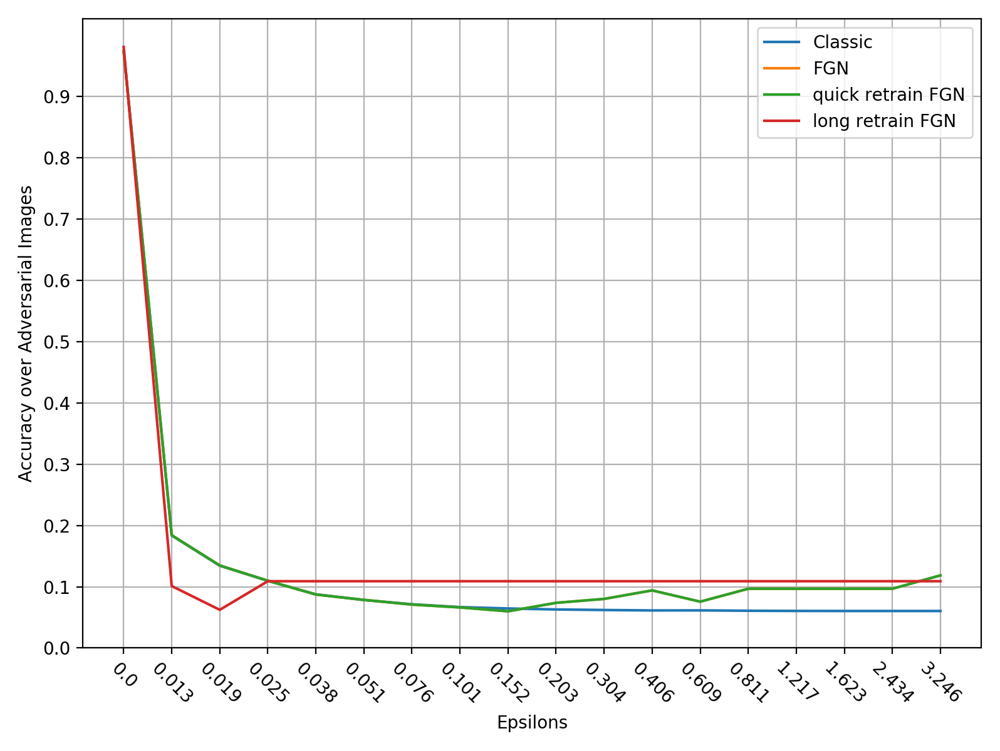

In [44]:
# compare raw success rates
print('Classic Accuracy per epsilon', 1.0 - classic_adv_success.cpu().numpy().mean(axis=-1))
print('FGN Accuracy per epsilon', 1.0 - fgn_adv_success.cpu().numpy().mean(axis=-1))
print('Quick Retrained FGN Accuracy per epsilon', 1.0 - ret_quick_fgn_adv_success.cpu().numpy().mean(axis=-1))
print('Long Retrained FGN Accuracy per epsilon', 1.0 - ret_fgn_adv_success.cpu().numpy().mean(axis=-1))

plt.plot(1.0 - classic_adv_success.cpu().numpy().mean(axis=-1), label=names[0])
plt.plot(1.0 - fgn_adv_success.cpu().numpy().mean(axis=-1), label=names[1])
plt.plot(1.0 - ret_quick_fgn_adv_success.cpu().numpy().mean(axis=-1), label=names[2])
plt.plot(1.0 - ret_fgn_adv_success.cpu().numpy().mean(axis=-1), label=names[3])
plt.legend()
plt.xticks(range(len(epsilons)), labels=np.round(epsilons,3), rotation=-45)
plt.xlabel('Epsilons')
plt.yticks([x/100 for x in range(0,100,10)])
plt.ylabel('Accuracy over Adversarial Images')
plt.tight_layout()
plt.grid()
plt.show()

In [28]:
# extract succesful adv indices
classic_successful_adv_indices = [np.flatnonzero(x) for x in classic_adv_success.cpu().numpy()]
fgn_successful_adv_indices = [np.flatnonzero(x) for x in fgn_adv_success.cpu().numpy()]
ret_quick_fgn_successful_adv_indices = [np.flatnonzero(x) for x in ret_quick_fgn_adv_success.cpu().numpy()]
ret_fgn_successful_adv_indices = [np.flatnonzero(x) for x in ret_fgn_adv_success.cpu().numpy()]

In [29]:
# extract succesful adv raw images
classic_raw_successful = [torch.stack([classic_raw[i][k] for k in j]) 
                          for i,j in enumerate(classic_successful_adv_indices)]
fgn_raw_successful = [torch.stack([fgn_raw[i][k] for k in j])
                      for i,j in enumerate(fgn_successful_adv_indices)]
ret_quick_fgn_raw_successful = [torch.stack([ret_quick_fgn_raw[i][k] for k in j])
                      for i,j in enumerate(ret_quick_fgn_successful_adv_indices)]
ret_fgn_raw_successful = [torch.stack([ret_fgn_raw[i][k] for k in j])
                      for i,j in enumerate(ret_fgn_successful_adv_indices)]

In [34]:
# per epsilon, number of attacks that both:
#  - change the class
#  - have over 0.5 confidence

per_epsilon = []

for i, clipped_images in enumerate(zip(classic_raw_successful, fgn_raw_successful, 
                                       ret_quick_fgn_raw_successful, ret_fgn_raw_successful)):
    
    per_model = [] 
    for n, model in enumerate([classic_model, fgn_model, ret_quick_fgn_model, ret_fgn_model]):
        
        # compute predictions
        model.eval()
        with torch.no_grad(): preds = model(clipped_images[n].to(device))
        preds = preds.cpu().detach().numpy()
        
        # apply softmax for probabilities
        preds_softmax = np.array([np.exp(x)/sum(np.exp(x)) for x in preds.astype('float128')])
        # get the maximums
        preds_maxes = np.max(preds_softmax, axis=1)
        
        per_model.append(len([x for x in preds_maxes if x>=0.5 ]))
    per_epsilon.append(per_model)

In [35]:
l = list(zip(*per_epsilon))

In [36]:
np.reshape(l, (3,-1))

array([[ 242, 7466, 7939, 8254, 8582, 8710, 8806, 8850, 8888, 8884, 8867,
        8869, 8890, 8902, 8915, 8921, 8924, 8928,  241, 7436, 7899, 8204,
        8527, 8664],
       [8598, 8477, 7230,  380,    0,    0,    0,    0,    0,    0,    0,
           0,  232, 7198, 7544, 7638, 7234, 4915,   17,    0,    0,    0,
           0,    0],
       [   0,    0,    0,    0,    0,    0,  173,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0]])

<IPython.core.display.Javascript object>


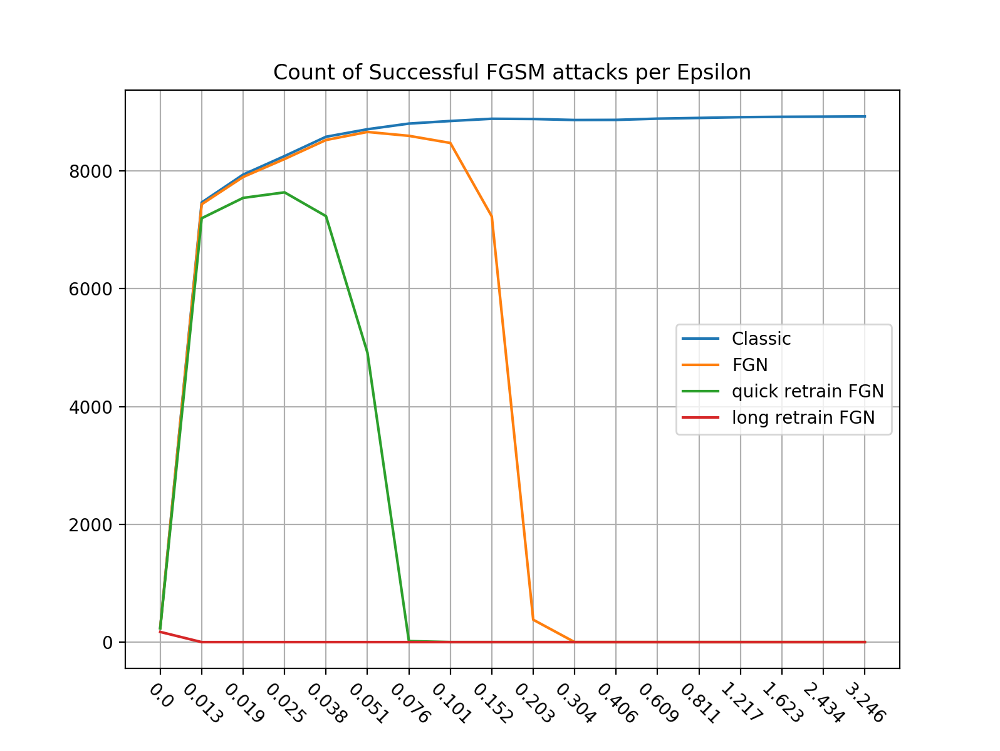

In [43]:
for n, p in enumerate(l):
    plt.plot(p, label=names[n])

plt.legend()
plt.grid()
plt.title('Count of Successful FGSM attacks per Epsilon')
plt.xticks(range(len(epsilons)), labels=np.round(epsilons,3), rotation=-45)
plt.show()

<IPython.core.display.Javascript object>


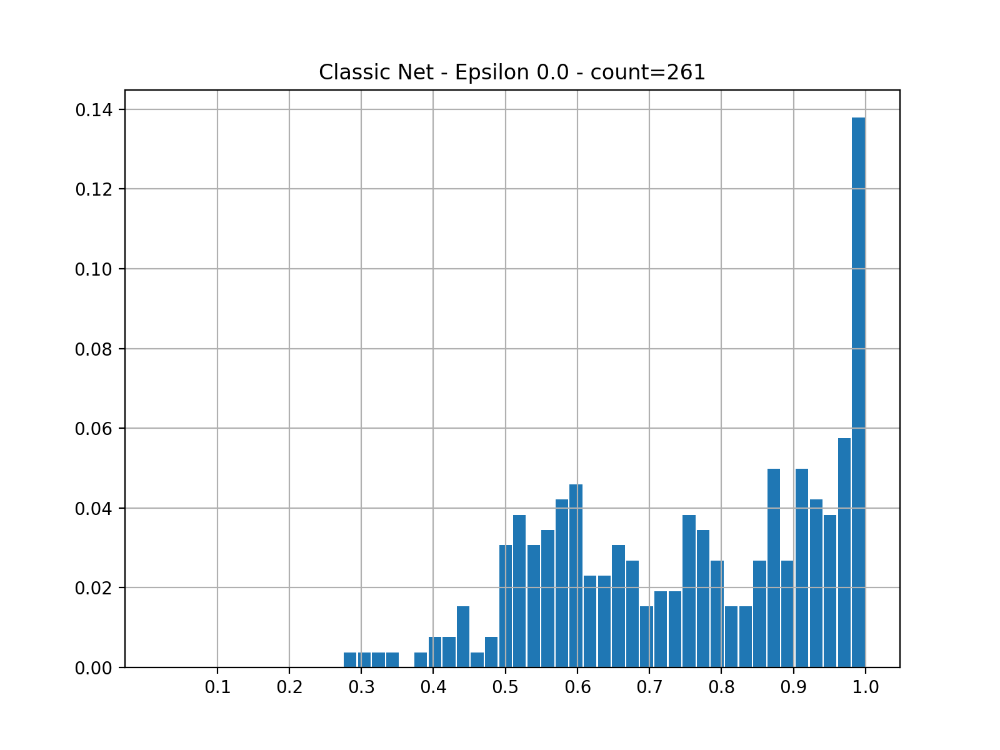

Statistical description of the predictions maximums
DescribeResult(nobs=261, minmax=(0.29110011632685737929, 0.9996037590506559124), mean=0.7599074257006415785, variance=0.03465639390731745187, skewness=-0.33914009390778317903, kurtosis=-1.0657938044938151822)

percentage of confident predictions (>=0.5): 0.9272030651340997

Sample predictions
index 167 prediction [0.   0.58 0.   0.   0.   0.   0.01 0.   0.4  0.  ]
index 215 prediction [0.06 0.   0.01 0.01 0.   0.79 0.   0.11 0.01 0.01]
index 156 prediction [0.   0.   0.   0.   0.65 0.   0.   0.   0.   0.35]
index 84 prediction [0.   0.   0.09 0.84 0.   0.   0.   0.06 0.   0.  ]
index 211 prediction [0.05 0.   0.   0.   0.   0.   0.95 0.   0.   0.  ]


<IPython.core.display.Javascript object>


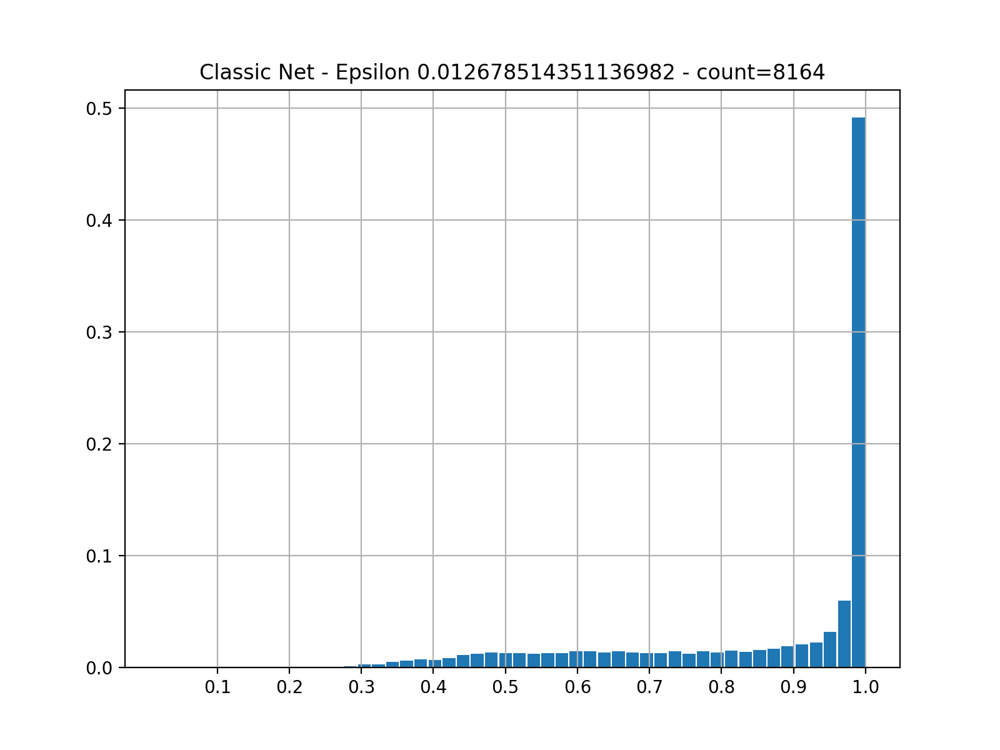

Statistical description of the predictions maximums
DescribeResult(nobs=8164, minmax=(0.24249966696543011364, 0.9998695873899203364), mean=0.85789989090215941725, variance=0.037412275516363100543, skewness=-1.2266297204167266706, kurtosis=0.17754480073307695354)

percentage of confident predictions (>=0.5): 0.9145026947574718

Sample predictions
index 3147 prediction [0.   0.09 0.01 0.03 0.   0.08 0.   0.77 0.   0.01]
index 7239 prediction [0.   0.06 0.01 0.07 0.   0.51 0.   0.34 0.   0.01]
index 475 prediction [0.02 0.   0.01 0.   0.   0.   0.03 0.   0.93 0.  ]
index 470 prediction [0.   0.   0.   0.03 0.   0.   0.   0.97 0.   0.  ]
index 7566 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


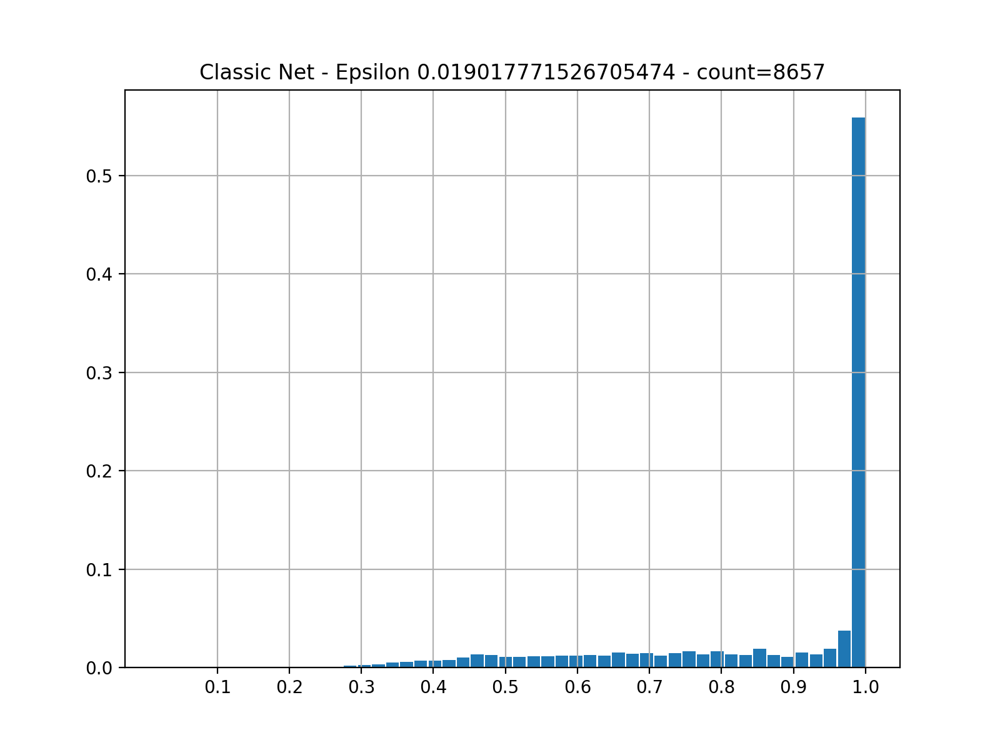

Statistical description of the predictions maximums
DescribeResult(nobs=8657, minmax=(0.21731576020601171981, 0.9996466225005953176), mean=0.8656857167851497674, variance=0.03715446831936001695, skewness=-1.2934959739068031101, kurtosis=0.37251433700728797454)

percentage of confident predictions (>=0.5): 0.9170613376458358

Sample predictions
index 5333 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7858 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 1429 prediction [0.02 0.   0.   0.   0.   0.05 0.07 0.   0.86 0.  ]
index 387 prediction [0.   0.04 0.16 0.06 0.   0.6  0.   0.15 0.   0.  ]
index 2132 prediction [0.04 0.   0.02 0.07 0.   0.   0.   0.   0.86 0.  ]


<IPython.core.display.Javascript object>


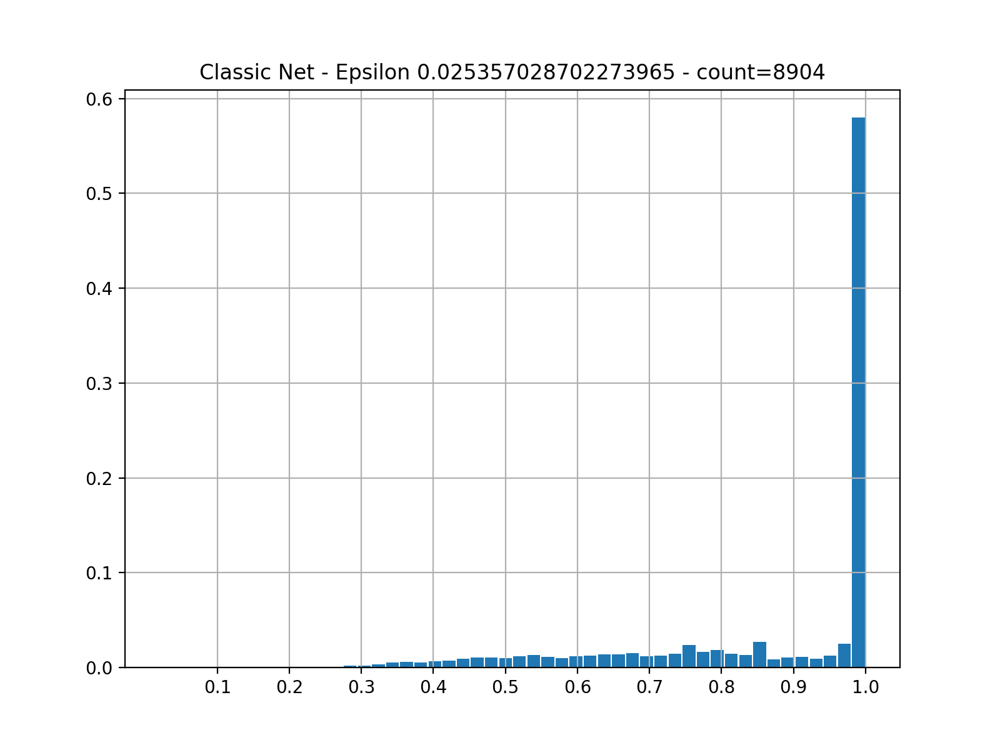

Statistical description of the predictions maximums
DescribeResult(nobs=8904, minmax=(0.2512833841680644898, 0.9997198632064433602), mean=0.8693424523022297685, variance=0.03569012040005153656, skewness=-1.3115088153564873592, kurtosis=0.48167994905661271087)

percentage of confident predictions (>=0.5): 0.9269991015274034

Sample predictions
index 2605 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 1201 prediction [0.   0.01 0.07 0.06 0.   0.37 0.   0.49 0.   0.  ]
index 5816 prediction [0.   0.04 0.03 0.08 0.   0.2  0.   0.64 0.   0.  ]
index 3121 prediction [0.   0.03 0.03 0.04 0.   0.13 0.   0.76 0.   0.01]
index 4710 prediction [0.   0.01 0.   0.01 0.52 0.01 0.   0.01 0.   0.44]


<IPython.core.display.Javascript object>


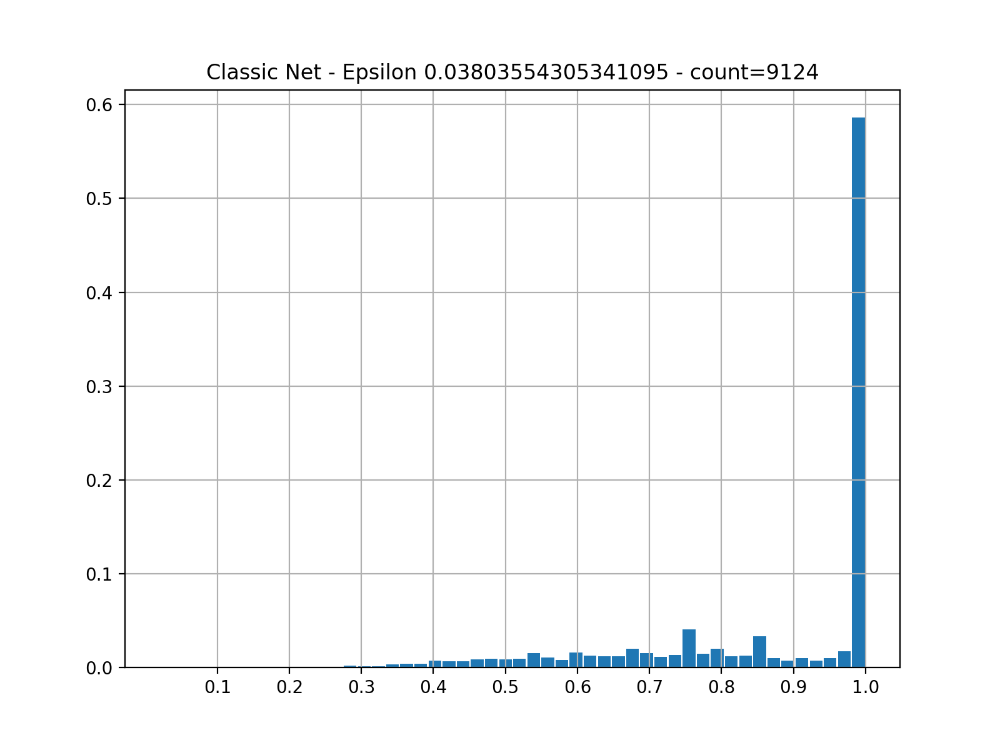

Statistical description of the predictions maximums
DescribeResult(nobs=9124, minmax=(0.23734453882552130628, 0.99986406431948585566), mean=0.87364286143413100183, variance=0.032905843836749946332, skewness=-1.3012156648293659851, kurtosis=0.53912810541799287777)

percentage of confident predictions (>=0.5): 0.9405962297238053

Sample predictions
index 2931 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 2153 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 6001 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7042 prediction [0.   0.24 0.16 0.07 0.   0.06 0.   0.47 0.   0.  ]
index 1626 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


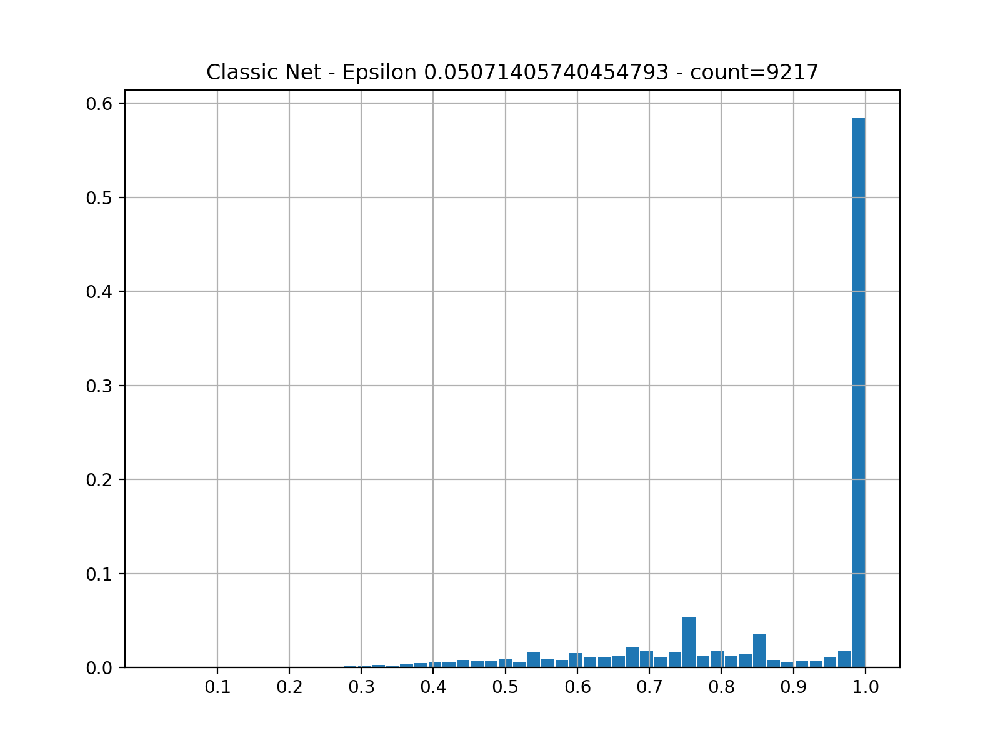

Statistical description of the predictions maximums
DescribeResult(nobs=9217, minmax=(0.20423752303909171011, 0.99978701079455173676), mean=0.875301586553090466, variance=0.03164784345679492863, skewness=-1.3087241124173632569, kurtosis=0.65056545906398558204)

percentage of confident predictions (>=0.5): 0.9449929478138223

Sample predictions
index 1053 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 2914 prediction [0.   0.03 0.07 0.05 0.   0.12 0.   0.73 0.   0.  ]
index 564 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7529 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]
index 8109 prediction [0.01 0.13 0.2  0.01 0.36 0.   0.14 0.02 0.07 0.06]


<IPython.core.display.Javascript object>


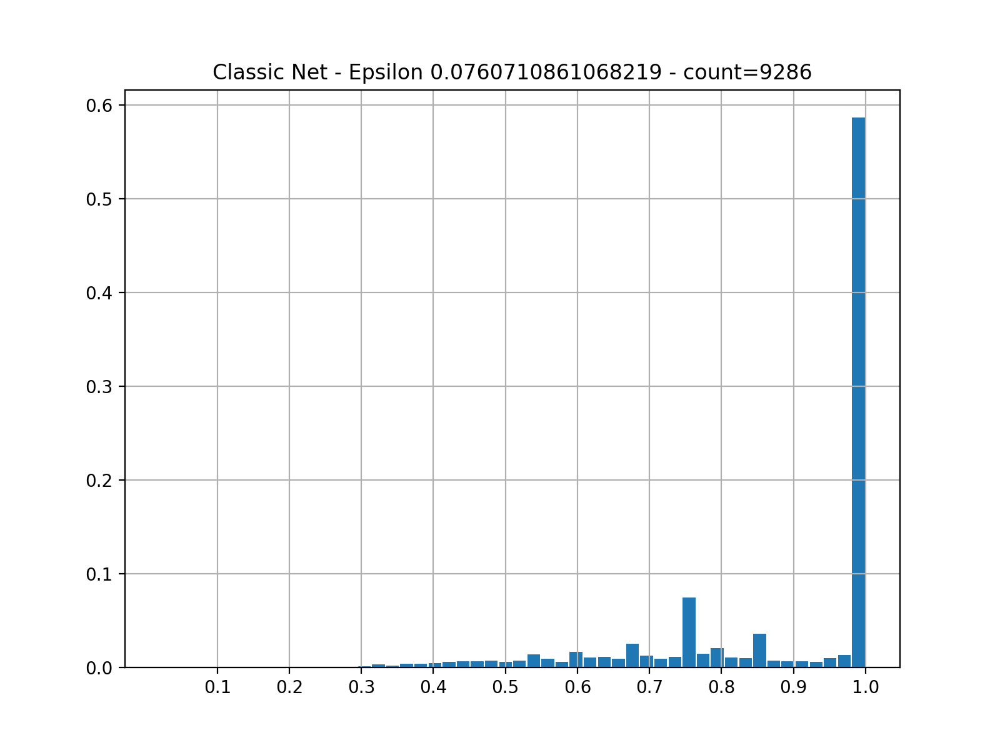

Statistical description of the predictions maximums
DescribeResult(nobs=9286, minmax=(0.23884676395569333686, 0.9998616589841937355), mean=0.87635593175888735985, variance=0.030696105774170878403, skewness=-1.3010757528539862442, kurtosis=0.6704206549521918874)

percentage of confident predictions (>=0.5): 0.9483092827912988

Sample predictions
index 71 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7251 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 2893 prediction [0.   0.03 0.06 0.05 0.   0.09 0.   0.76 0.   0.  ]
index 1262 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]
index 7798 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]


<IPython.core.display.Javascript object>


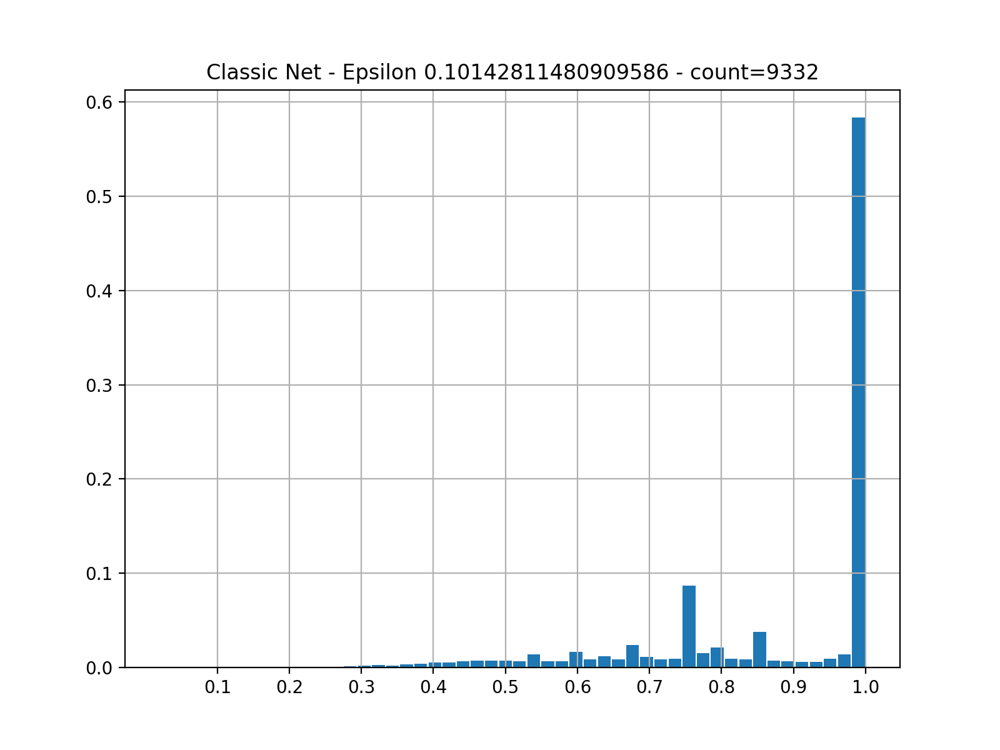

Statistical description of the predictions maximums
DescribeResult(nobs=9332, minmax=(0.23285154099231035369, 0.99986938070663361824), mean=0.87620583966384743774, variance=0.030582420804589035437, skewness=-1.3107579115633702042, kurtosis=0.7472868712768311302)

percentage of confident predictions (>=0.5): 0.948349764252036

Sample predictions
index 4414 prediction [0.   0.03 0.02 0.03 0.   0.04 0.   0.86 0.   0.01]
index 3025 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 2782 prediction [0.   0.07 0.05 0.09 0.   0.1  0.   0.68 0.   0.  ]
index 75 prediction [0.   0.   0.   0.01 0.01 0.78 0.18 0.   0.02 0.  ]
index 6504 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]


<IPython.core.display.Javascript object>


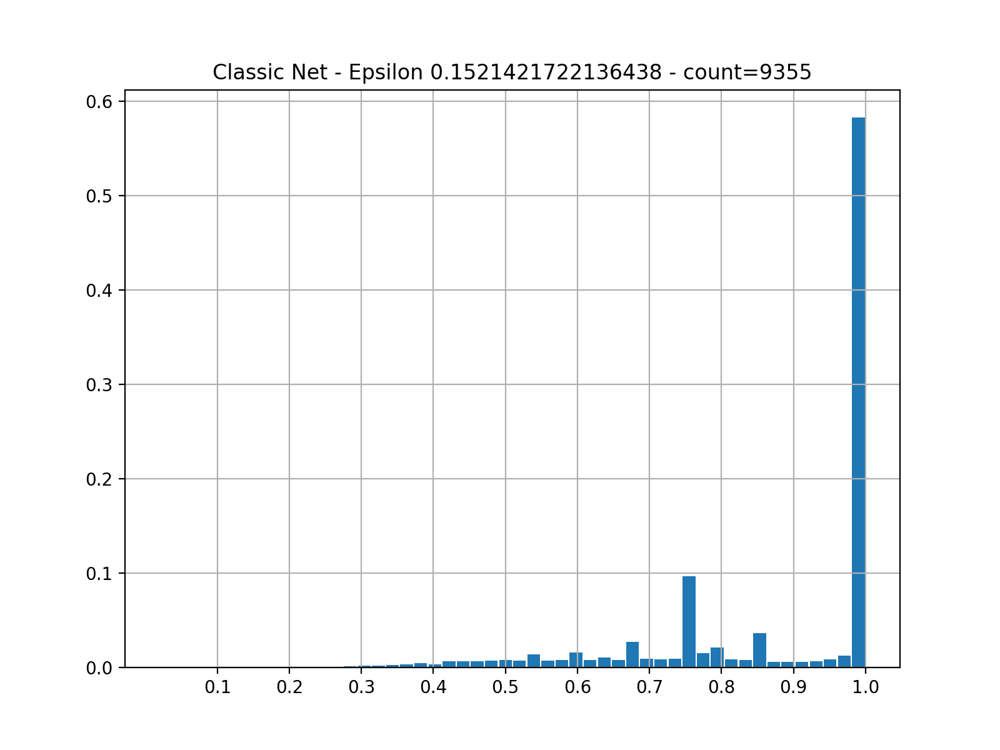

Statistical description of the predictions maximums
DescribeResult(nobs=9355, minmax=(0.22881198804235850075, 0.99986915116113910743), mean=0.87564140611658339194, variance=0.030299848439759117458, skewness=-1.278440560970991675, kurtosis=0.6480038966790297036)

percentage of confident predictions (>=0.5): 0.950080171031534

Sample predictions
index 2592 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7723 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 1309 prediction [0.   0.06 0.02 0.05 0.   0.05 0.   0.8  0.   0.  ]
index 2792 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 614 prediction [0.   0.04 0.5  0.39 0.   0.02 0.   0.05 0.   0.  ]


<IPython.core.display.Javascript object>


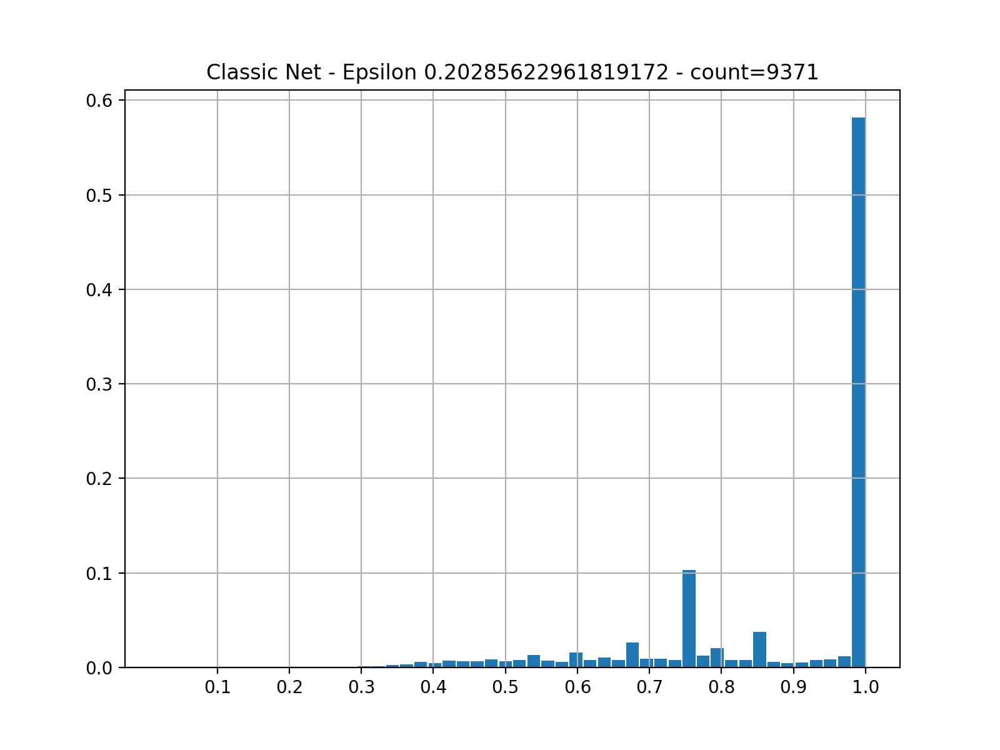

Statistical description of the predictions maximums
DescribeResult(nobs=9371, minmax=(0.22892331478930153615, 0.99986737226782236104), mean=0.8751452275792041238, variance=0.03035455901078521035, skewness=-1.2714532652244772544, kurtosis=0.6260818515726405075)

percentage of confident predictions (>=0.5): 0.9480311599615836

Sample predictions
index 2209 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 8302 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 980 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]
index 5847 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 5791 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


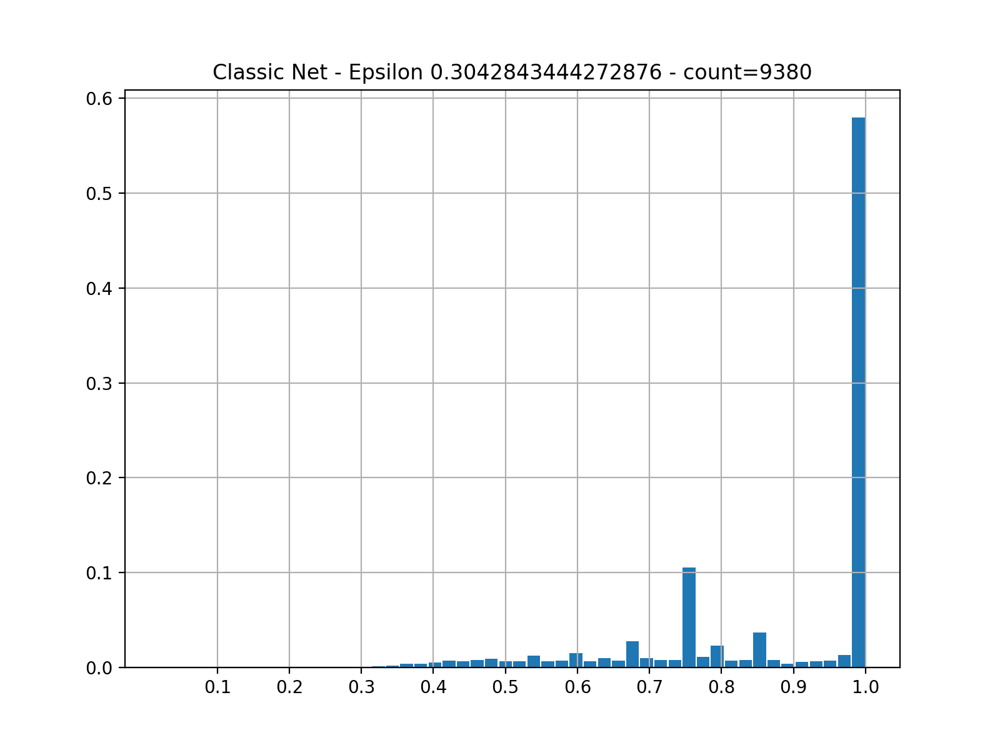

Statistical description of the predictions maximums
DescribeResult(nobs=9380, minmax=(0.21755519271548009403, 0.9998362024855096646), mean=0.87491173770949006214, variance=0.030410952310460713552, skewness=-1.2750477920894972345, kurtosis=0.64312463113408895065)

percentage of confident predictions (>=0.5): 0.9453091684434968

Sample predictions
index 3593 prediction [0.   0.22 0.01 0.11 0.   0.63 0.   0.03 0.   0.  ]
index 7869 prediction [0.   0.16 0.08 0.08 0.   0.14 0.   0.54 0.   0.  ]
index 8508 prediction [0.   0.07 0.05 0.09 0.   0.1  0.   0.68 0.   0.  ]
index 3653 prediction [0.   0.04 0.05 0.07 0.   0.29 0.   0.54 0.   0.01]
index 115 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]


<IPython.core.display.Javascript object>


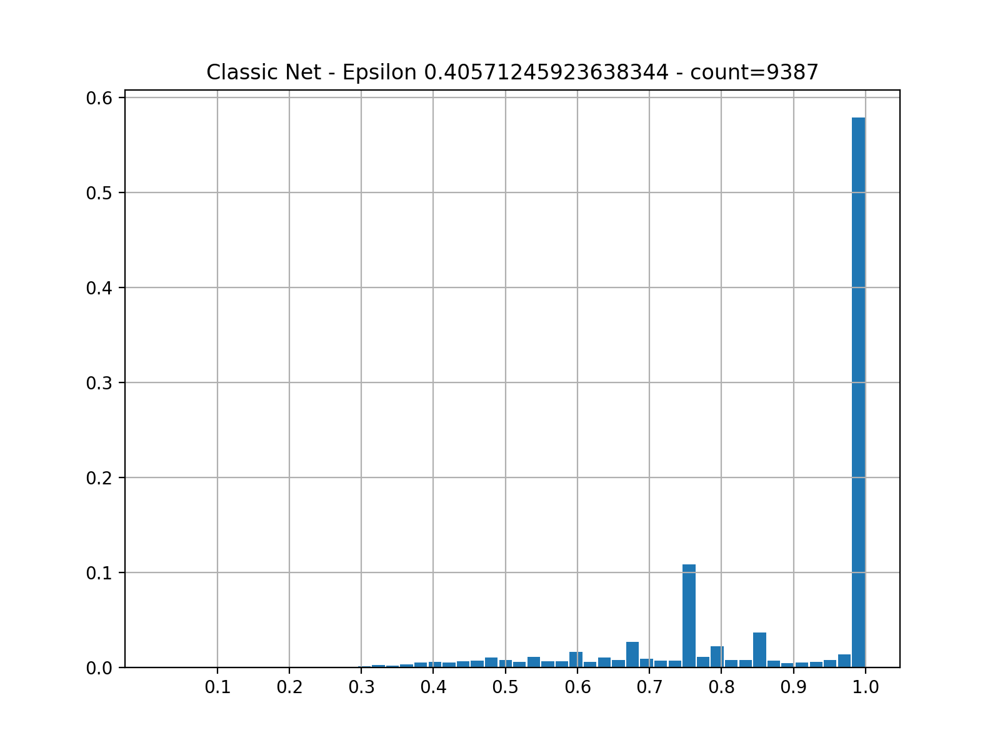

Statistical description of the predictions maximums
DescribeResult(nobs=9387, minmax=(0.2124911048629340603, 0.99977084965758548945), mean=0.8747023255473938041, variance=0.030481353481481150755, skewness=-1.2784723088736831912, kurtosis=0.6611490399087565084)

percentage of confident predictions (>=0.5): 0.9448173005219985

Sample predictions
index 9076 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]
index 9345 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 5994 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4807 prediction [0.5  0.   0.   0.   0.   0.05 0.13 0.   0.32 0.  ]
index 8524 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]


<IPython.core.display.Javascript object>


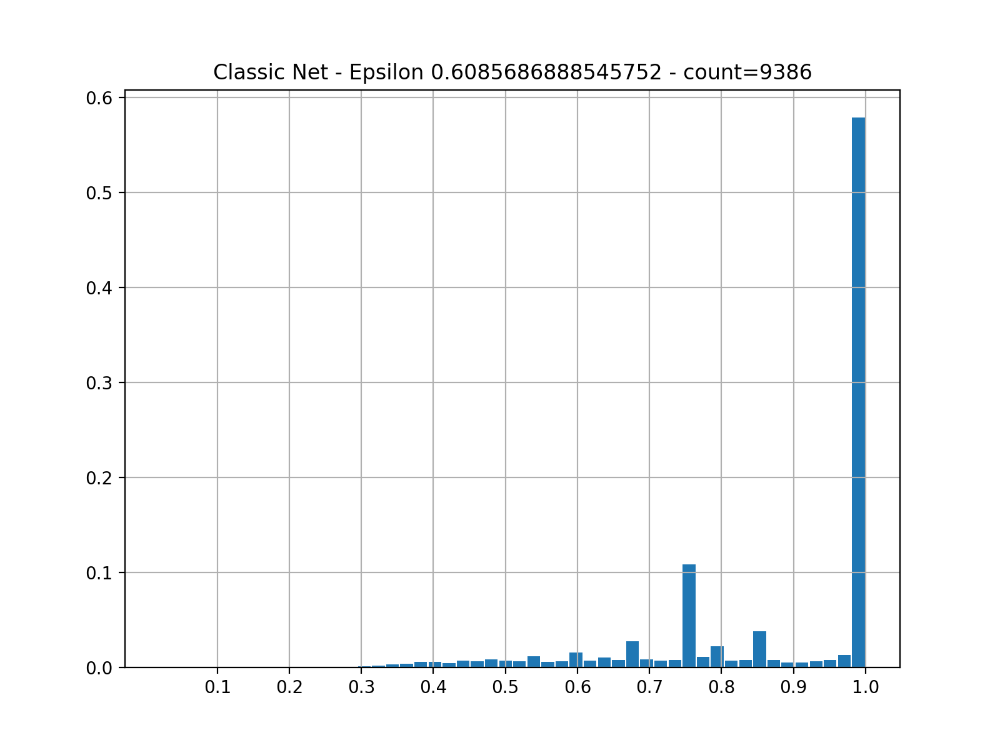

Statistical description of the predictions maximums
DescribeResult(nobs=9386, minmax=(0.24164235792452918614, 0.9997166791664497586), mean=0.8752396805624452437, variance=0.030166213009489860393, skewness=-1.2794524828736156602, kurtosis=0.67098148216454813397)

percentage of confident predictions (>=0.5): 0.9471553377370552

Sample predictions
index 7371 prediction [0.62 0.   0.17 0.01 0.12 0.   0.04 0.   0.01 0.02]
index 1746 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 6665 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 3146 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 8405 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


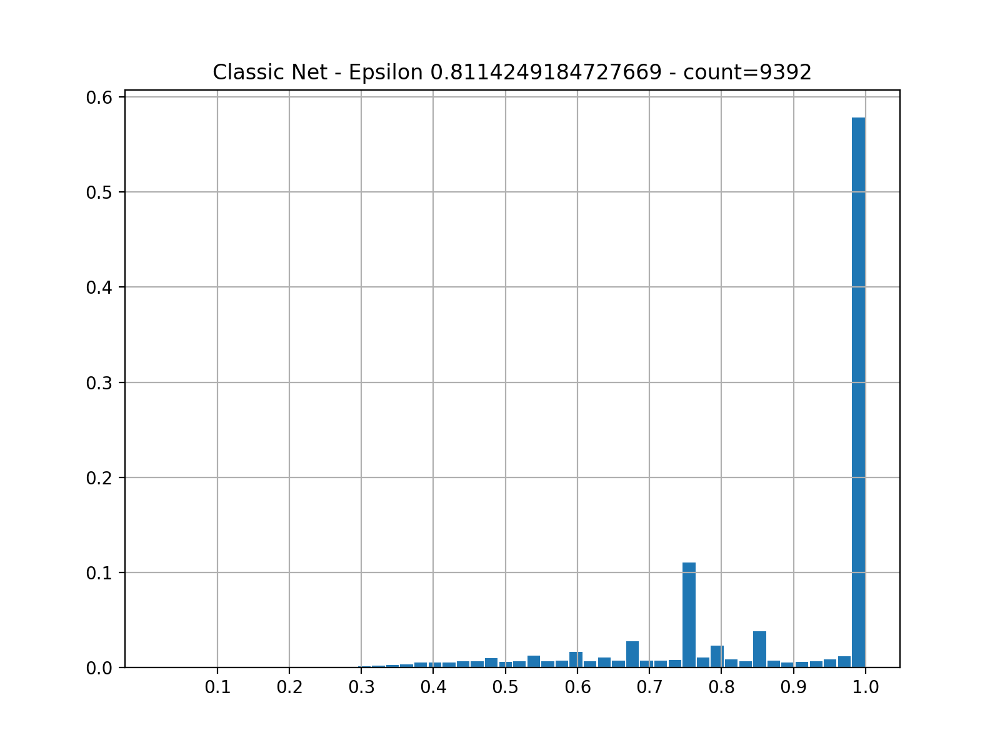

Statistical description of the predictions maximums
DescribeResult(nobs=9392, minmax=(0.24164235792452918614, 0.99959825550880191725), mean=0.8755263365787768196, variance=0.029958073997094798863, skewness=-1.2759423871564005755, kurtosis=0.66059922648987148006)

percentage of confident predictions (>=0.5): 0.9478279386712095

Sample predictions
index 5263 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4222 prediction [0.   0.   0.   0.   0.   0.01 0.   0.   0.98 0.  ]
index 7625 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4174 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 704 prediction [0.   0.18 0.01 0.07 0.   0.09 0.   0.64 0.   0.  ]


/home/felix/Research/Adversarial Research/FGN---Research/Finite_Gaussian_Network_lib/fgn_helper_lib/plot_pred_histogram.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.hist(preds_maxes, bins=(np.arange(51)+1)/51.0, rwidth=0.9, align='mid', weights=weights)


<IPython.core.display.Javascript object>


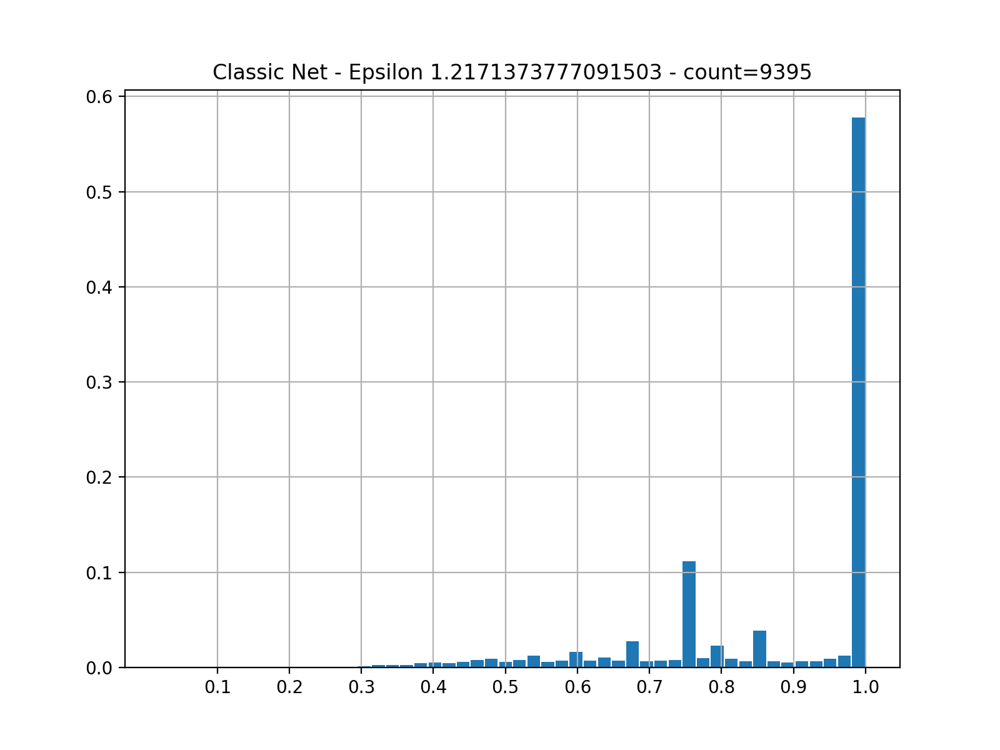

Statistical description of the predictions maximums
DescribeResult(nobs=9395, minmax=(0.24164235792452918614, 0.99951060590053743136), mean=0.8758148712185404431, variance=0.029707530687757607043, skewness=-1.2666541381475619058, kurtosis=0.6286395687685830101)

percentage of confident predictions (>=0.5): 0.9489089941458222

Sample predictions
index 6811 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 5199 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 5512 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 9163 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 2655 prediction [0.   0.47 0.03 0.03 0.   0.07 0.   0.4  0.   0.  ]


<IPython.core.display.Javascript object>


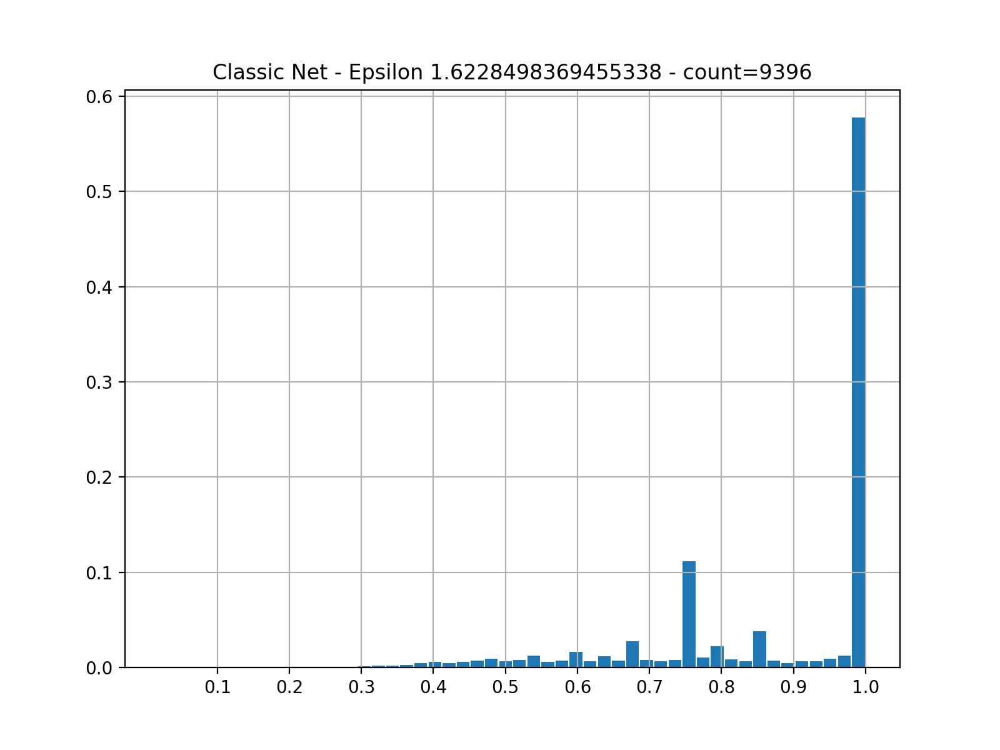

Statistical description of the predictions maximums
DescribeResult(nobs=9396, minmax=(0.24164235792452918614, 0.99951060590053743136), mean=0.87581266323766771974, variance=0.029603477013745459584, skewness=-1.2586877895440488758, kurtosis=0.597790204067814198)

percentage of confident predictions (>=0.5): 0.9494465730097914

Sample predictions
index 1537 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 3720 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 68 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7427 prediction [0.16 0.04 0.   0.01 0.01 0.3  0.04 0.   0.34 0.08]
index 3141 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


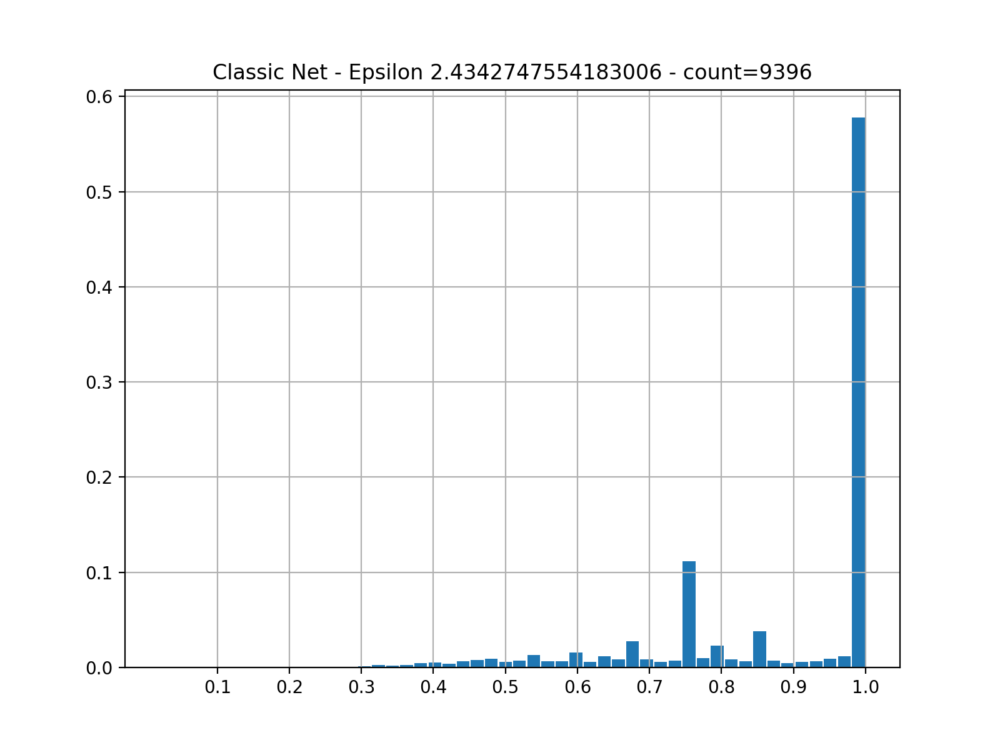

Statistical description of the predictions maximums
DescribeResult(nobs=9396, minmax=(0.2179368463048585105, 0.99951060590053743136), mean=0.8758216517031647333, variance=0.029598603079537477936, skewness=-1.2616296933881567679, kurtosis=0.62078125622600262463)

percentage of confident predictions (>=0.5): 0.9497658578118349

Sample predictions
index 8112 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 726 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 1977 prediction [0.   0.01 0.   0.03 0.   0.94 0.   0.   0.   0.02]
index 3977 prediction [0.   0.06 0.02 0.06 0.   0.09 0.   0.76 0.   0.01]
index 8225 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]


<IPython.core.display.Javascript object>


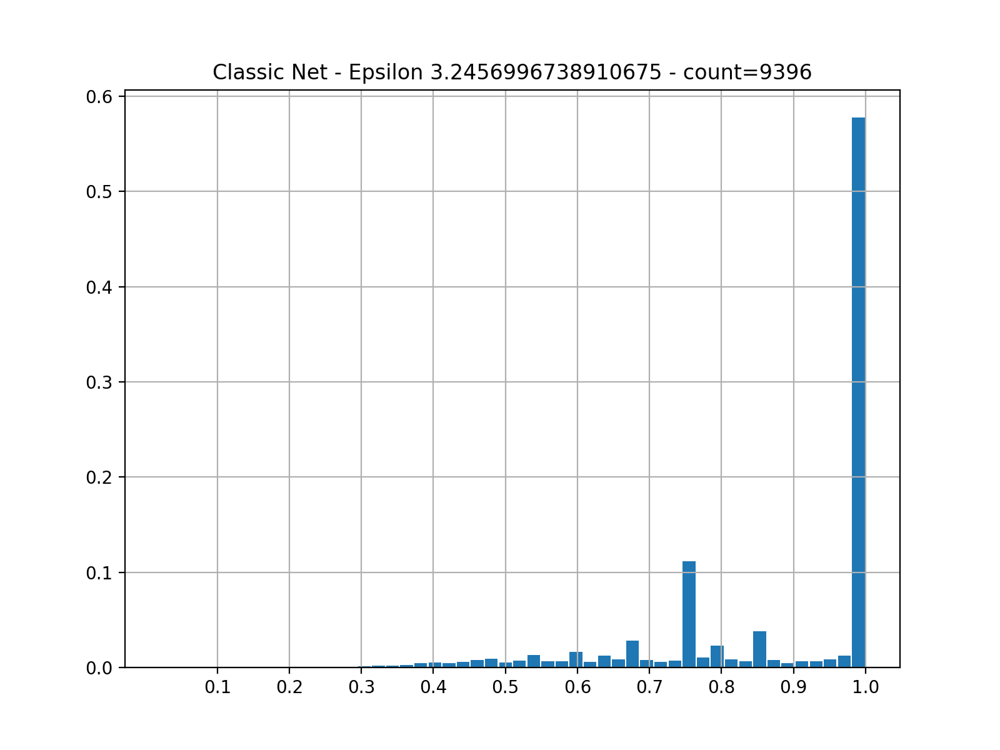

Statistical description of the predictions maximums
DescribeResult(nobs=9396, minmax=(0.21240274398103499289, 0.99951060590053743136), mean=0.87587041387235072925, variance=0.029537846707450732489, skewness=-1.2594158350506115419, kurtosis=0.6145507943938530711)

percentage of confident predictions (>=0.5): 0.9501915708812261

Sample predictions
index 5383 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 5627 prediction [0.   0.2  0.03 0.04 0.   0.06 0.   0.67 0.   0.  ]
index 5137 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 6321 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]
index 5455 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


In [45]:
# rerun the classic model on adv examples
for i ,classic_raw_images in enumerate(classic_raw_successful):
    # turn to dataloader
    dl =  torch.utils.data.DataLoader(torch.utils.data.TensorDataset(classic_raw_images))
    t = 'Classic Net - Epsilon {} - count={}'.format(epsilons[i], len(dl))
    fgnh.plot_pred_histogram(classic_model, dl, title=t, verbose=True)

<IPython.core.display.Javascript object>


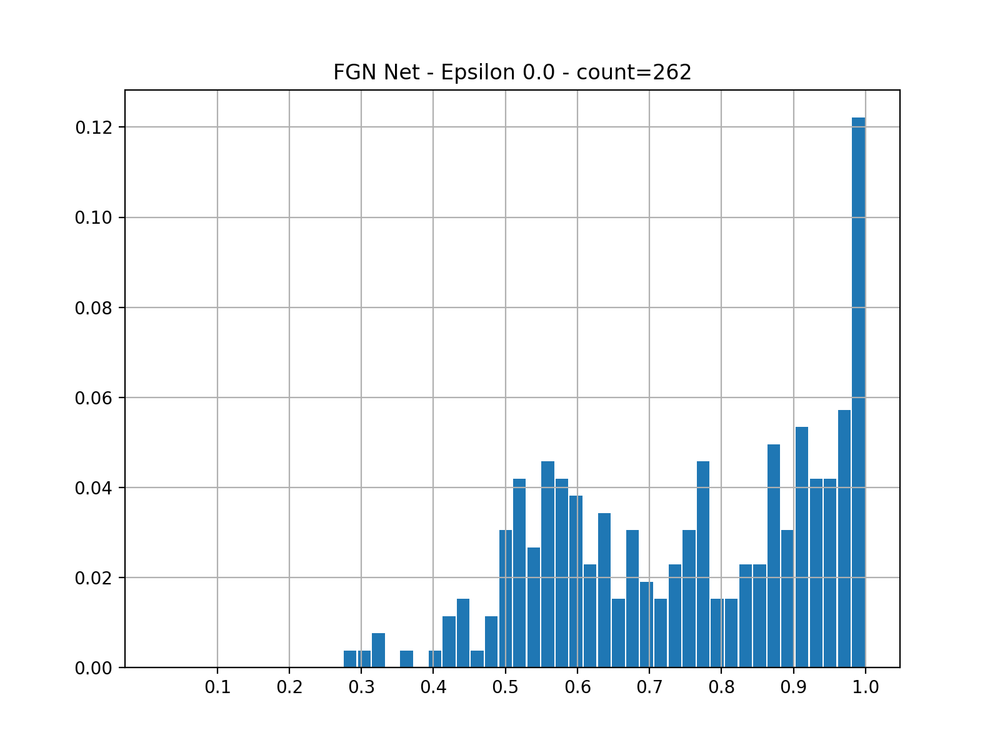

Statistical description of the predictions maximums
DescribeResult(nobs=262, minmax=(0.29119806468827166002, 0.99955582930392399785), mean=0.75594673782860445285, variance=0.03489153032371614901, skewness=-0.31839200167131375094, kurtosis=-1.0829211282329371352)

percentage of confident predictions (>=0.5): 0.9198473282442748

Sample predictions
index 165 prediction [0.   0.   0.   0.88 0.   0.12 0.   0.   0.   0.  ]
index 209 prediction [0.01 0.   0.34 0.03 0.   0.   0.   0.6  0.01 0.  ]
index 13 prediction [0.   0.   0.   0.   0.99 0.   0.   0.   0.   0.  ]
index 17 prediction [0.   0.74 0.07 0.01 0.   0.   0.   0.15 0.02 0.  ]
index 218 prediction [0.   0.   0.39 0.02 0.   0.   0.   0.59 0.   0.  ]


<IPython.core.display.Javascript object>


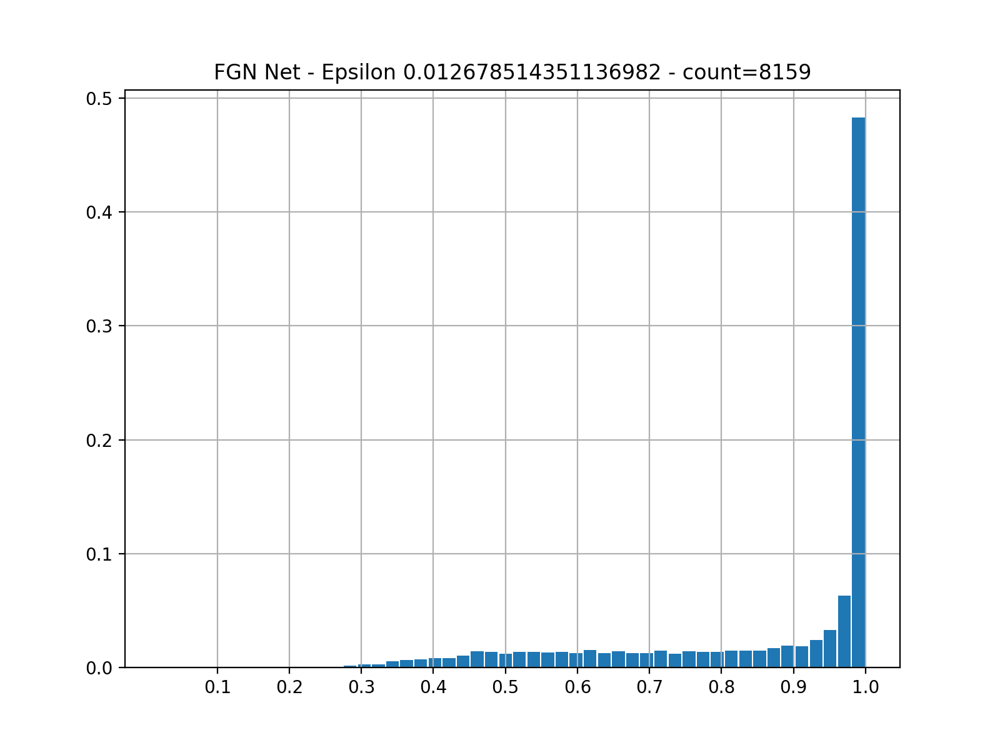

Statistical description of the predictions maximums
DescribeResult(nobs=8159, minmax=(0.24090360324181722268, 0.9997276546426861892), mean=0.8549821147318284229, variance=0.038195878209444536112, skewness=-1.2045228232516492431, kurtosis=0.106789985183781689334)

percentage of confident predictions (>=0.5): 0.9113861992891286

Sample predictions
index 3582 prediction [0.   0.   0.   0.   0.   0.   0.01 0.   0.99 0.  ]
index 179 prediction [0.01 0.   0.   0.04 0.   0.01 0.   0.   0.94 0.  ]
index 1404 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7313 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4490 prediction [0.   0.12 0.15 0.14 0.   0.38 0.   0.21 0.   0.  ]


<IPython.core.display.Javascript object>


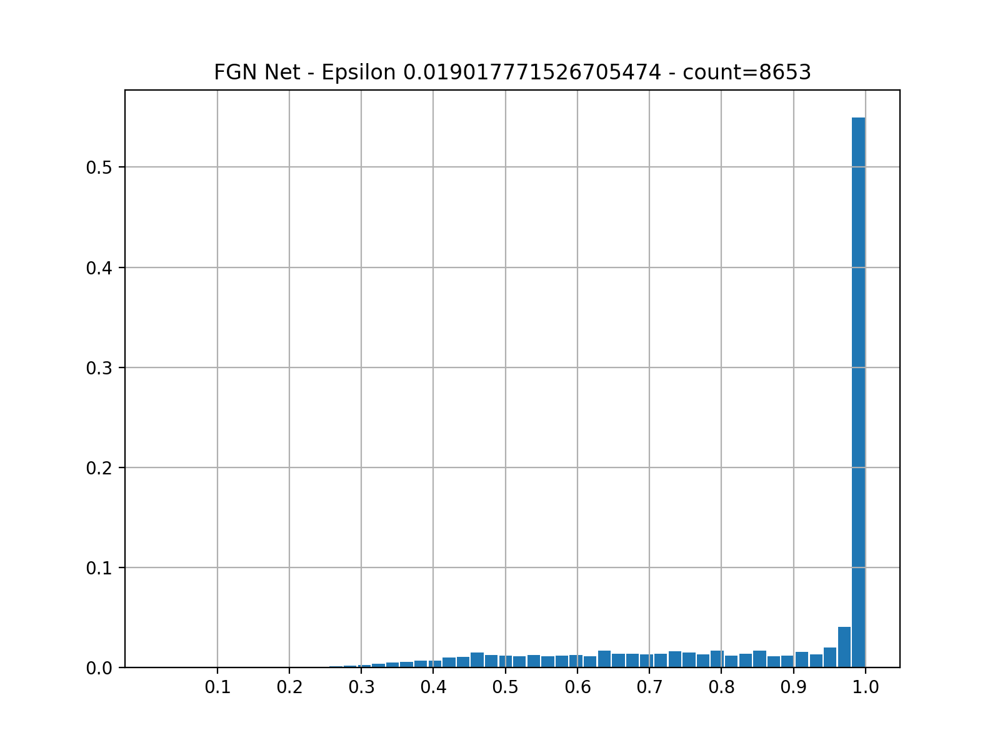

Statistical description of the predictions maximums
DescribeResult(nobs=8653, minmax=(0.21784912772759922292, 0.9997075213019313471), mean=0.86181281635640096417, variance=0.03809961697831909428, skewness=-1.2547341243792211106, kurtosis=0.2524333049224887287)

percentage of confident predictions (>=0.5): 0.9128625910088987

Sample predictions
index 6906 prediction [0.   0.   0.   0.01 0.   0.   0.   0.   0.98 0.  ]
index 6742 prediction [0.16 0.   0.01 0.68 0.   0.01 0.   0.   0.1  0.04]
index 7037 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4054 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 1520 prediction [0.   0.02 0.05 0.05 0.   0.36 0.01 0.51 0.   0.  ]


<IPython.core.display.Javascript object>


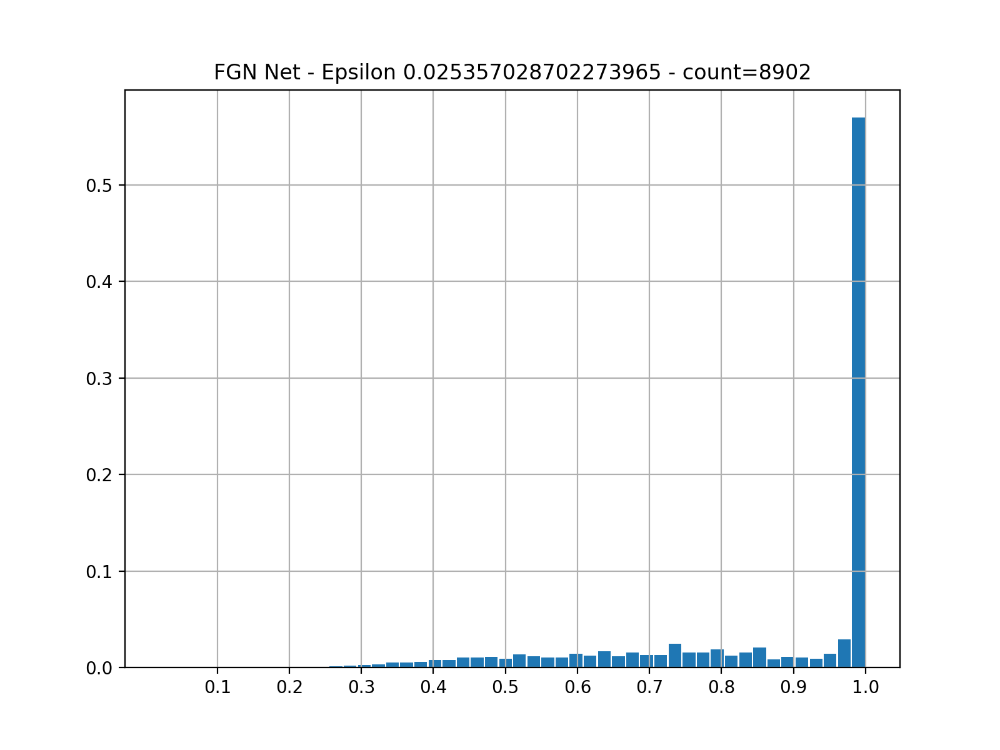

Statistical description of the predictions maximums
DescribeResult(nobs=8902, minmax=(0.23814337281136188019, 0.9996435156632306943), mean=0.8643953091716768145, variance=0.03702456875867575759, skewness=-1.2643030162594384497, kurtosis=0.33832161476253907561)

percentage of confident predictions (>=0.5): 0.9215906537856662

Sample predictions
index 2095 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 2591 prediction [0.   0.03 0.06 0.06 0.   0.13 0.   0.71 0.   0.  ]
index 820 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 3052 prediction [0.   0.07 0.05 0.1  0.   0.11 0.   0.67 0.   0.  ]
index 698 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


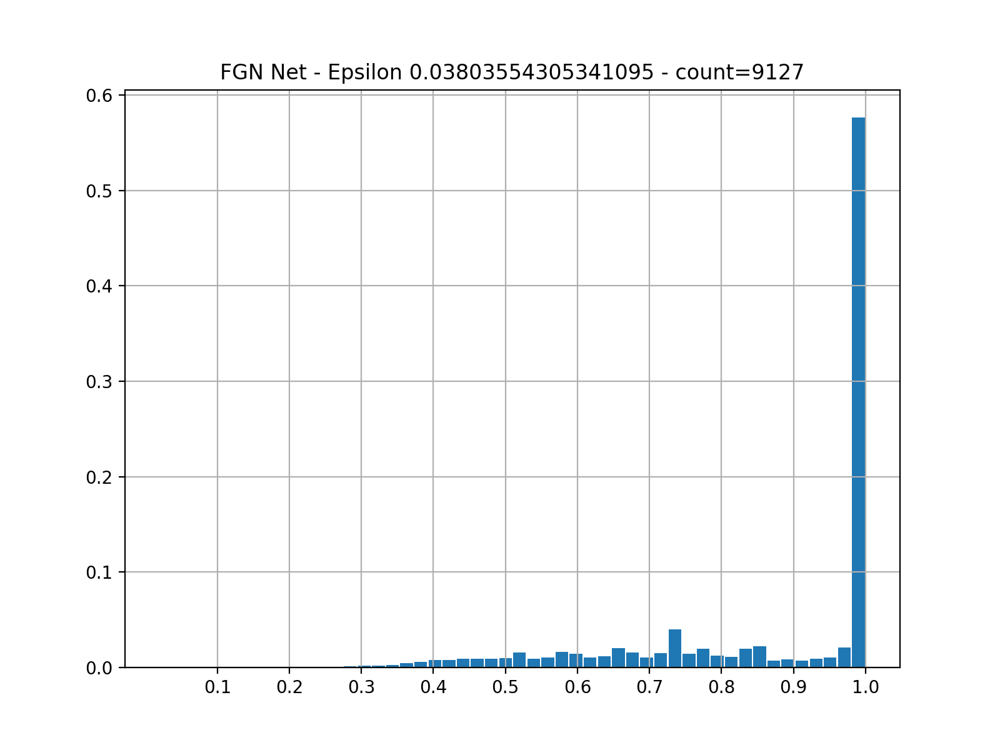

Statistical description of the predictions maximums
DescribeResult(nobs=9127, minmax=(0.22865736939020860907, 0.9997866386525312555), mean=0.86547572252817742274, variance=0.034938364395116772714, skewness=-1.207688088841258965, kurtosis=0.22231974605788553268)

percentage of confident predictions (>=0.5): 0.9342609838939411

Sample predictions
index 358 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 3241 prediction [0.   0.02 0.01 0.44 0.   0.   0.   0.53 0.   0.  ]
index 2543 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 9057 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 5091 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]


<IPython.core.display.Javascript object>


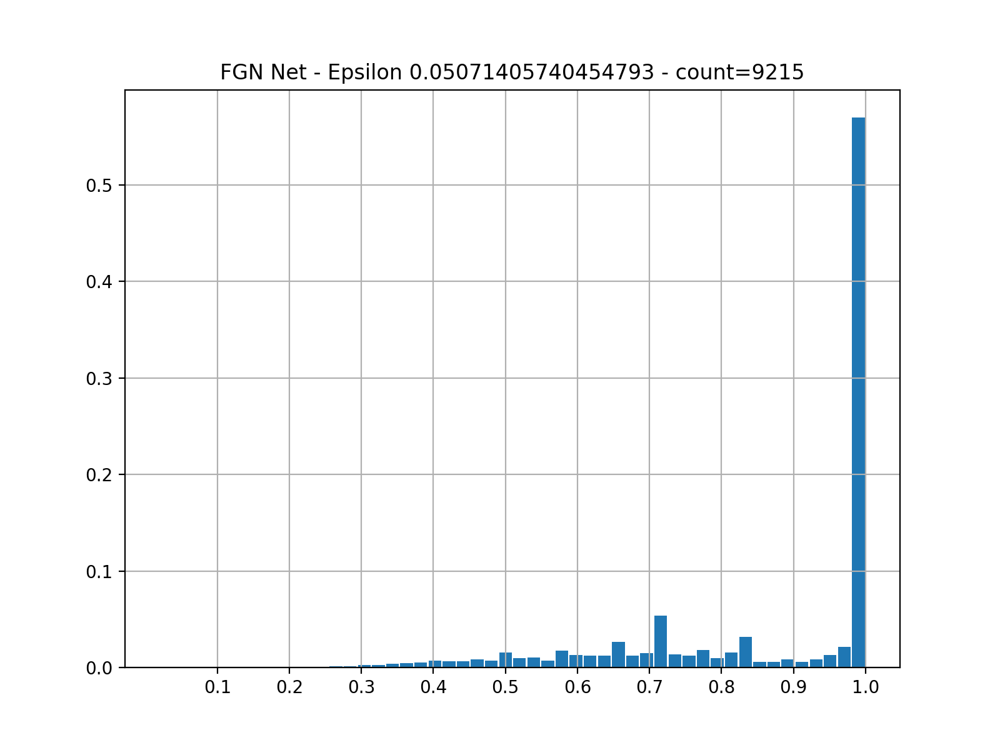

Statistical description of the predictions maximums
DescribeResult(nobs=9215, minmax=(0.22337330275287405024, 0.9997865512552910561), mean=0.86284259417170226103, variance=0.034777203511487950883, skewness=-1.1780651589720797308, kurtosis=0.20907184818874209576)

percentage of confident predictions (>=0.5): 0.9402061855670103

Sample predictions
index 8281 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 5021 prediction [0.   0.04 0.07 0.06 0.   0.11 0.   0.72 0.   0.  ]
index 296 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 8802 prediction [0.   0.04 0.07 0.06 0.   0.11 0.   0.72 0.   0.  ]
index 5870 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


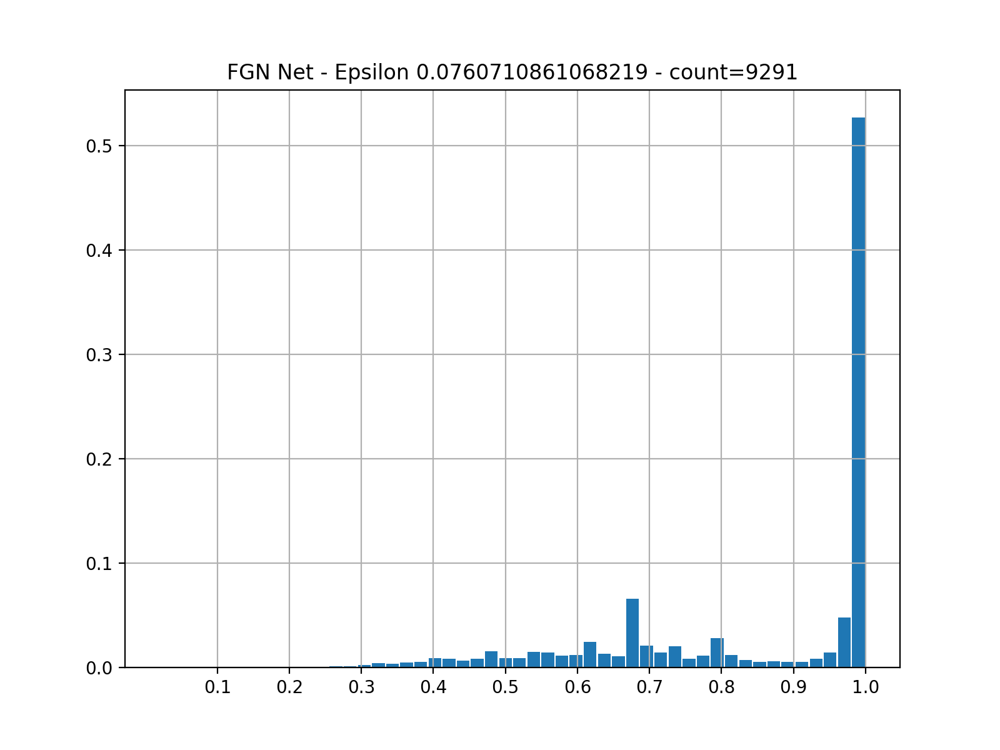

Statistical description of the predictions maximums
DescribeResult(nobs=9291, minmax=(0.17133526477209970423, 0.99940201430837996127), mean=0.8476968497640246319, variance=0.037404560678048661672, skewness=-1.0375850784991017304, kurtosis=-0.1819661505145881025)

percentage of confident predictions (>=0.5): 0.9254116887310301

Sample predictions
index 2827 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 2968 prediction [0.   0.03 0.06 0.13 0.   0.39 0.   0.39 0.   0.  ]
index 70 prediction [0.   0.04 0.08 0.07 0.   0.12 0.   0.69 0.   0.01]
index 5441 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 7350 prediction [0.   0.04 0.06 0.1  0.   0.24 0.   0.54 0.   0.  ]


<IPython.core.display.Javascript object>


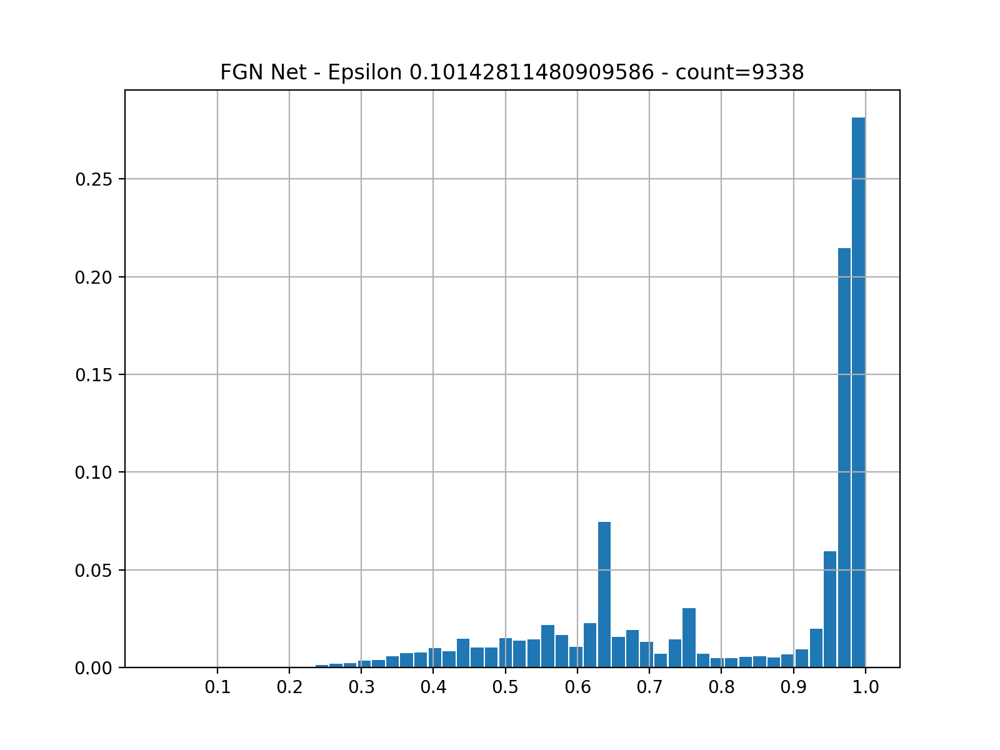

Statistical description of the predictions maximums
DescribeResult(nobs=9338, minmax=(0.20776391233642218458, 0.99833772868356771896), mean=0.8198460833655377749, variance=0.04128563629137260718, skewness=-0.8756760480213545981, kurtosis=-0.60878191413499027954)

percentage of confident predictions (>=0.5): 0.9077961019490255

Sample predictions
index 514 prediction [0.   0.   0.   0.01 0.   0.   0.   0.   0.98 0.  ]
index 7167 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 3475 prediction [0.   0.   0.   0.01 0.   0.01 0.   0.   0.97 0.01]
index 2533 prediction [0.16 0.1  0.24 0.15 0.2  0.01 0.08 0.   0.04 0.01]
index 4281 prediction [0.01 0.   0.   0.   0.   0.   0.   0.   0.98 0.  ]


<IPython.core.display.Javascript object>


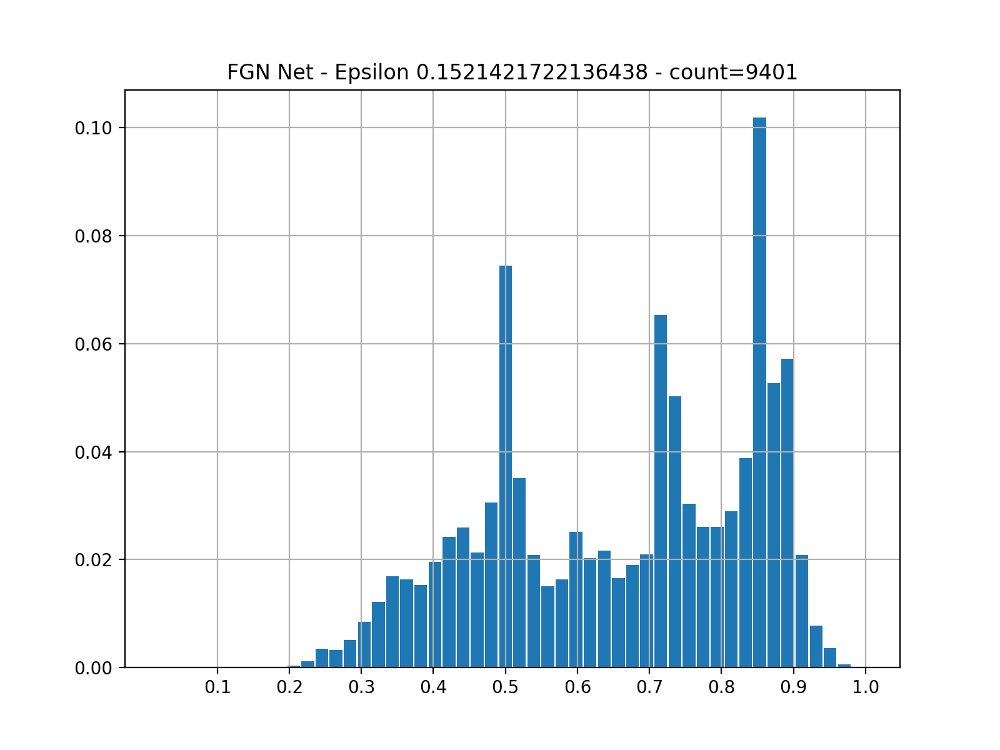

Statistical description of the predictions maximums
DescribeResult(nobs=9401, minmax=(0.18128330492435360644, 0.98931486087387688835), mean=0.66368931700154118697, variance=0.03289205240139766219, skewness=-0.34898857508677600173, kurtosis=-1.1038419566281781259)

percentage of confident predictions (>=0.5): 0.7690671205190938

Sample predictions
index 2061 prediction [0.   0.01 0.02 0.05 0.   0.03 0.   0.01 0.85 0.02]
index 7235 prediction [0.   0.07 0.11 0.12 0.01 0.16 0.01 0.5  0.   0.01]
index 6524 prediction [0.   0.07 0.11 0.12 0.01 0.16 0.01 0.5  0.   0.01]
index 2024 prediction [0.   0.03 0.03 0.13 0.01 0.13 0.   0.03 0.6  0.03]
index 7623 prediction [0.   0.08 0.07 0.09 0.   0.11 0.   0.62 0.   0.02]


<IPython.core.display.Javascript object>


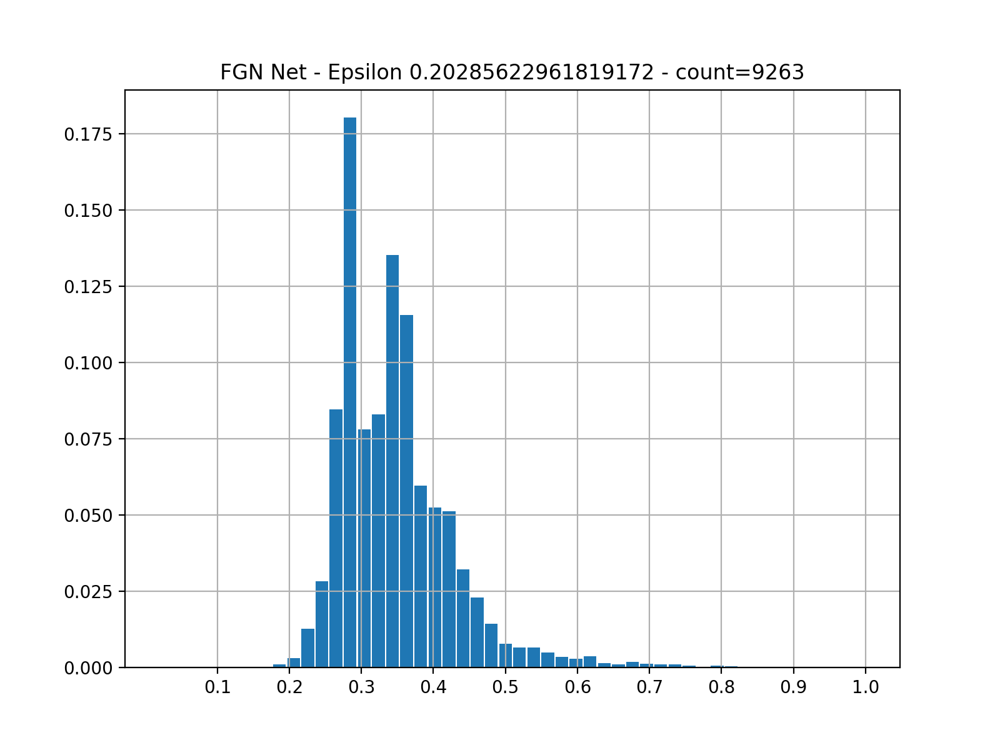

Statistical description of the predictions maximums
DescribeResult(nobs=9263, minmax=(0.17209482424242407015, 0.9501356334529561613), mean=0.3459725095444887849, variance=0.0061945346409573265585, skewness=1.563944476134925049, kurtosis=4.4452100893899338897)

percentage of confident predictions (>=0.5): 0.041023426535679586

Sample predictions
index 7330 prediction [0.01 0.07 0.08 0.24 0.02 0.12 0.01 0.09 0.27 0.11]
index 5606 prediction [0.01 0.03 0.07 0.22 0.01 0.14 0.01 0.05 0.4  0.06]
index 6537 prediction [0.   0.1  0.14 0.16 0.02 0.19 0.01 0.36 0.   0.03]
index 8922 prediction [0.02 0.05 0.27 0.41 0.   0.09 0.04 0.02 0.08 0.02]
index 4314 prediction [0.   0.09 0.13 0.15 0.01 0.19 0.01 0.38 0.   0.03]


<IPython.core.display.Javascript object>


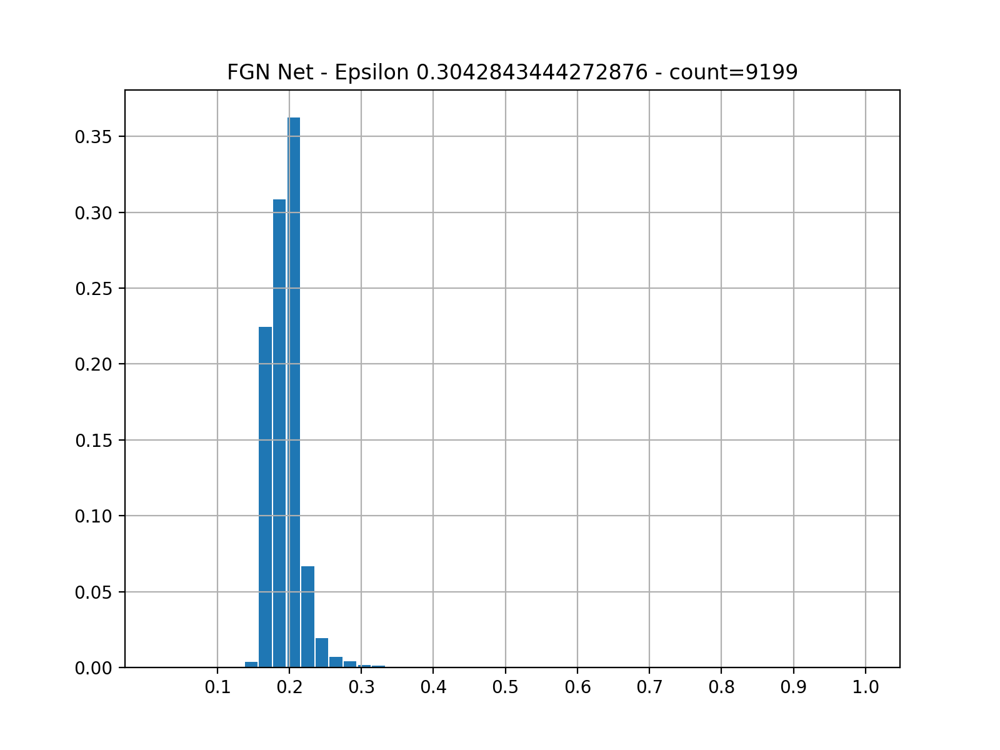

Statistical description of the predictions maximums
DescribeResult(nobs=9199, minmax=(0.1505404653153568634, 0.48685524668786223063), mean=0.19455016023238301045, variance=0.00045359034447090544189, skewness=2.0180345434492915956, kurtosis=12.600361026703813533)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 7184 prediction [0.02 0.12 0.14 0.17 0.06 0.17 0.06 0.16 0.04 0.06]
index 1679 prediction [0.03 0.07 0.15 0.23 0.04 0.16 0.04 0.11 0.12 0.06]
index 2964 prediction [0.02 0.09 0.12 0.22 0.04 0.19 0.03 0.14 0.09 0.06]
index 4980 prediction [0.03 0.1  0.13 0.19 0.05 0.16 0.05 0.12 0.1  0.07]
index 615 prediction [0.02 0.1  0.13 0.19 0.05 0.17 0.04 0.13 0.09 0.07]


<IPython.core.display.Javascript object>


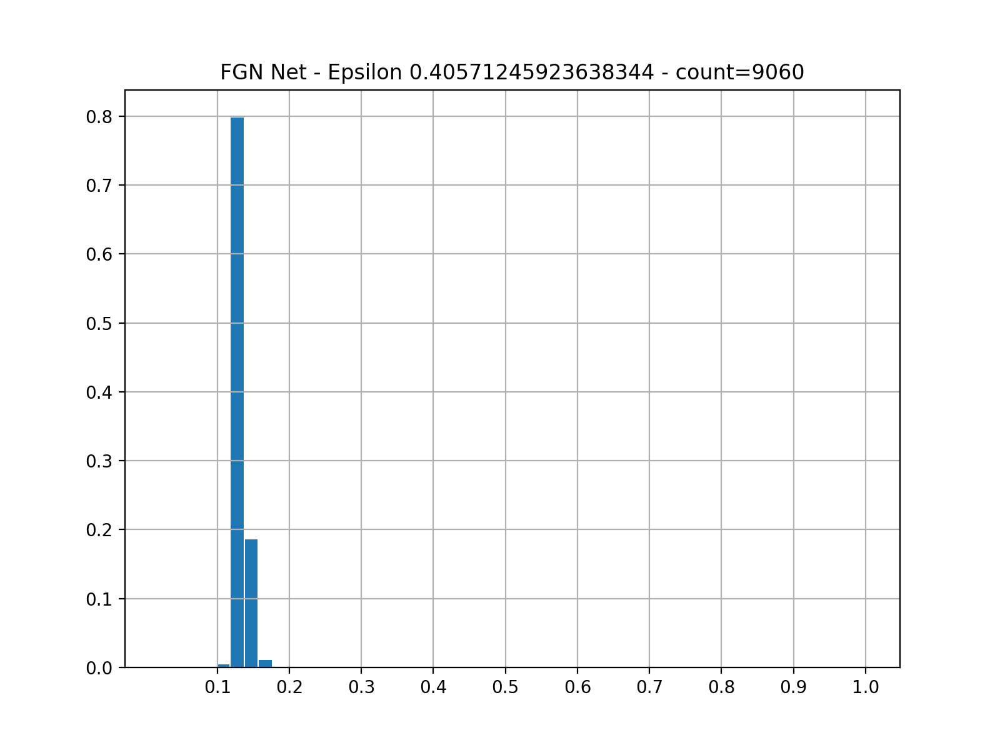

Statistical description of the predictions maximums
DescribeResult(nobs=9060, minmax=(0.112866043162513063176, 0.20465743030269047441), mean=0.1329879363139026744, variance=5.133811930462179971e-05, skewness=1.6815022491066468775, kurtosis=6.6733772793666899245)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1338 prediction [0.05 0.11 0.12 0.14 0.08 0.13 0.09 0.1  0.1  0.08]
index 5029 prediction [0.05 0.11 0.12 0.14 0.08 0.13 0.09 0.1  0.1  0.08]
index 107 prediction [0.05 0.11 0.12 0.13 0.09 0.13 0.1  0.09 0.1  0.08]
index 2984 prediction [0.06 0.11 0.12 0.12 0.09 0.12 0.1  0.09 0.1  0.08]
index 3075 prediction [0.06 0.11 0.12 0.13 0.09 0.12 0.1  0.09 0.1  0.08]


<IPython.core.display.Javascript object>


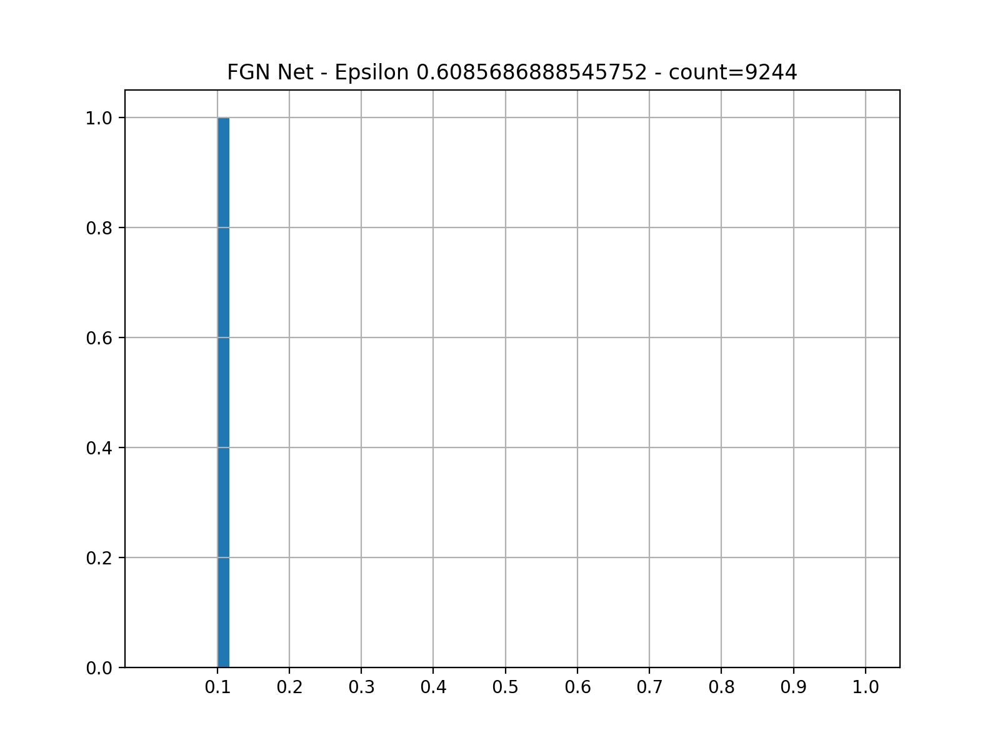

Statistical description of the predictions maximums
DescribeResult(nobs=9244, minmax=(0.100713699910929307225, 0.11274223350514381394), mean=0.1033421603829642438, variance=1.4632448037754936479e-06, skewness=2.1470769803655621222, kurtosis=7.801624242535164999)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 4113 prediction [0.09 0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1 ]
index 5378 prediction [0.09 0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1 ]
index 8338 prediction [0.09 0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1 ]
index 9031 prediction [0.09 0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1 ]
index 6850 prediction [0.09 0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1 ]


<IPython.core.display.Javascript object>


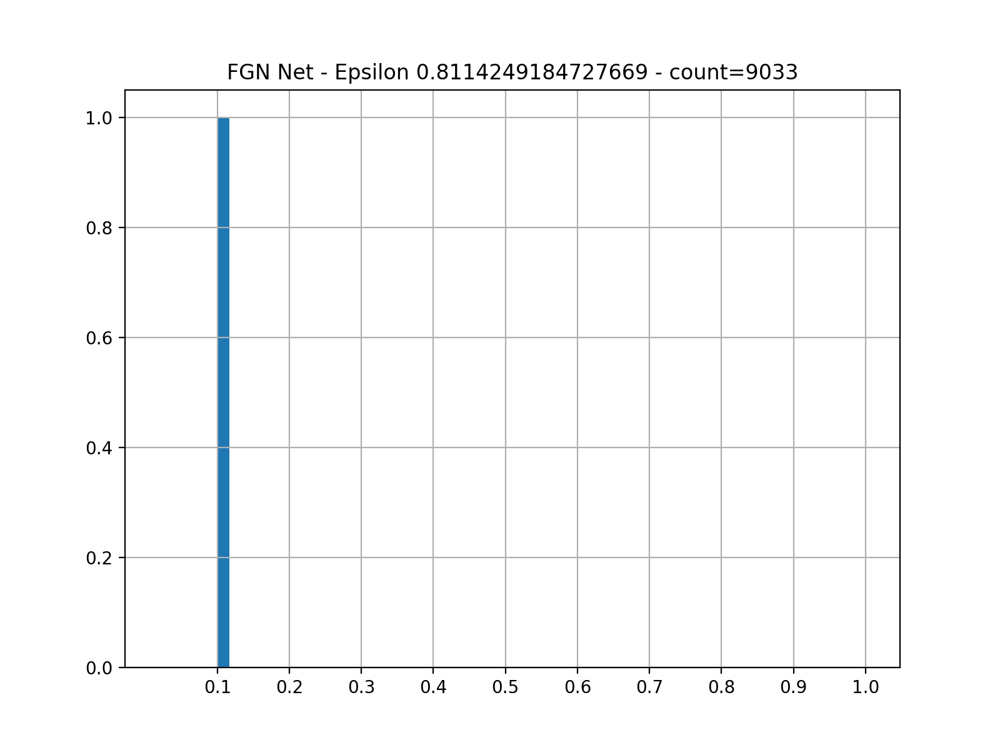

Statistical description of the predictions maximums
DescribeResult(nobs=9033, minmax=(0.100013341403778898115, 0.10193598498470638217), mean=0.10025819540674112352, variance=2.9821015262562771293e-08, skewness=3.0294183986379416282, kurtosis=14.589762067810114161)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 7065 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2828 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2428 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8081 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5279 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


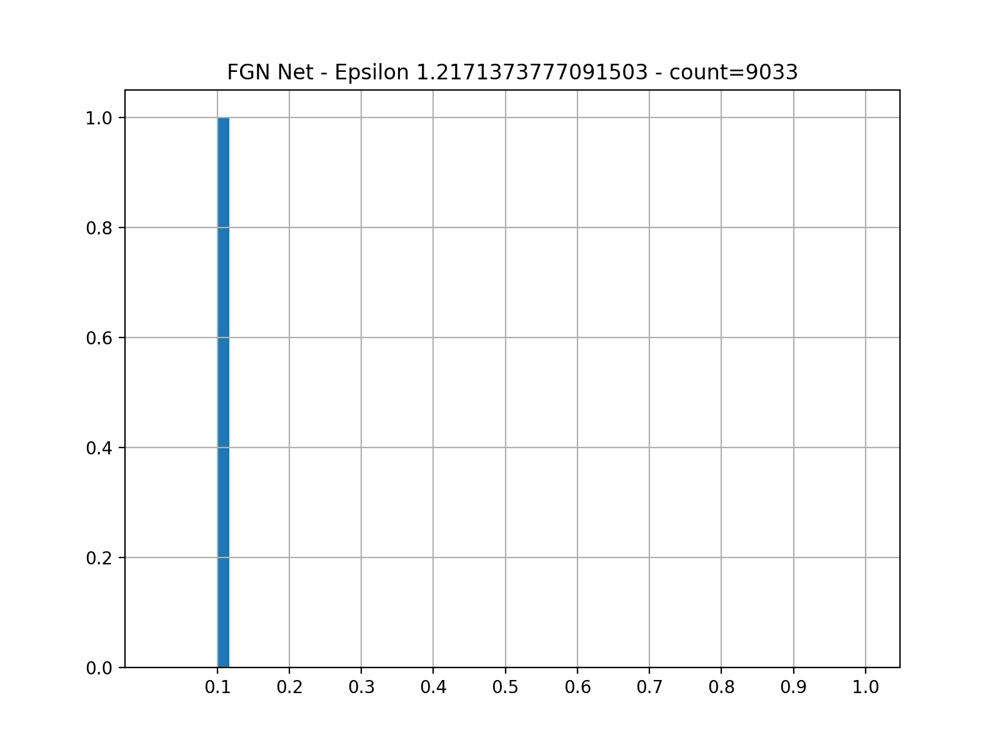

Statistical description of the predictions maximums
DescribeResult(nobs=9033, minmax=(0.1000000001415887997, 0.10001260363805565964), mean=0.100000201266695963865, variance=3.0862368561992838164e-13, skewness=10.0108722101057642535, kurtosis=142.44001657964742458)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 3135 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2280 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 452 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6311 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3229 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


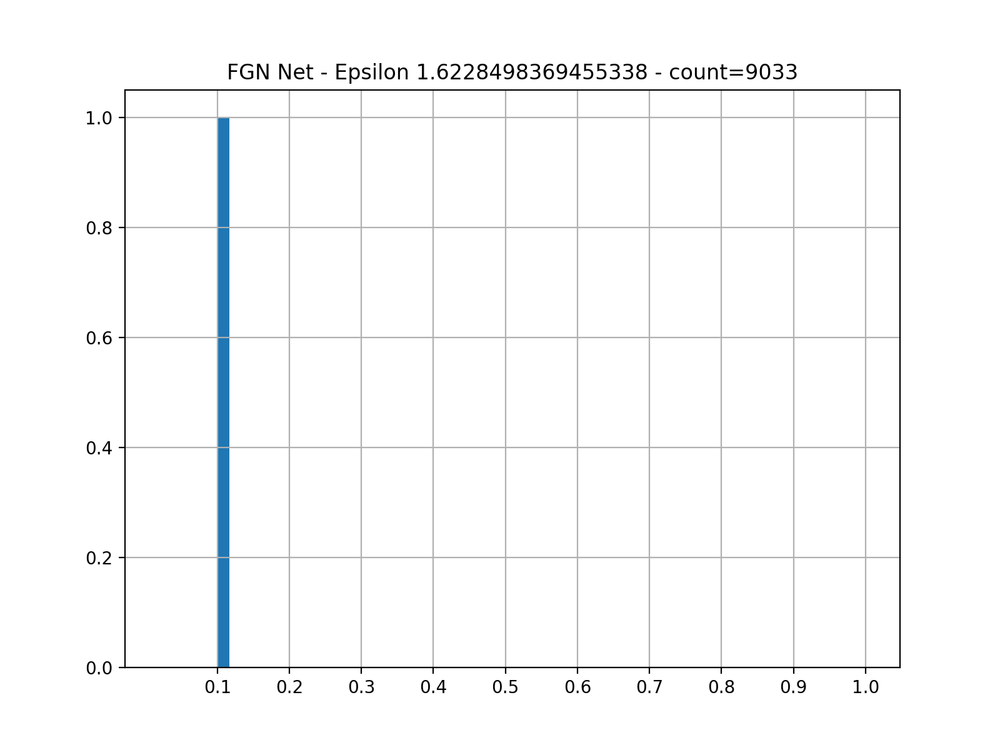

Statistical description of the predictions maximums
DescribeResult(nobs=9033, minmax=(0.10000000000000001537, 0.1000000096905411382), mean=0.10000000002856834153, variance=6.6904945219695303586e-20, skewness=22.087596539992172503, kurtosis=640.0116584189140257)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6129 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 596 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7657 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1666 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1148 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


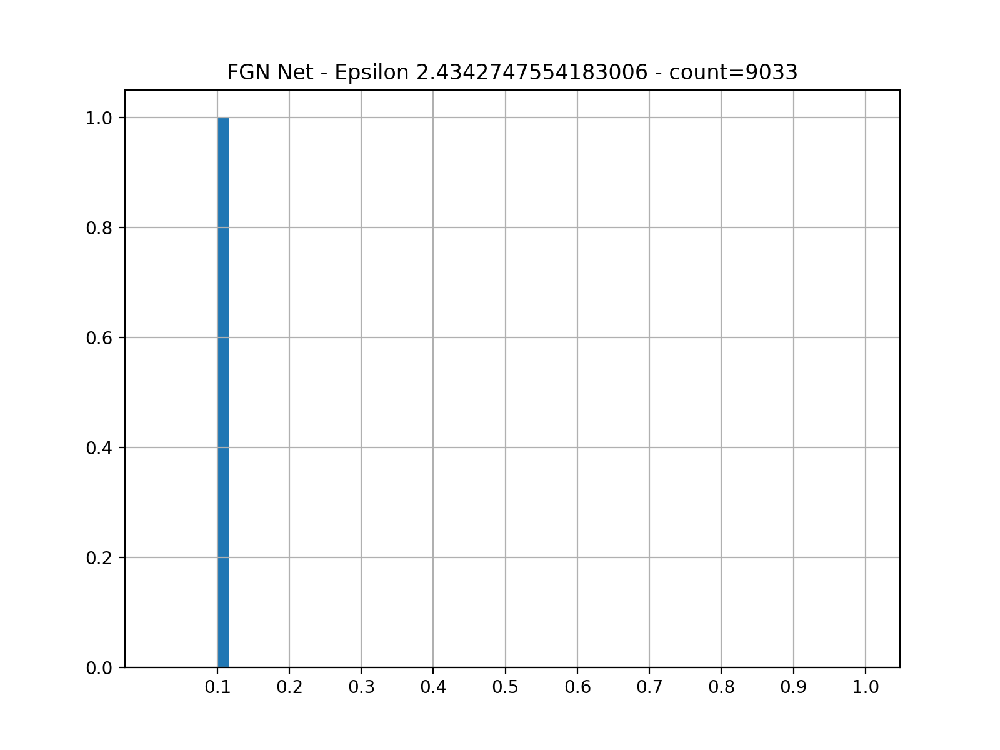

Statistical description of the predictions maximums
DescribeResult(nobs=9033, minmax=(0.1, 0.100000000000000012246), mean=0.10000000000000000002, variance=4.6095430241900930893e-38, skewness=47.50422160853813305, kurtosis=2498.5237007219418601)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 7563 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3459 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7715 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2709 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1405 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


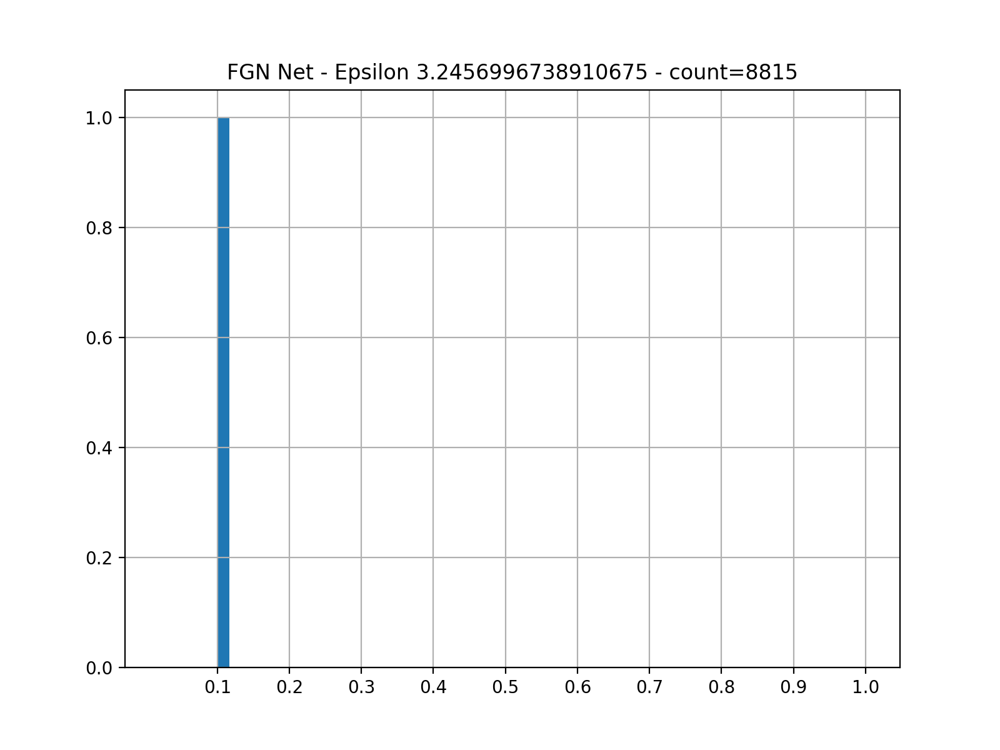

Statistical description of the predictions maximums
DescribeResult(nobs=8815, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369183086741378032e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 3696 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3992 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8101 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1593 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6502 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


In [46]:
# rerun the fgn model on adv examples
for i ,fgn_raw_images in enumerate(fgn_raw_successful):
    # turn to dataloader
    dl =  torch.utils.data.DataLoader(torch.utils.data.TensorDataset(fgn_raw_images))
    t = 'FGN Net - Epsilon {} - count={}'.format(epsilons[i], len(dl))
    fgnh.plot_pred_histogram(fgn_model, dl, title=t, verbose=True)

<IPython.core.display.Javascript object>


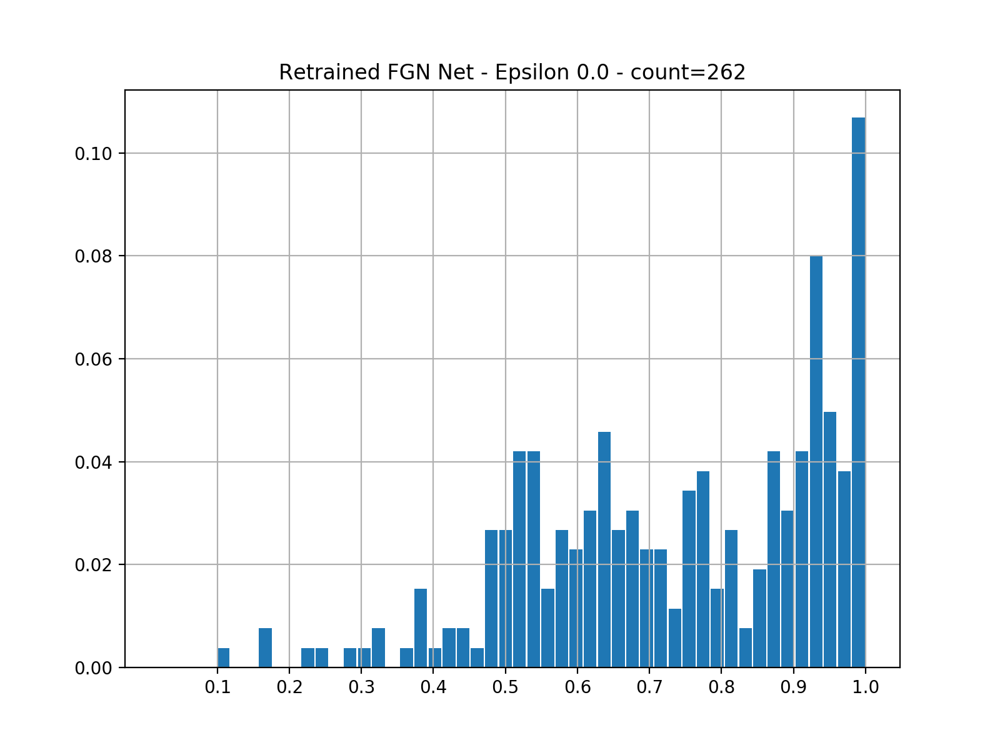

Statistical description of the predictions maximums
DescribeResult(nobs=262, minmax=(0.11027715390143807974, 0.99963236638708973013), mean=0.7394261306883370001, variance=0.04097739501358419147, skewness=-0.53741745302584494623, kurtosis=-0.46278845414761519083)

percentage of confident predictions (>=0.5): 0.8854961832061069

Sample predictions
index 168 prediction [0.   0.   0.   0.93 0.   0.06 0.   0.   0.   0.  ]
index 28 prediction [0.54 0.   0.   0.   0.   0.02 0.37 0.   0.07 0.  ]
index 128 prediction [0.   0.01 0.   0.64 0.   0.34 0.   0.   0.   0.  ]
index 253 prediction [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
index 89 prediction [0.   0.   0.   0.   0.   0.01 0.   0.   0.98 0.  ]


<IPython.core.display.Javascript object>


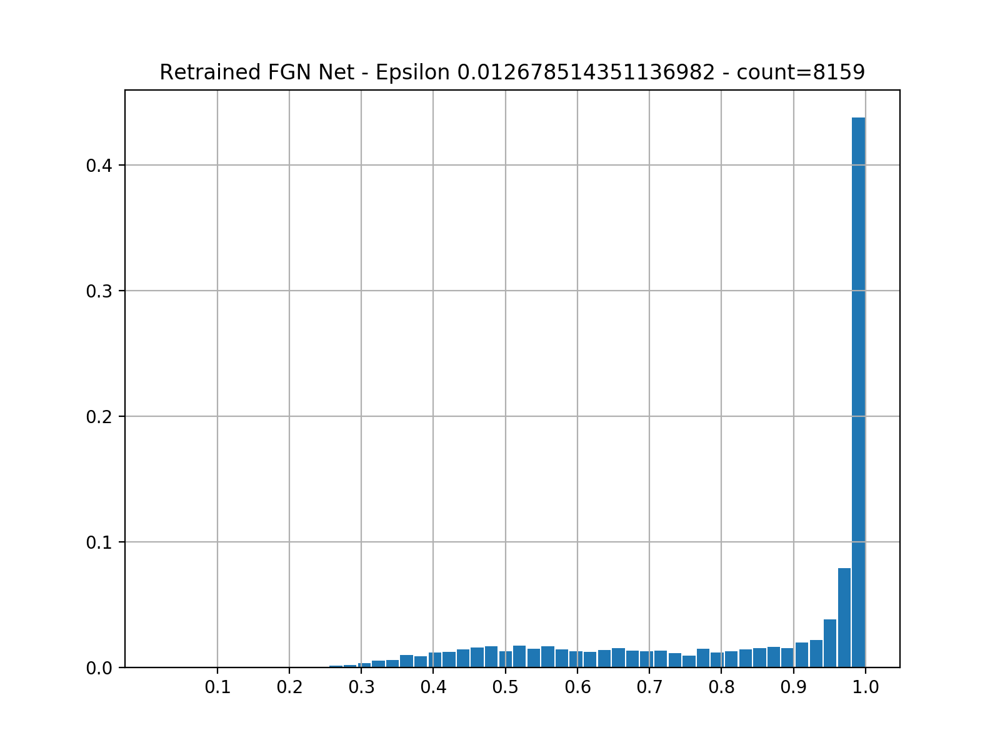

Statistical description of the predictions maximums
DescribeResult(nobs=8159, minmax=(0.105310330790990906125, 0.9990943630588211589), mean=0.83508280388193885103, variance=0.04398466537778675365, skewness=-1.0543251789711317539, kurtosis=-0.31896387722854466)

percentage of confident predictions (>=0.5): 0.8822159578379704

Sample predictions
index 2595 prediction [0.   0.11 0.04 0.04 0.   0.11 0.   0.67 0.   0.03]
index 1386 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 2206 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.01]
index 3284 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7669 prediction [0.   0.03 0.07 0.13 0.   0.   0.   0.03 0.73 0.  ]


<IPython.core.display.Javascript object>


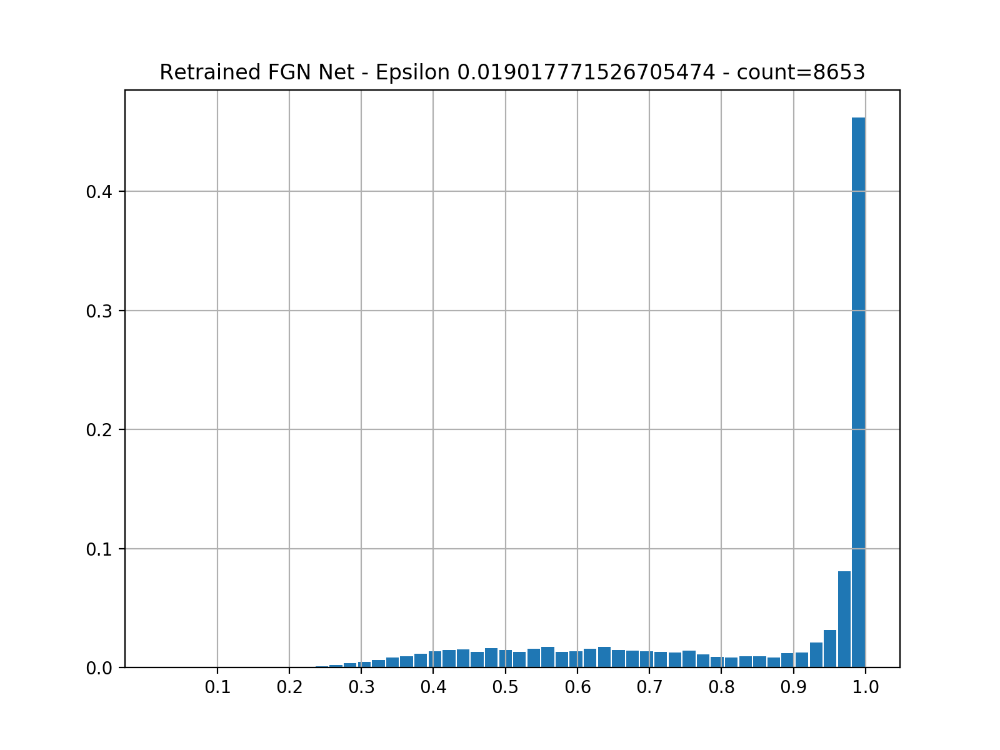

Statistical description of the predictions maximums
DescribeResult(nobs=8653, minmax=(0.105097360934899492484, 0.9988879673665124529), mean=0.82988166222001832244, variance=0.047186323932970793118, skewness=-1.0134102510739960941, kurtosis=-0.44709834640227920453)

percentage of confident predictions (>=0.5): 0.871836357332717

Sample predictions
index 1101 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 1728 prediction [0.   0.01 0.   0.01 0.   0.01 0.   0.   0.96 0.  ]
index 3049 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 7211 prediction [0.   0.03 0.   0.   0.   0.   0.   0.   0.97 0.  ]
index 3970 prediction [0.   0.   0.   0.04 0.   0.   0.   0.   0.95 0.  ]


<IPython.core.display.Javascript object>


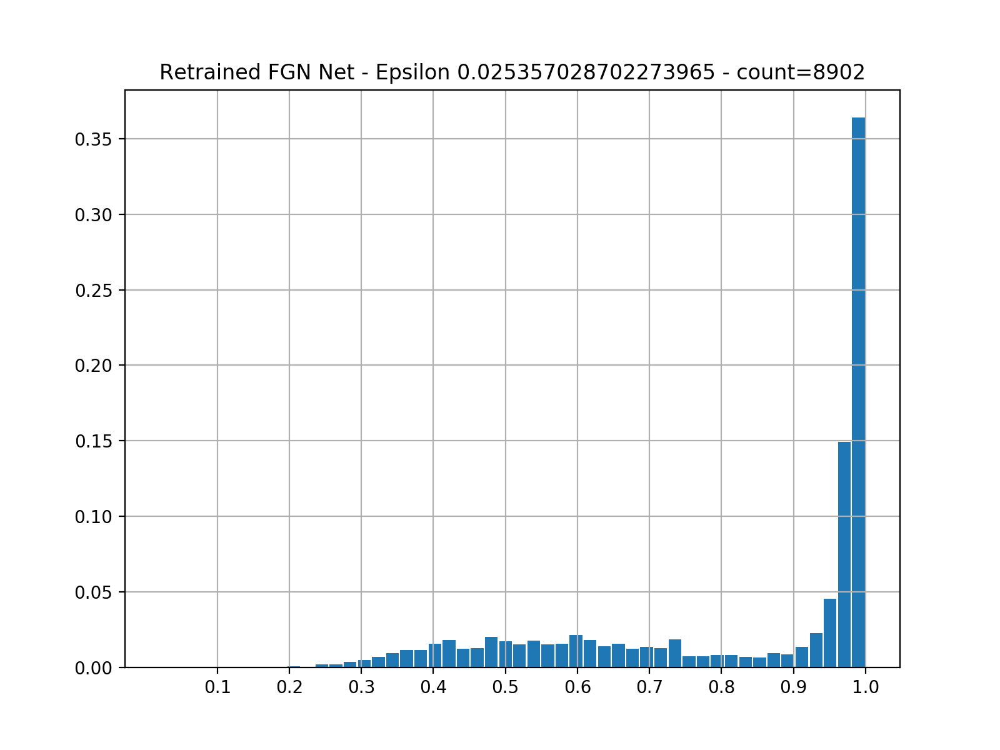

Statistical description of the predictions maximums
DescribeResult(nobs=8902, minmax=(0.104849793275443446165, 0.9970205415494739719), mean=0.8154910367739889968, variance=0.049290504605939480967, skewness=-0.91504175121185394665, kurtosis=-0.665696335364932542)

percentage of confident predictions (>=0.5): 0.8580094360817794

Sample predictions
index 3605 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 6021 prediction [0.   0.02 0.11 0.04 0.   0.82 0.   0.01 0.   0.  ]
index 3615 prediction [0.   0.   0.   0.   0.   0.01 0.   0.   0.98 0.01]
index 7187 prediction [0.   0.11 0.09 0.14 0.   0.13 0.   0.52 0.   0.01]
index 6220 prediction [0.   0.14 0.12 0.13 0.   0.11 0.   0.48 0.   0.  ]


<IPython.core.display.Javascript object>


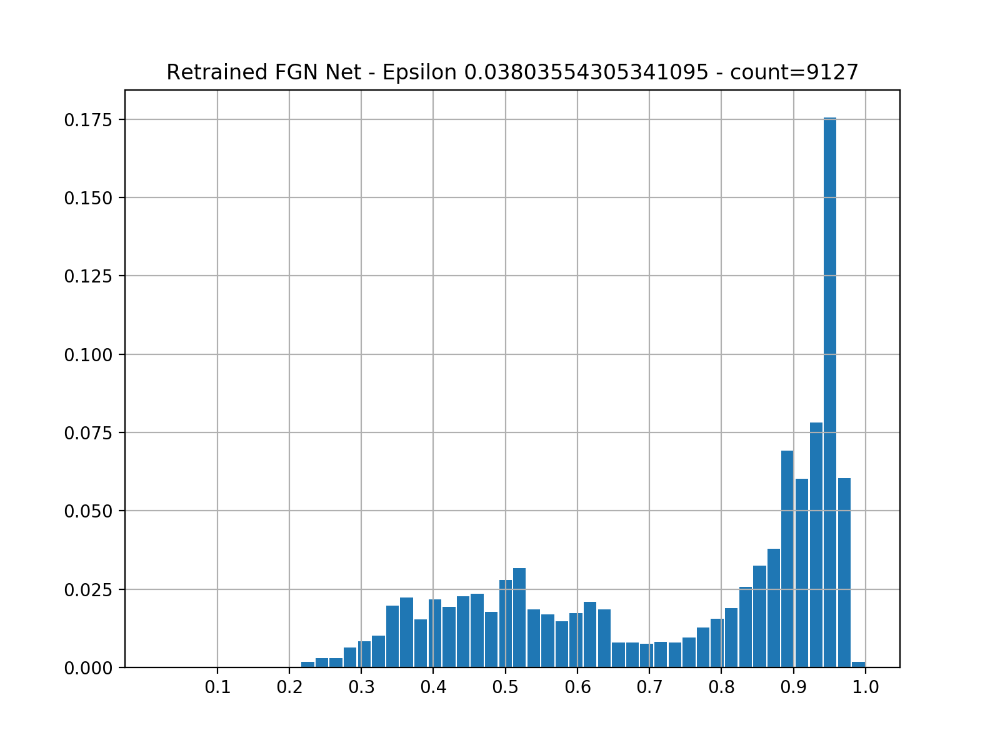

Statistical description of the predictions maximums
DescribeResult(nobs=9127, minmax=(0.10427465125300373999, 0.9899782848191341372), mean=0.74148854560214410626, variance=0.049189840269128787634, skewness=-0.62206073646530963926, kurtosis=-1.1386454322829872925)

percentage of confident predictions (>=0.5): 0.792593404185384

Sample predictions
index 1668 prediction [0.09 0.   0.01 0.02 0.01 0.03 0.01 0.01 0.81 0.01]
index 7356 prediction [0.   0.   0.   0.02 0.   0.01 0.   0.   0.95 0.01]
index 3056 prediction [0.   0.1  0.16 0.12 0.01 0.14 0.   0.46 0.   0.01]
index 5733 prediction [0.   0.   0.   0.02 0.   0.01 0.   0.   0.95 0.01]
index 1304 prediction [0.   0.04 0.07 0.11 0.01 0.21 0.   0.55 0.   0.01]


<IPython.core.display.Javascript object>


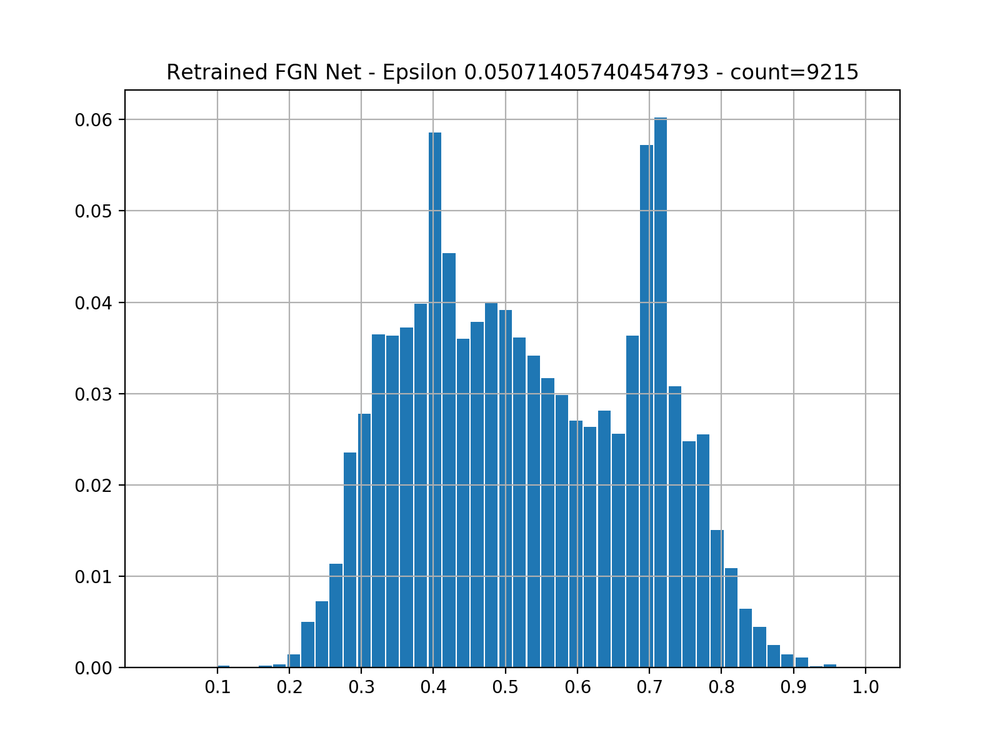

Statistical description of the predictions maximums
DescribeResult(nobs=9215, minmax=(0.10363768882269664615, 0.95098209711961355736), mean=0.53204455365995051495, variance=0.025121194431447779888, skewness=0.099519181581275086356, kurtosis=-1.0840307858446168121)

percentage of confident predictions (>=0.5): 0.5333695062398264

Sample predictions
index 2753 prediction [0.   0.1  0.08 0.22 0.01 0.23 0.01 0.34 0.   0.01]
index 2857 prediction [0.   0.14 0.09 0.15 0.   0.13 0.   0.46 0.   0.02]
index 1374 prediction [0.01 0.34 0.33 0.17 0.02 0.01 0.06 0.01 0.04 0.01]
index 6892 prediction [0.01 0.03 0.06 0.14 0.01 0.05 0.   0.04 0.61 0.05]
index 1739 prediction [0.03 0.02 0.1  0.27 0.01 0.1  0.01 0.03 0.38 0.05]


<IPython.core.display.Javascript object>


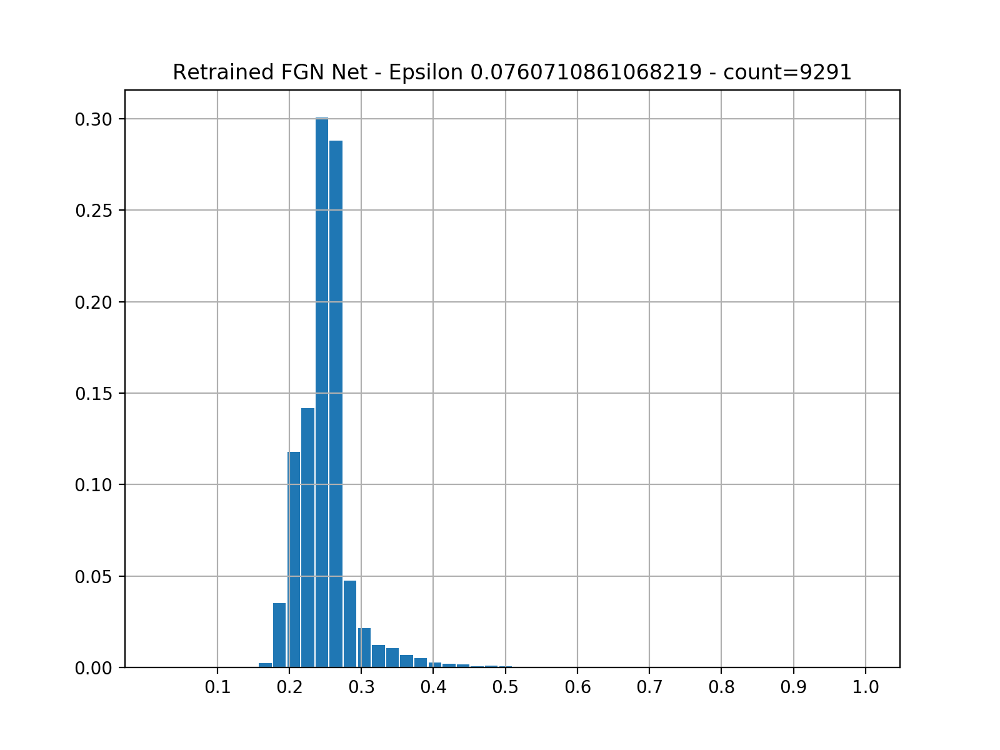

Statistical description of the predictions maximums
DescribeResult(nobs=9291, minmax=(0.10250792548576015341, 0.72442516187380436607), mean=0.2498577176854663795, variance=0.0014650398934215671442, skewness=2.6854144985898257588, kurtosis=18.212698342358238902)

percentage of confident predictions (>=0.5): 0.0018297276934667959

Sample predictions
index 8741 prediction [0.02 0.09 0.16 0.22 0.03 0.13 0.02 0.16 0.1  0.07]
index 4254 prediction [0.01 0.07 0.13 0.26 0.02 0.17 0.02 0.1  0.14 0.07]
index 503 prediction [0.01 0.16 0.12 0.16 0.02 0.17 0.04 0.26 0.02 0.04]
index 5497 prediction [0.01 0.16 0.15 0.2  0.03 0.18 0.04 0.17 0.03 0.04]
index 722 prediction [0.01 0.07 0.13 0.26 0.02 0.17 0.02 0.1  0.14 0.07]


<IPython.core.display.Javascript object>


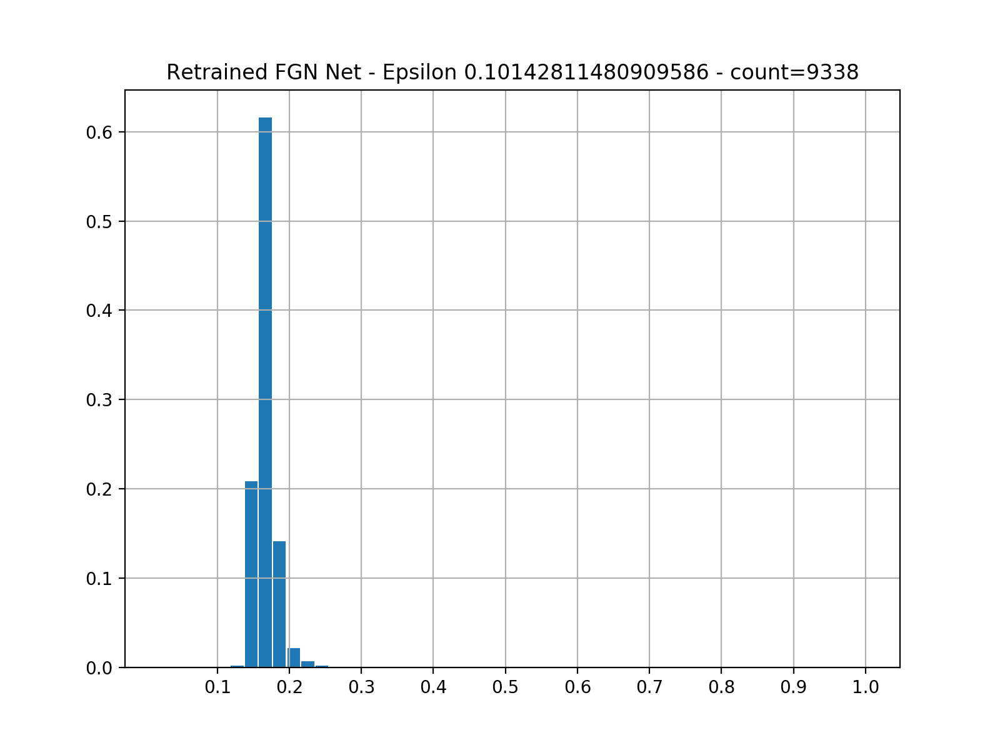

Statistical description of the predictions maximums
DescribeResult(nobs=9338, minmax=(0.10154618442521937257, 0.35032568486556437117), mean=0.1670388723632450934, variance=0.00019629516305949465182, skewness=2.180187713514627713, kurtosis=13.415922458998691638)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 7579 prediction [0.04 0.11 0.12 0.15 0.08 0.14 0.08 0.1  0.1  0.08]
index 949 prediction [0.03 0.09 0.12 0.15 0.09 0.17 0.08 0.11 0.08 0.07]
index 2447 prediction [0.03 0.1  0.13 0.17 0.07 0.17 0.06 0.11 0.09 0.07]
index 4527 prediction [0.03 0.11 0.13 0.17 0.06 0.16 0.06 0.11 0.09 0.07]
index 8919 prediction [0.02 0.13 0.14 0.17 0.06 0.17 0.08 0.12 0.06 0.06]


<IPython.core.display.Javascript object>


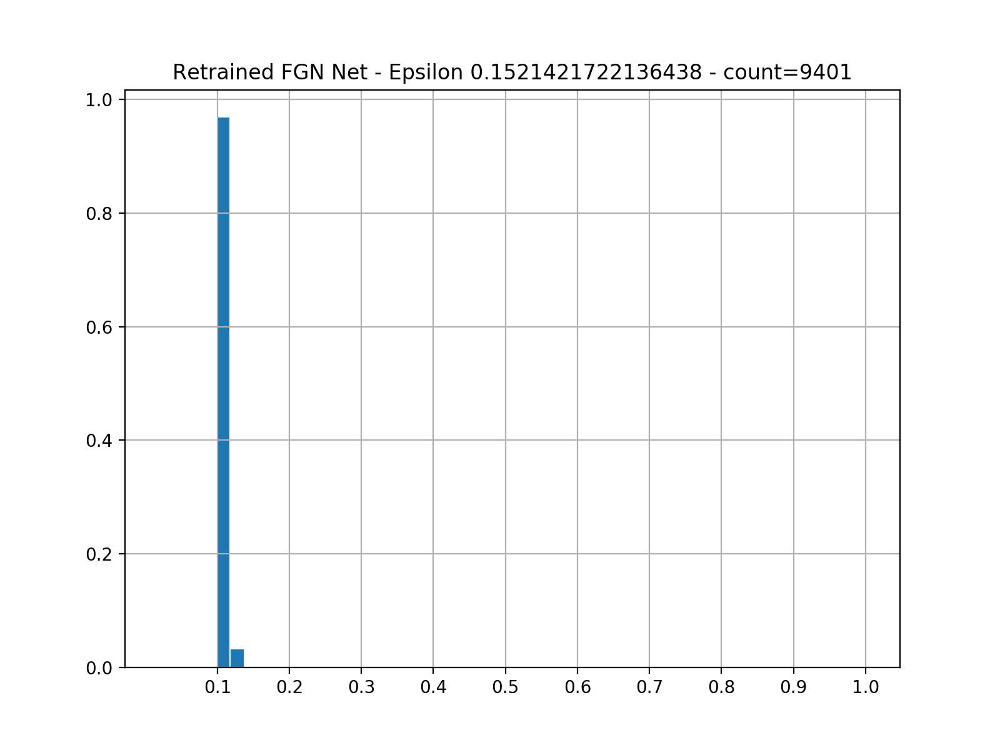

Statistical description of the predictions maximums
DescribeResult(nobs=9401, minmax=(0.10037265745401699569, 0.13368991694318876635), mean=0.11066894639853375214, variance=8.94915593180038887e-06, skewness=1.7473680777407244666, kurtosis=5.9776765277864017537)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 9314 prediction [0.09 0.1  0.1  0.11 0.1  0.11 0.1  0.09 0.1  0.09]
index 4333 prediction [0.08 0.1  0.11 0.11 0.1  0.11 0.11 0.09 0.11 0.09]
index 4188 prediction [0.08 0.1  0.11 0.11 0.1  0.11 0.11 0.09 0.11 0.09]
index 1839 prediction [0.07 0.11 0.11 0.11 0.1  0.11 0.1  0.09 0.11 0.09]
index 2301 prediction [0.08 0.1  0.11 0.11 0.1  0.11 0.11 0.09 0.11 0.09]


<IPython.core.display.Javascript object>


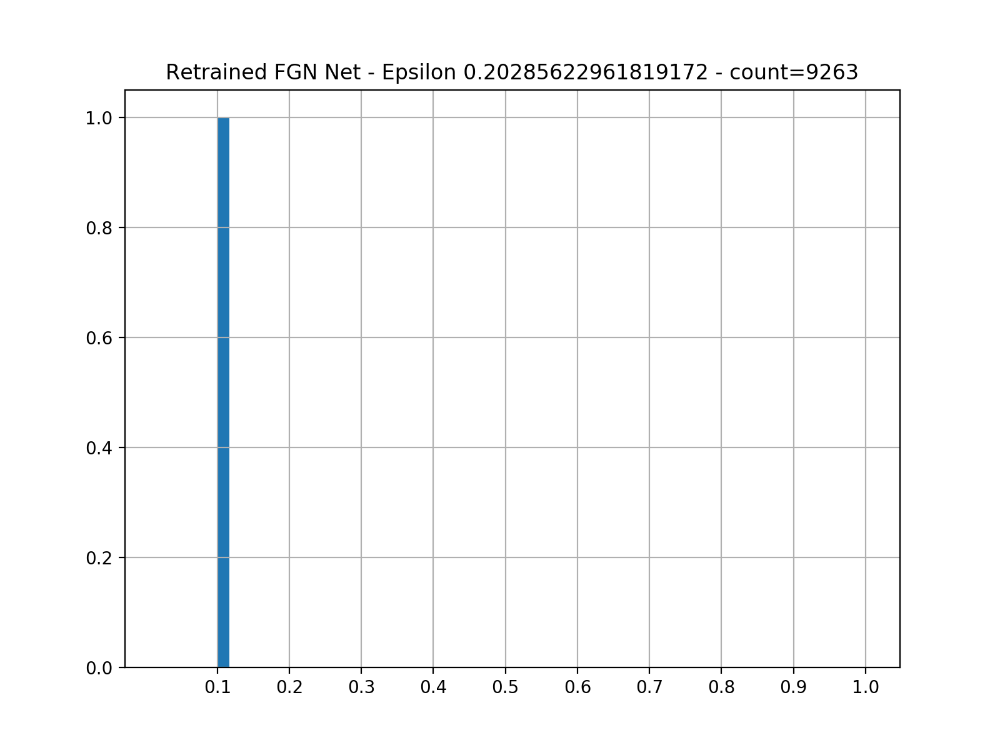

Statistical description of the predictions maximums
DescribeResult(nobs=9263, minmax=(0.10005036849403250291, 0.10695910942363115177), mean=0.10160738496136852327, variance=4.1551222162952852423e-07, skewness=2.1283728434111459712, kurtosis=8.600390249314388032)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 8830 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6180 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6625 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7144 prediction [0.09 0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1 ]
index 4030 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


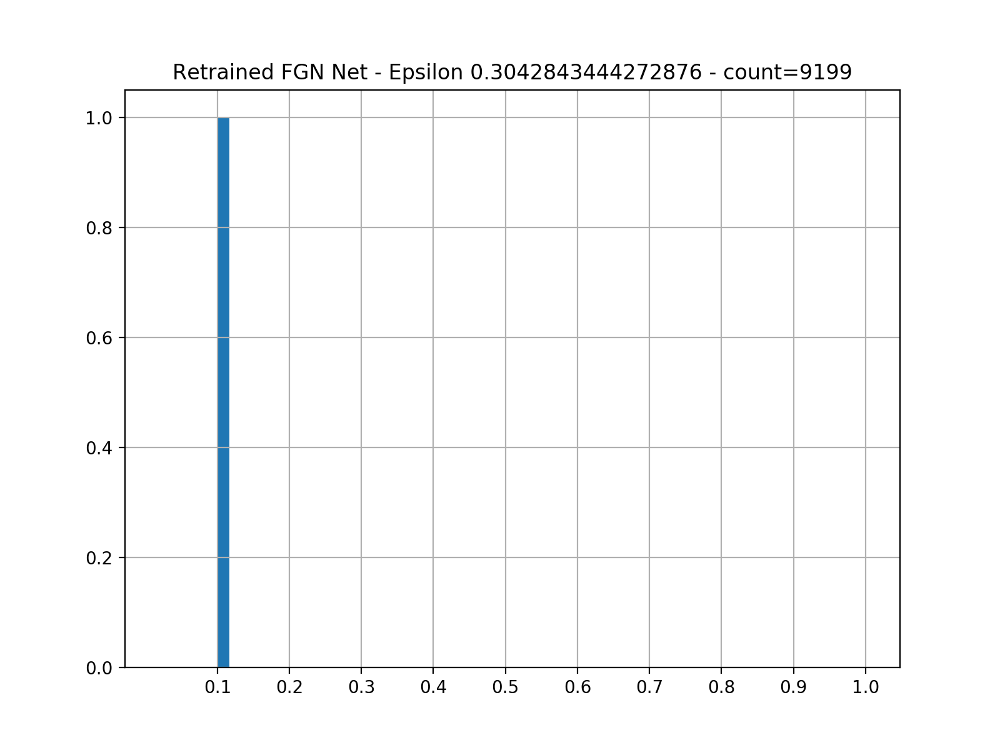

Statistical description of the predictions maximums
DescribeResult(nobs=9199, minmax=(0.10000008425931860278, 0.1002263988842420679), mean=0.10001080332952972406, variance=2.2177473269799997875e-10, skewness=5.75264837597547734, kurtosis=48.882546999328749106)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 900 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 9197 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4832 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7473 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7343 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


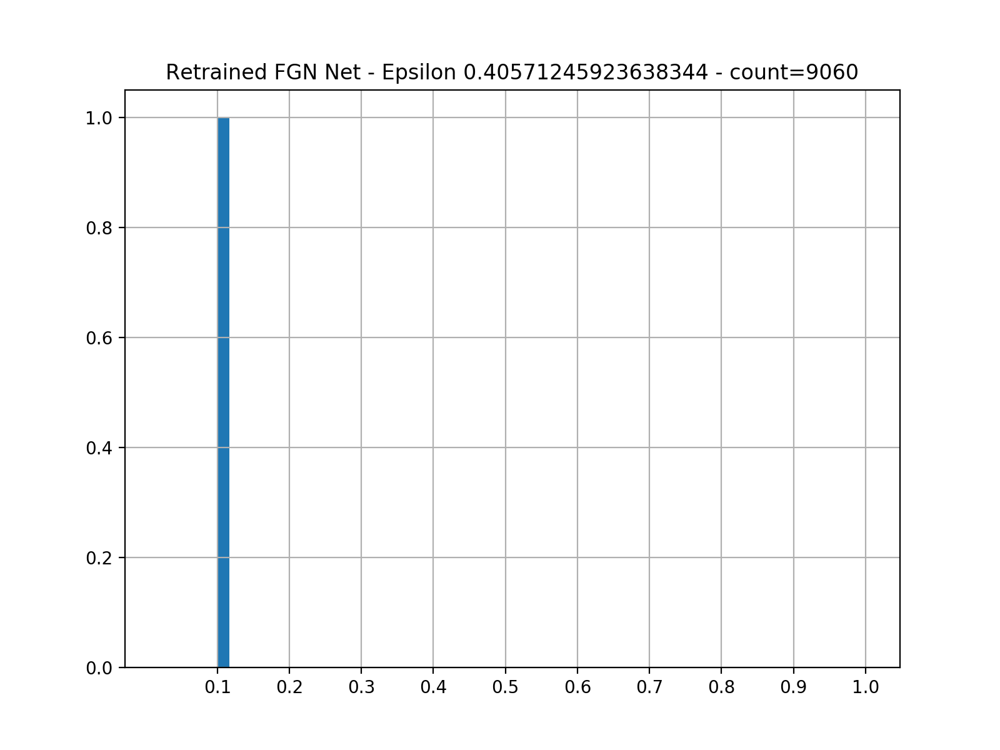

Statistical description of the predictions maximums
DescribeResult(nobs=9060, minmax=(0.10000000000132477746, 0.10000168476713321157), mean=0.100000015574672747716, variance=4.486409989800987209e-15, skewness=12.944445786453710106, kurtosis=224.31472551694650866)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 7958 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6636 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1100 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5935 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 337 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


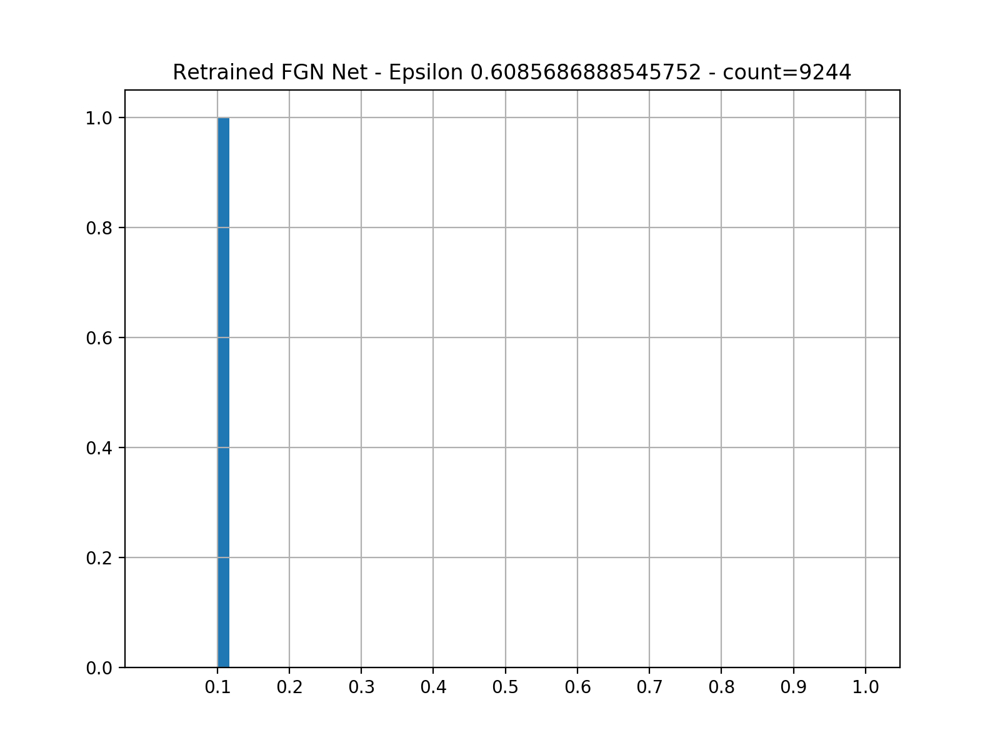

Statistical description of the predictions maximums
DescribeResult(nobs=9244, minmax=(0.1, 0.10000000000135977565), mean=0.10000000000000178597, variance=9.514569170542698035e-28, skewness=31.34654310945573971, kurtosis=1156.0129289763024988)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5200 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 193 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 959 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5680 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6497 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


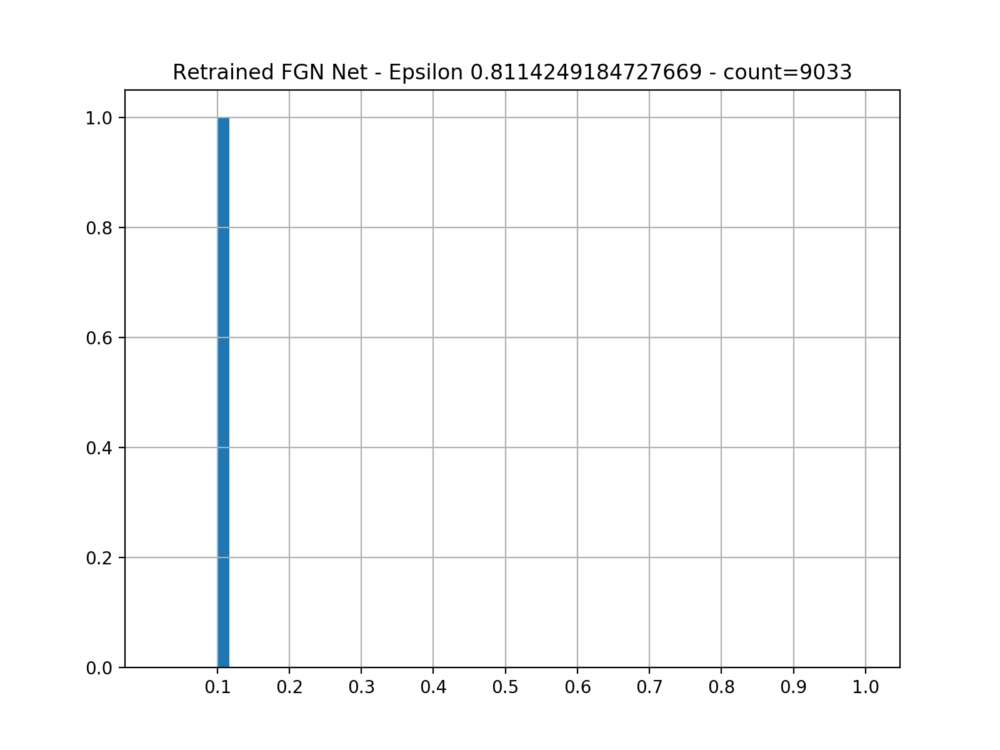

Statistical description of the predictions maximums
DescribeResult(nobs=9033, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.836913278997197994e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 8520 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8148 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 556 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3363 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7834 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


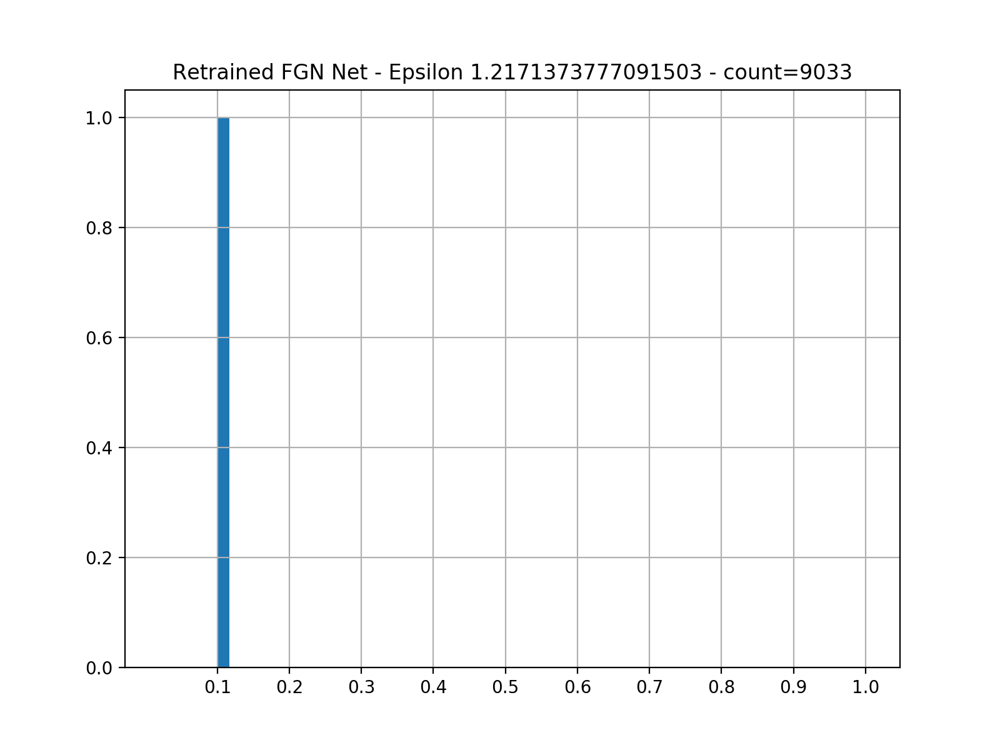

Statistical description of the predictions maximums
DescribeResult(nobs=9033, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.836913278997197994e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 339 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8017 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1953 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1528 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6199 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


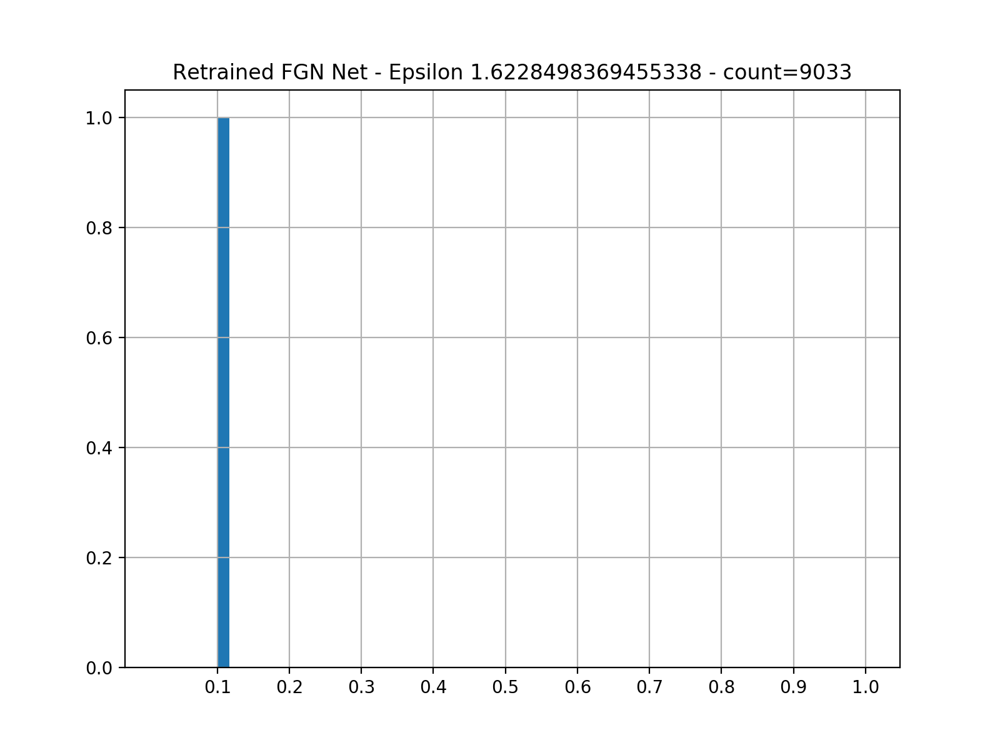

Statistical description of the predictions maximums
DescribeResult(nobs=9033, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.836913278997197994e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 7808 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3621 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4255 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6370 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1421 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


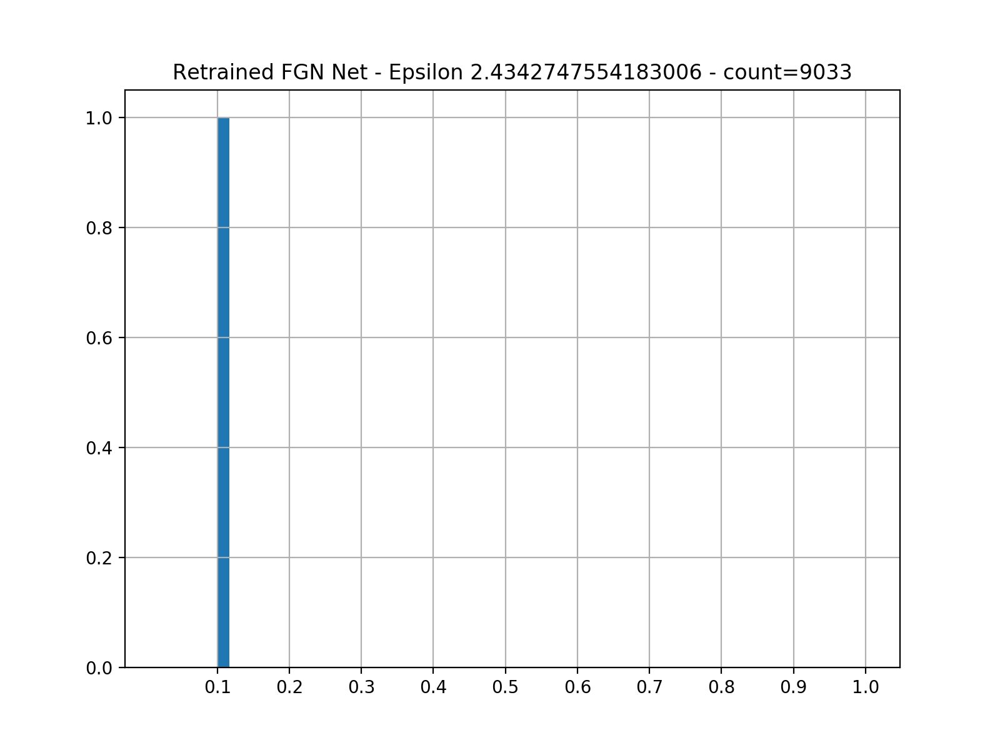

Statistical description of the predictions maximums
DescribeResult(nobs=9033, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.836913278997197994e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6526 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2240 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5212 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1166 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7311 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


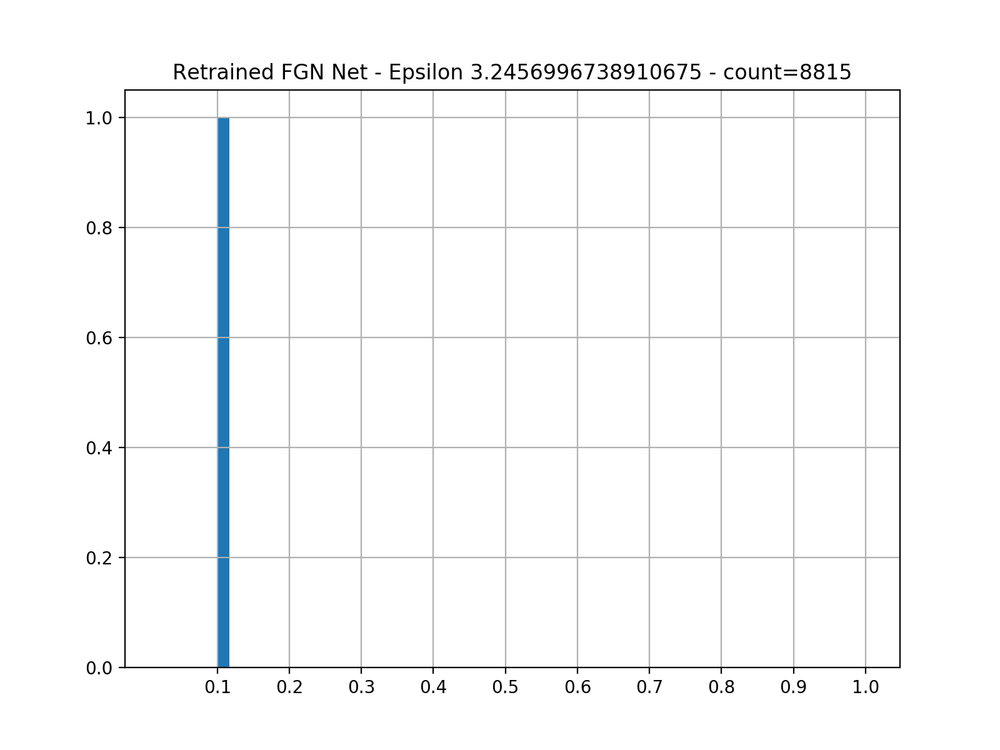

Statistical description of the predictions maximums
DescribeResult(nobs=8815, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369183086741378032e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 8156 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5052 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2317 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5921 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6272 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


In [47]:
# rerun the ret_quick_fgn model on adv examples
for i, ret_quick_fgn_raw_images in enumerate(ret_quick_fgn_raw_successful):
    # turn to dataloader
    dl =  torch.utils.data.DataLoader(torch.utils.data.TensorDataset(ret_quick_fgn_raw_images))
    t = 'Retrained FGN Net - Epsilon {} - count={}'.format(epsilons[i], len(dl))
    fgnh.plot_pred_histogram(ret_quick_fgn_model, dl, title=t, verbose=True)

<IPython.core.display.Javascript object>


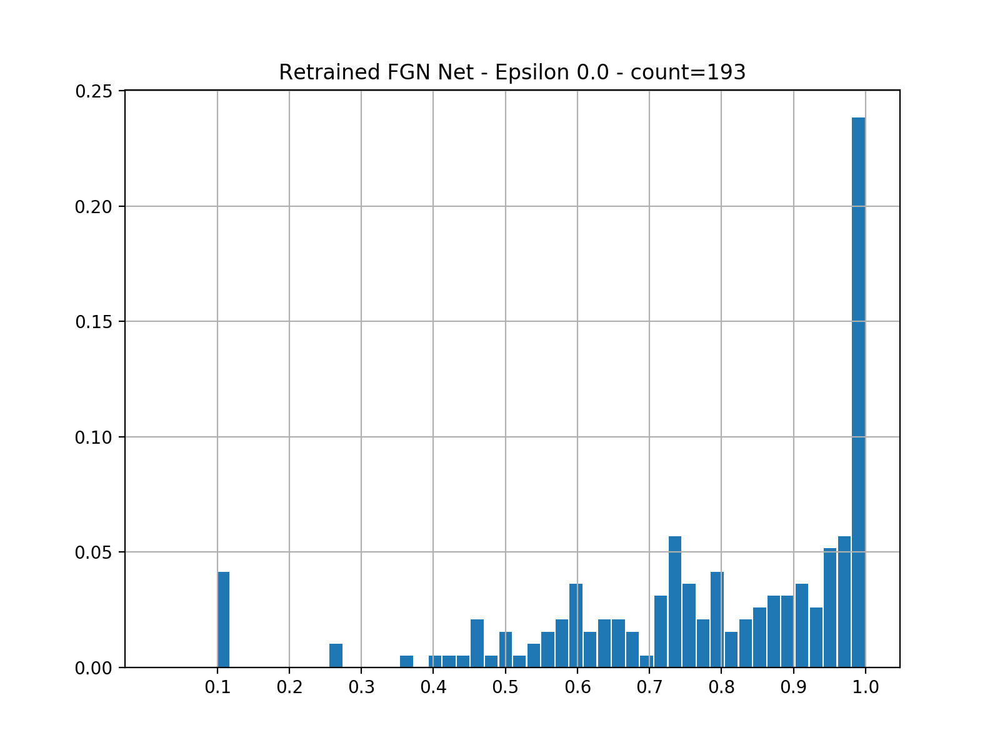

Statistical description of the predictions maximums
DescribeResult(nobs=193, minmax=(0.1, 0.9999922281903712973), mean=0.78316023392556622165, variance=0.05114104269678836231, skewness=-1.2965008351325330764, kurtosis=1.4182937138997215262)

percentage of confident predictions (>=0.5): 0.8963730569948186

Sample predictions
index 118 prediction [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
index 19 prediction [0.   0.   0.   0.   0.08 0.   0.   0.   0.   0.92]
index 50 prediction [0.   0.03 0.08 0.89 0.   0.   0.   0.   0.   0.  ]
index 104 prediction [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
index 121 prediction [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]


<IPython.core.display.Javascript object>


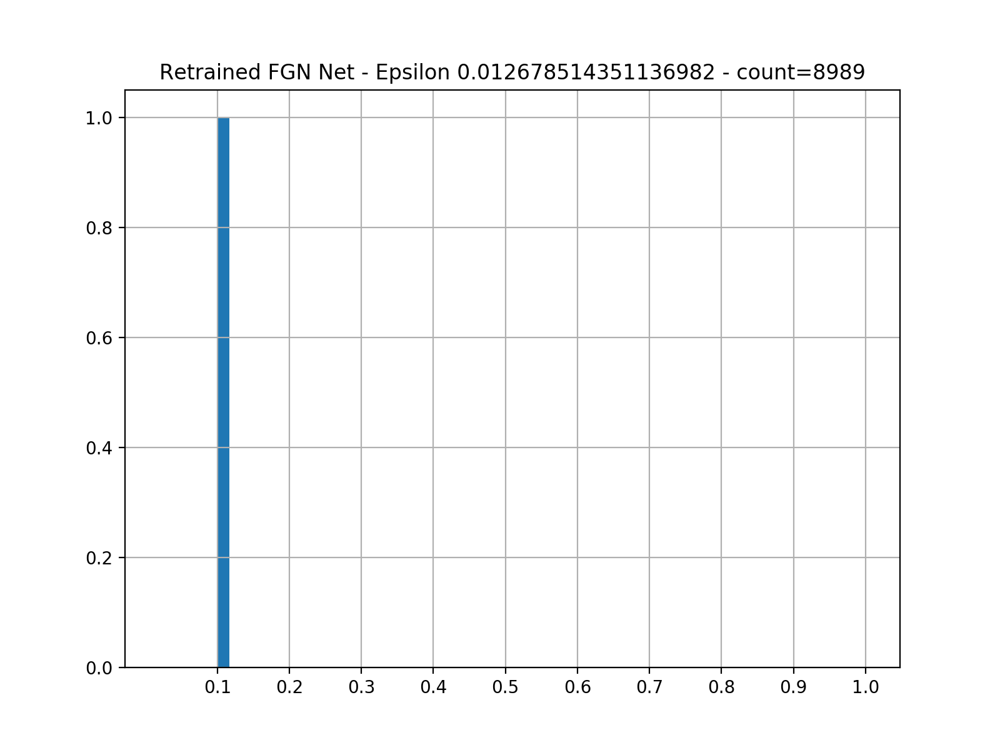

Statistical description of the predictions maximums
DescribeResult(nobs=8989, minmax=(0.1, 0.100000000000001026544), mean=0.10000000000000000032, variance=1.2808565707847574728e-34, skewness=83.879347281545050125, kurtosis=7532.277424422936797)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 4599 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4254 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1220 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6781 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4156 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


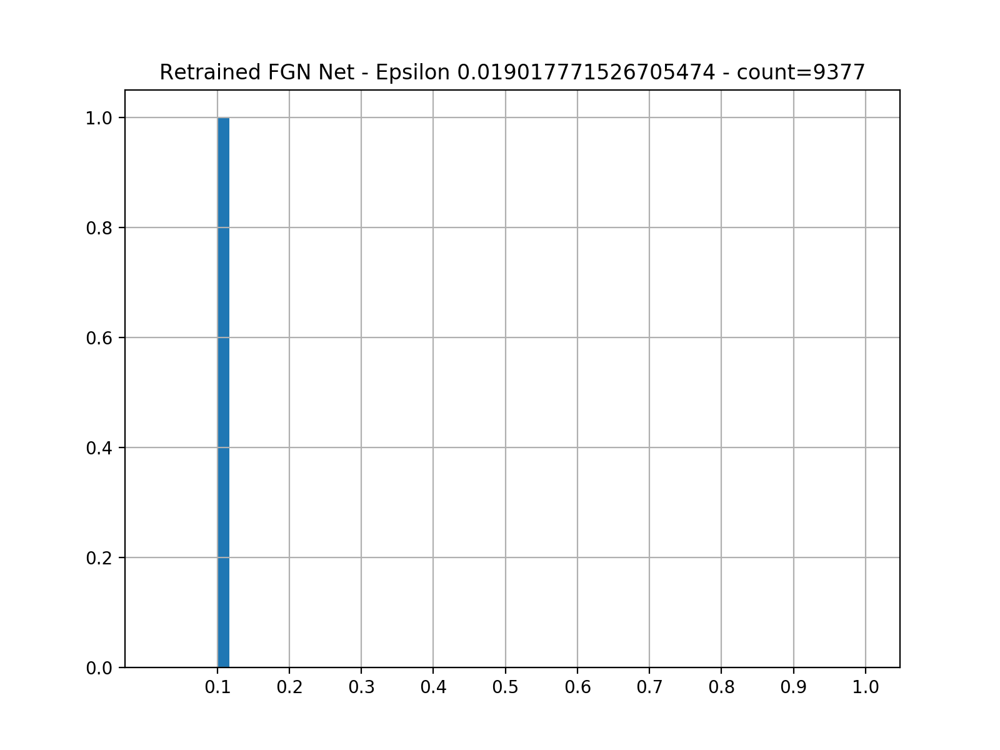

Statistical description of the predictions maximums
DescribeResult(nobs=9377, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.836905817989512779e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 4926 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 36 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5004 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6253 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7942 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


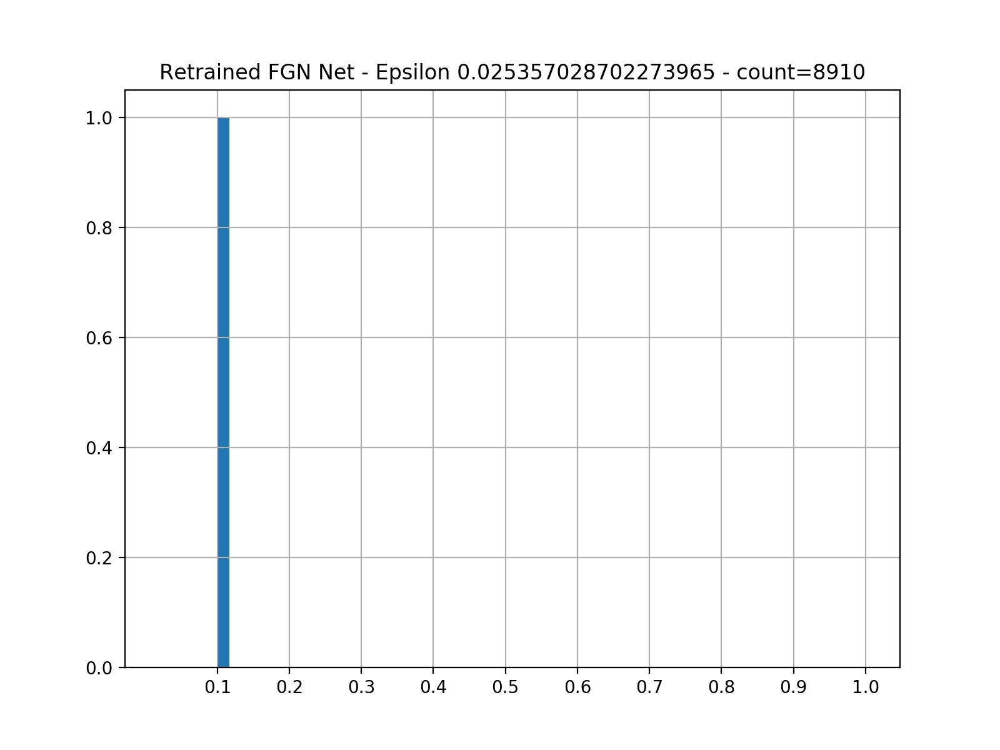

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 7877 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 47 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8323 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 437 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8774 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


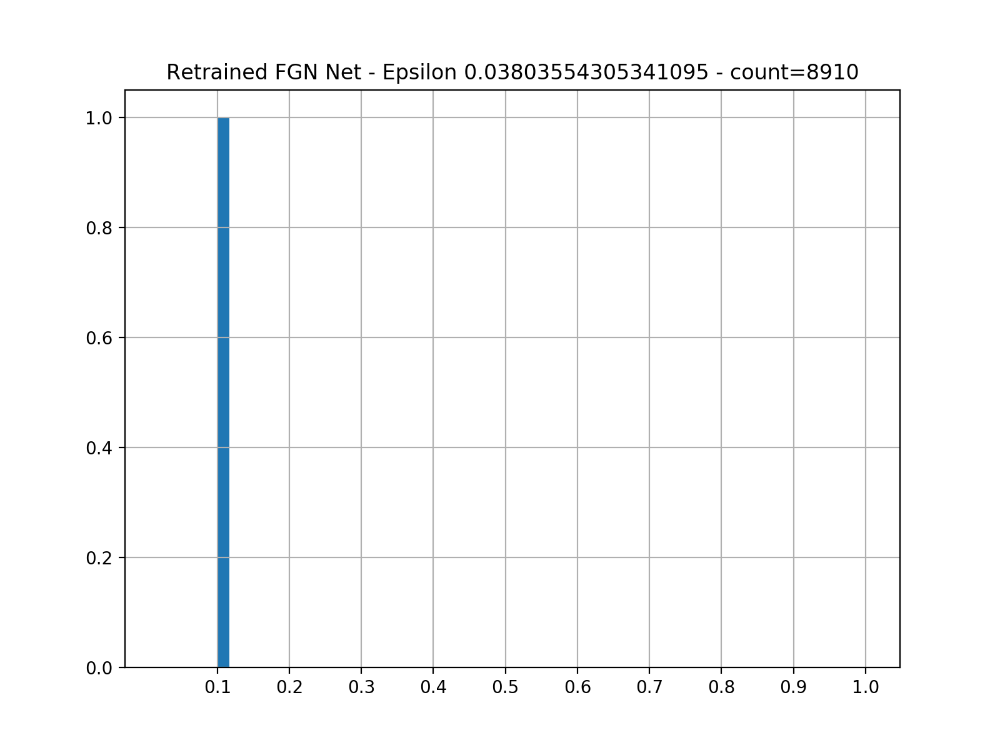

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 2483 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1069 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5670 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3729 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5311 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


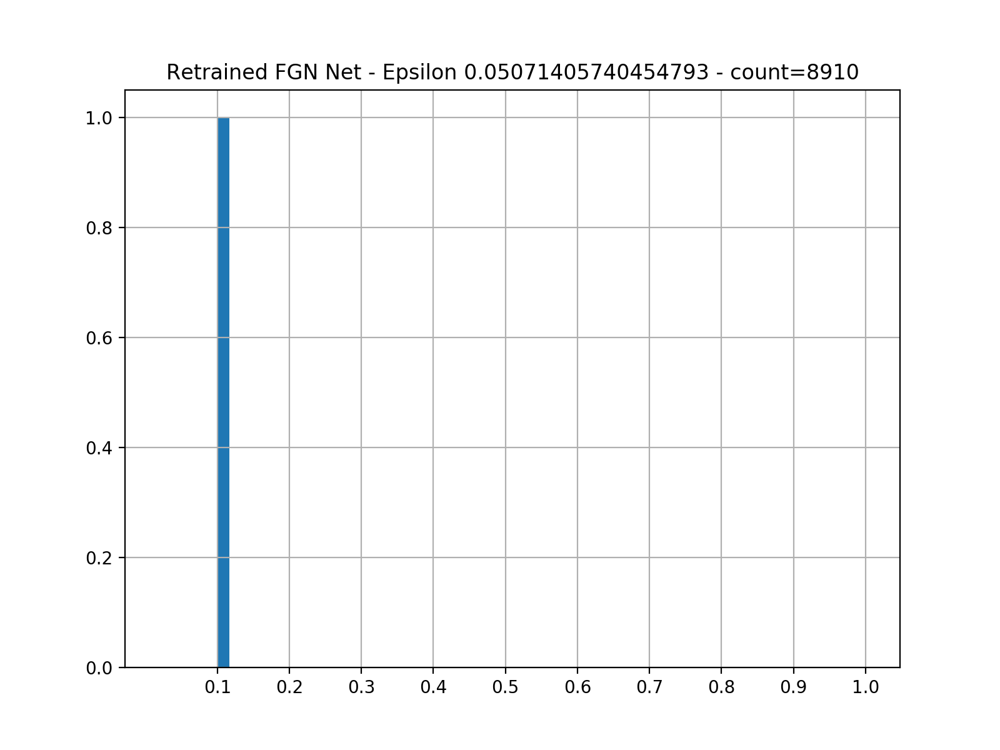

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5199 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4612 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 964 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5332 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8176 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


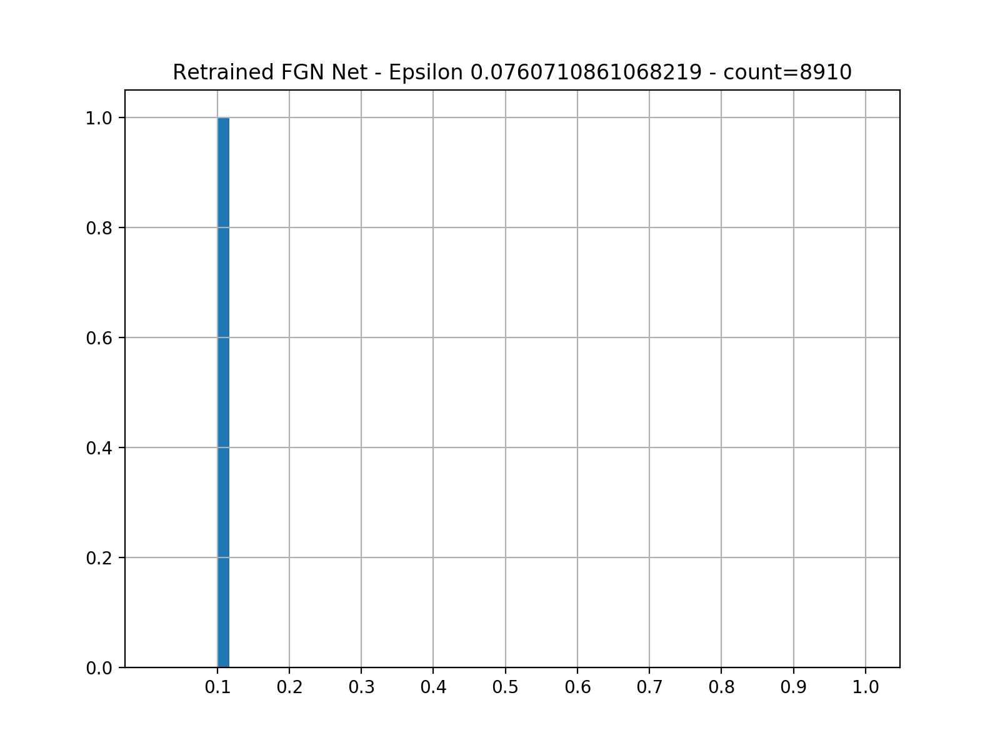

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5415 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3265 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4556 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 624 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6836 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


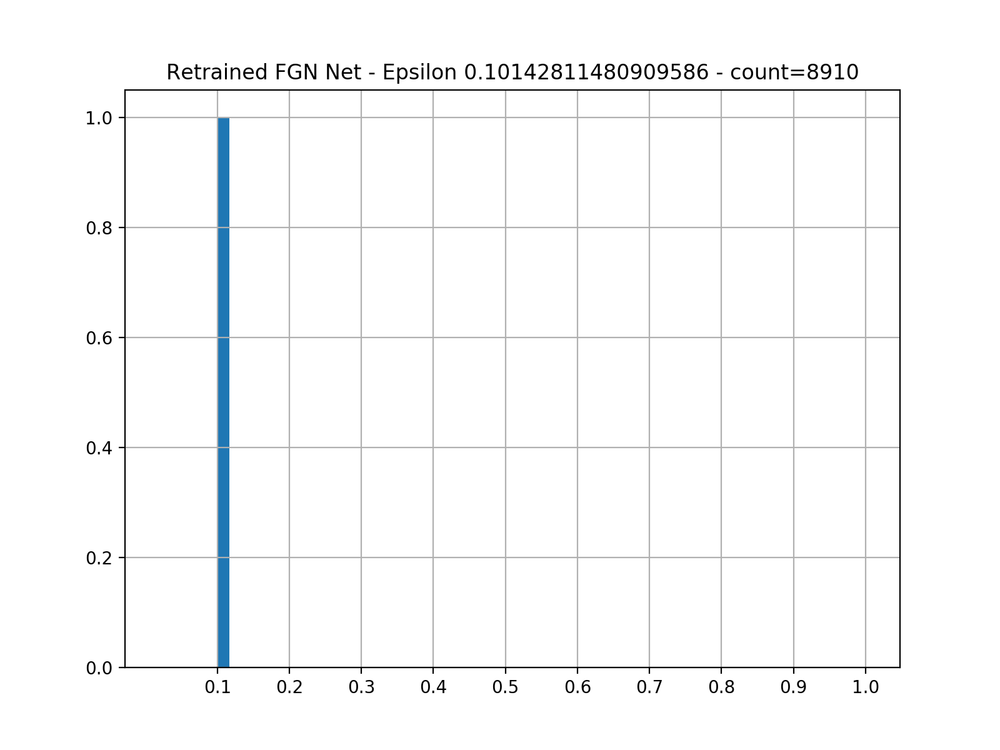

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 4120 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1096 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6011 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8446 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8741 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


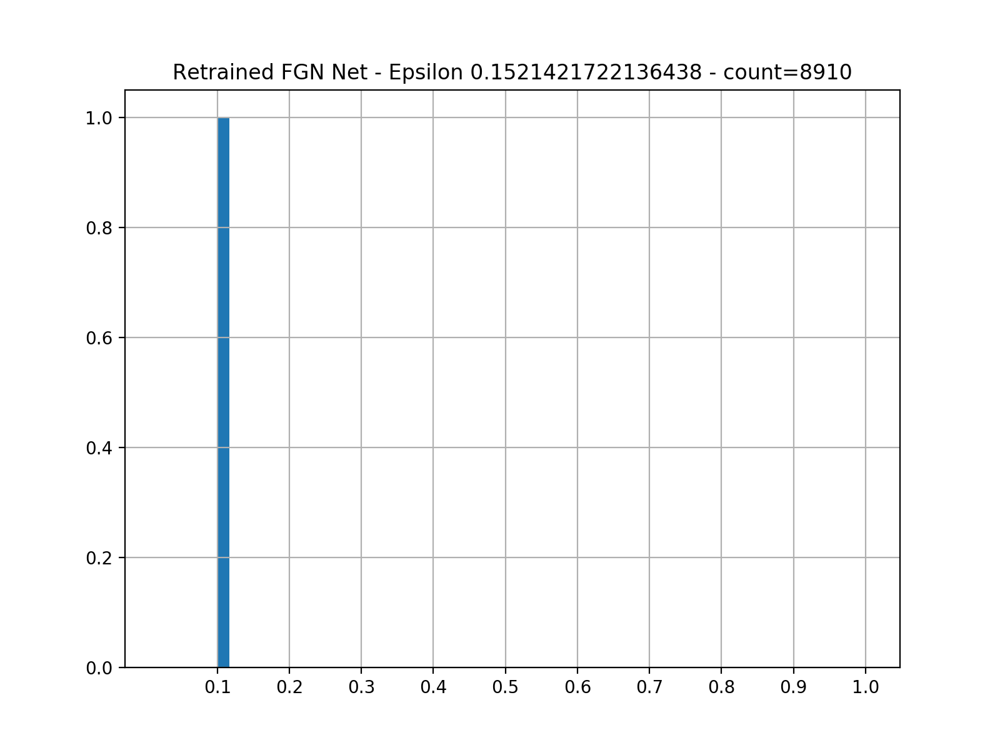

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5213 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5876 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6689 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6587 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3919 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


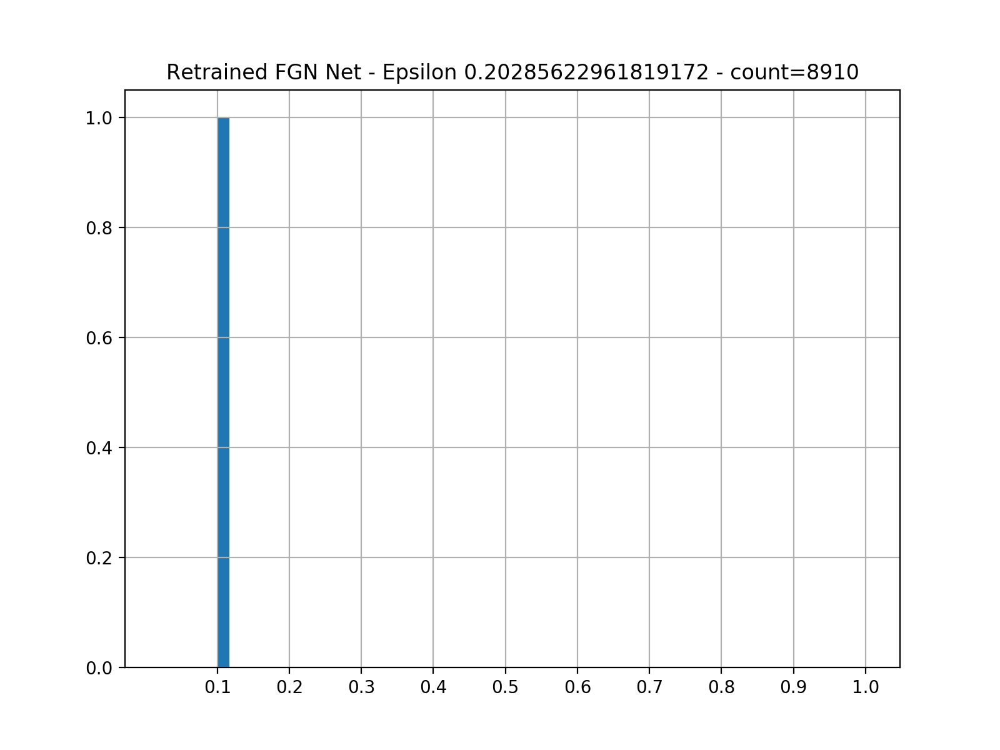

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1979 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3772 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5397 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7863 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6578 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


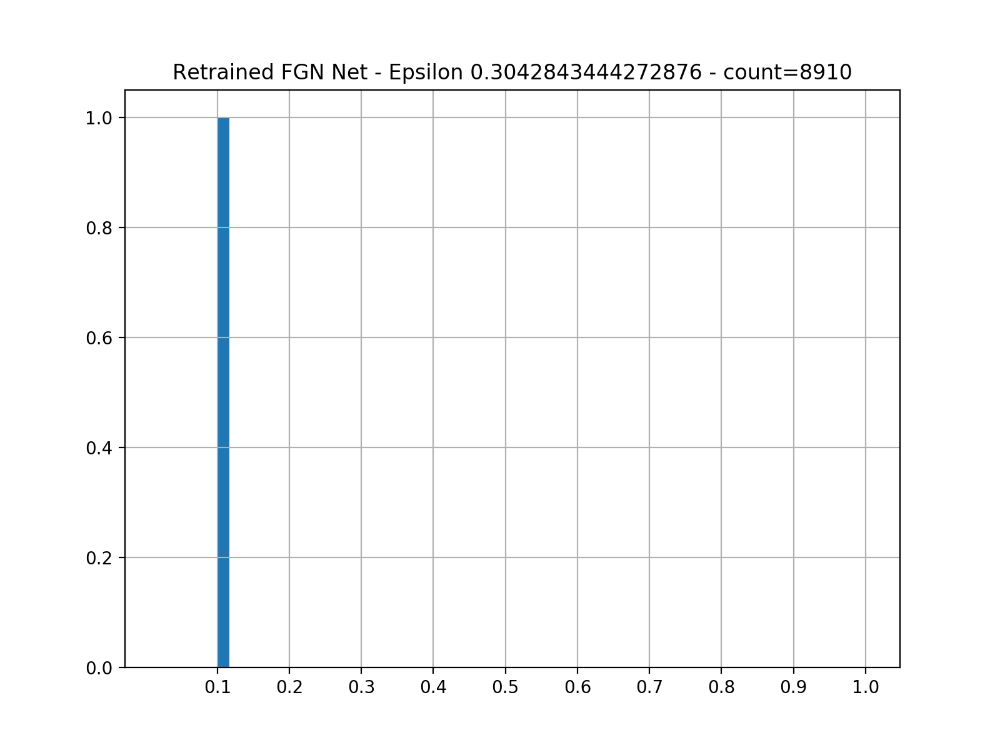

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 7633 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8886 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3045 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7132 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 640 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


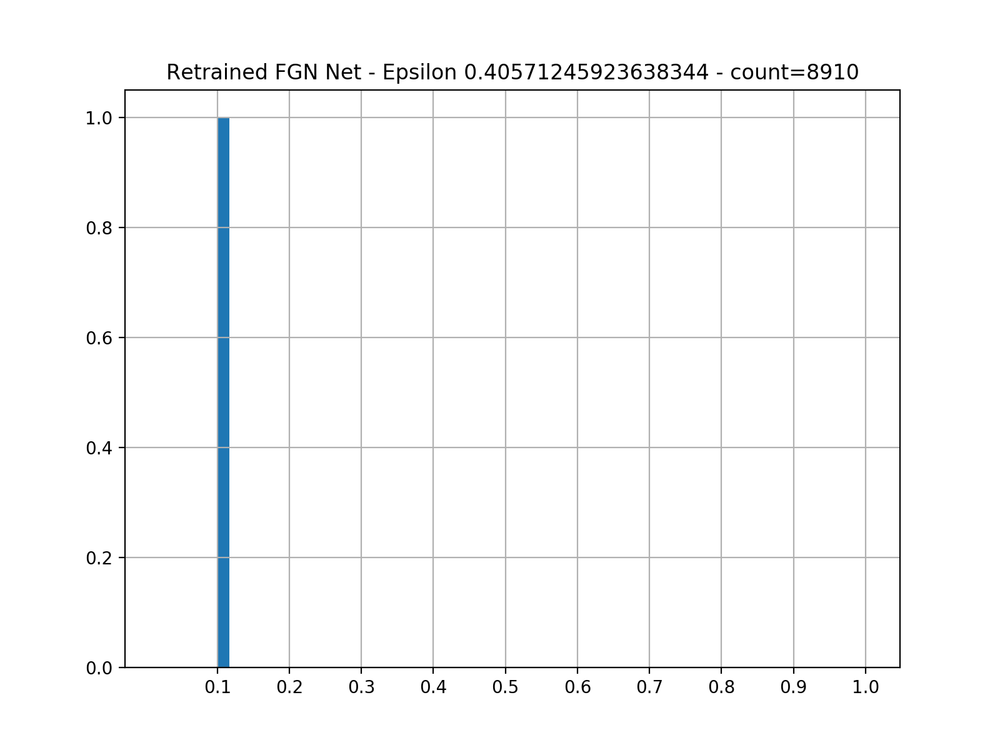

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 8694 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3079 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7929 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3825 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2142 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


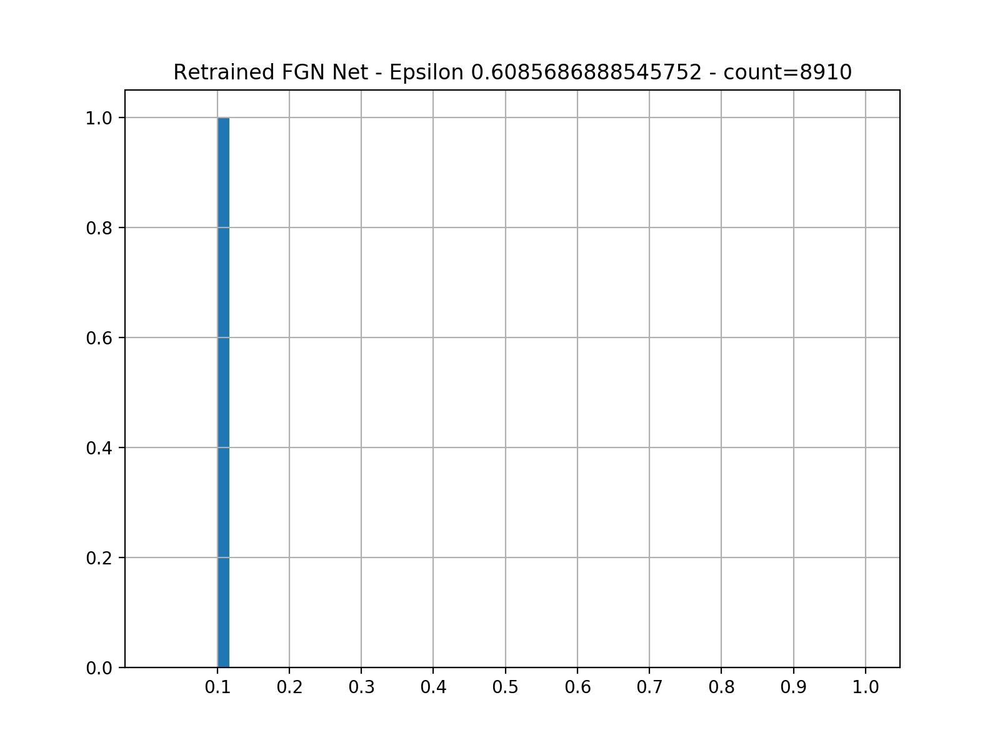

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1065 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5494 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1565 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7798 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6740 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


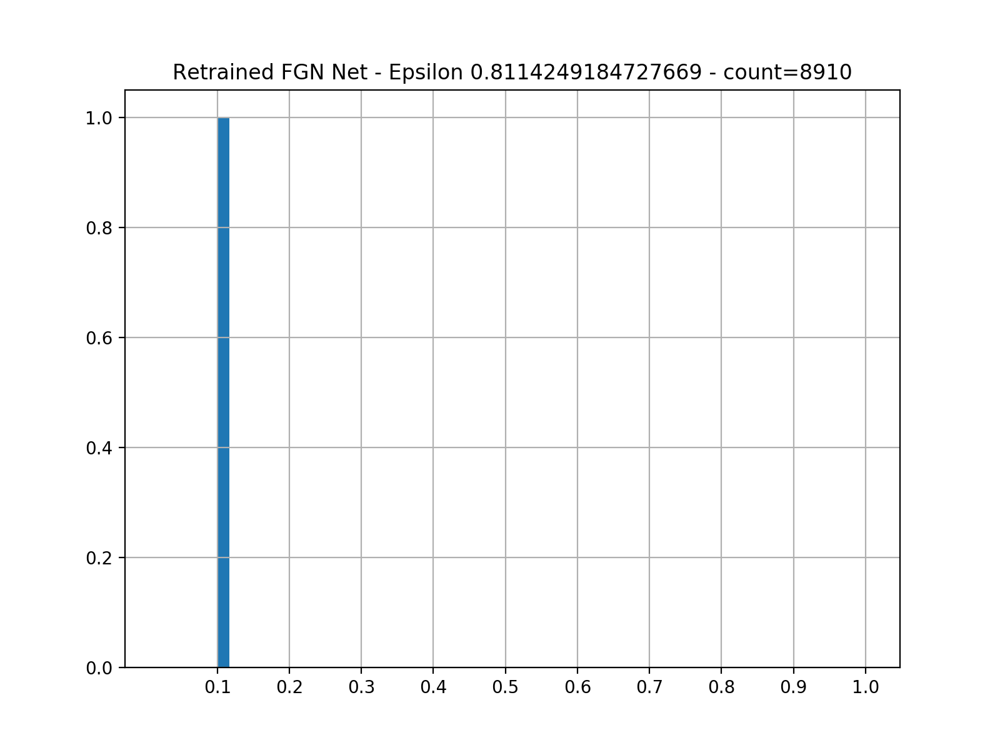

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6568 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1711 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2035 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5088 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8165 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


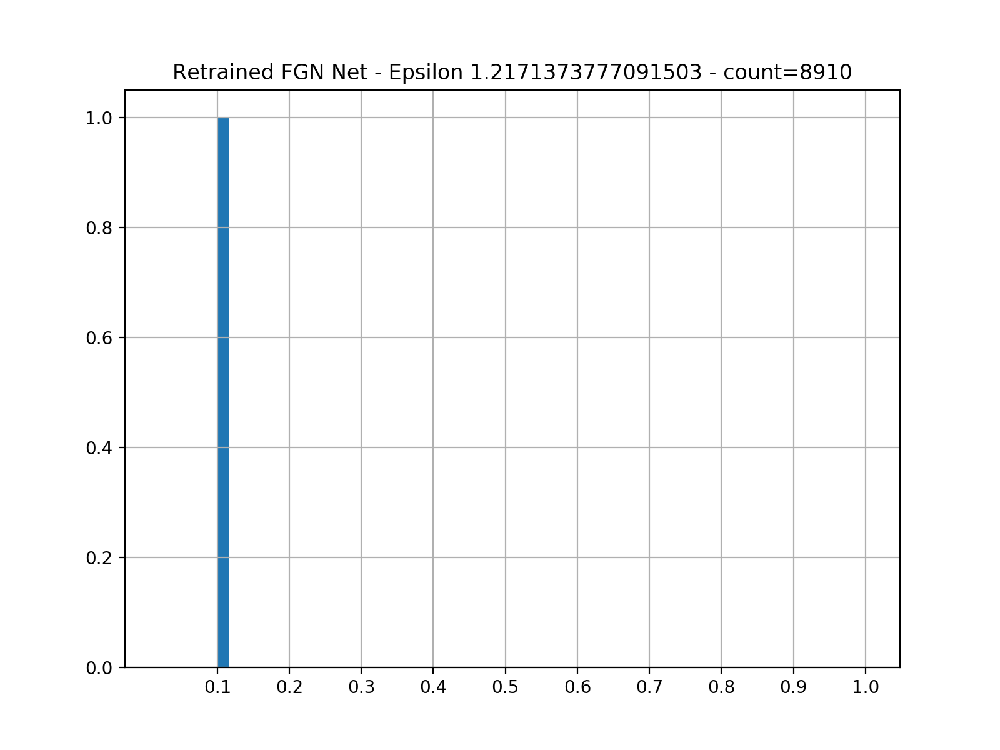

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 2030 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1376 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2642 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2475 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 58 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


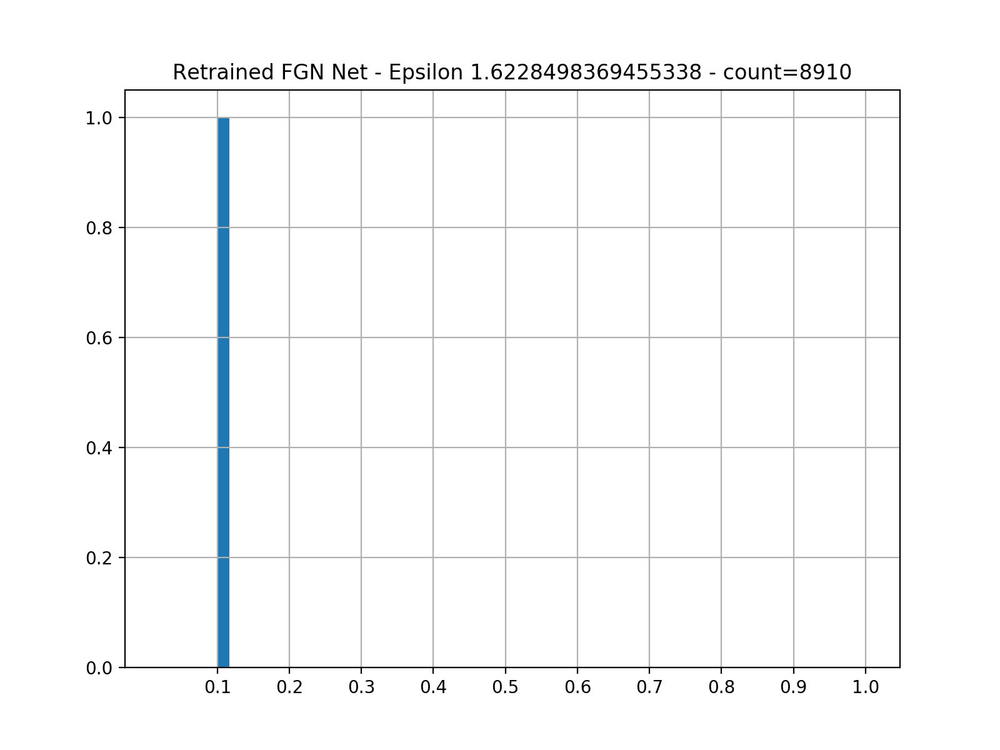

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 8496 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1238 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 662 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1463 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 424 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


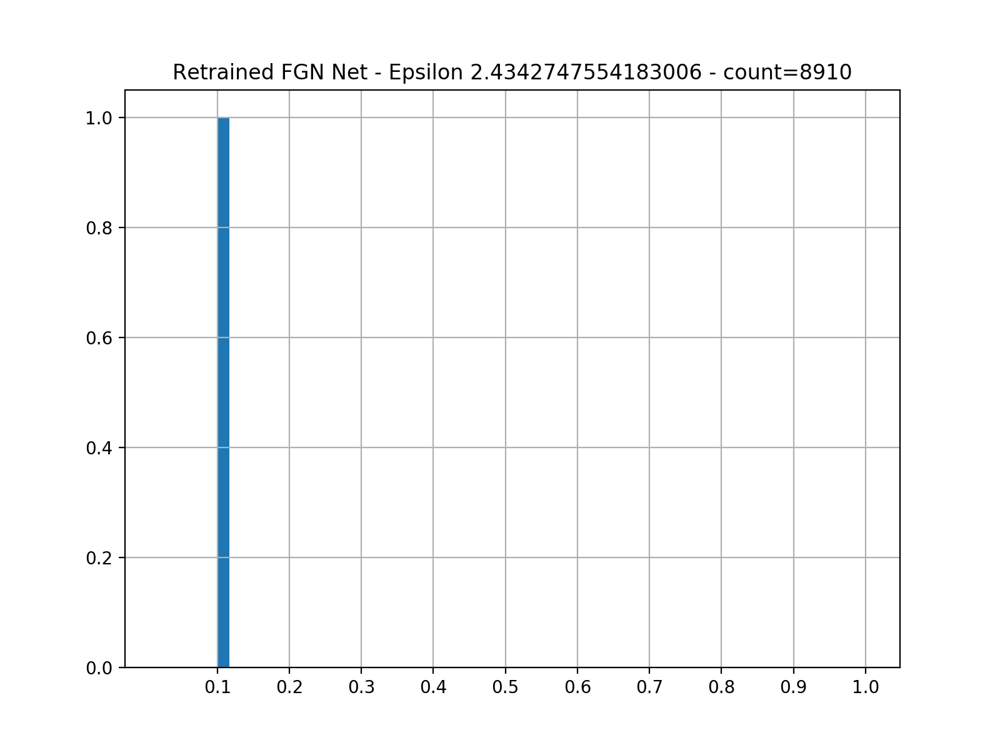

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5570 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6689 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3008 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1375 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1095 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


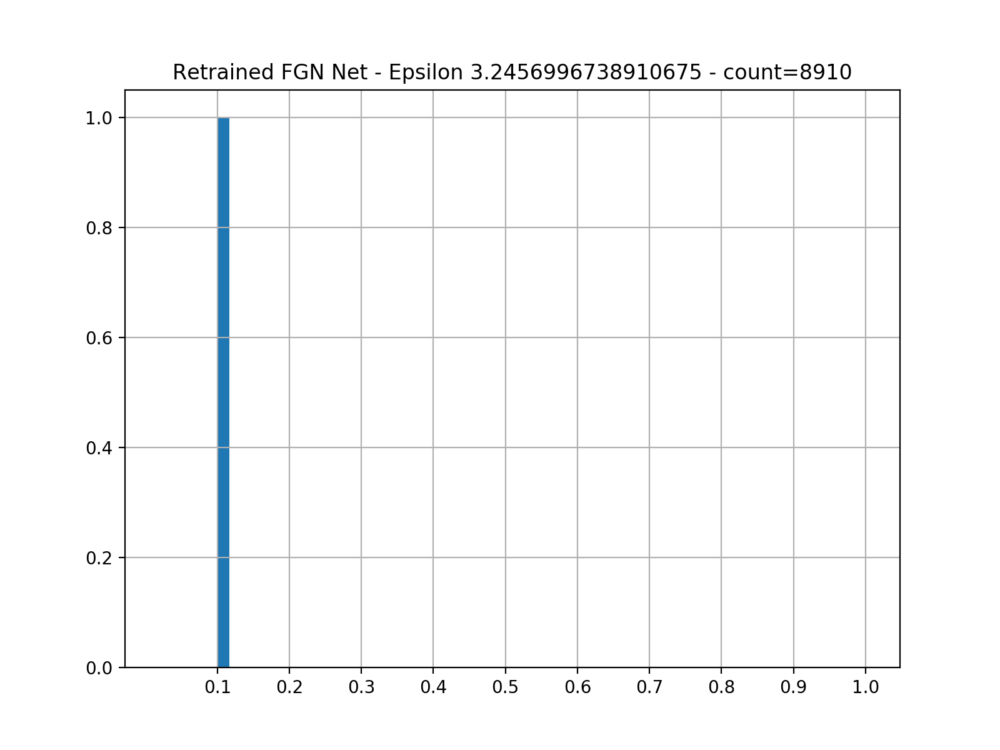

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 2524 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2476 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8462 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4275 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4361 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


In [48]:
# rerun the ret_fgn model on adv examples
for i, ret_fgn_raw_images in enumerate(ret_fgn_raw_successful):
    # turn to dataloader
    dl =  torch.utils.data.DataLoader(torch.utils.data.TensorDataset(ret_fgn_raw_images))
    t = 'Retrained FGN Net - Epsilon {} - count={}'.format(epsilons[i], len(dl))
    fgnh.plot_pred_histogram(ret_fgn_model, dl, title=t, verbose=True)

In [49]:
ret_fgn_f_model(ret_fgn_raw[1][0])

tensor([[3.0271e-19, 1.9147e-19, 4.1086e-19, 2.2461e-19, 2.4105e-19, 1.9502e-19,
         4.5173e-19, 1.0679e-19, 6.1479e-19, 1.8674e-19]], device='cuda:0')

In [50]:
labels[0]

tensor(3, device='cuda:0')

In [51]:
ret_fgn_adv_success[1][0]

tensor(True, device='cuda:0')

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


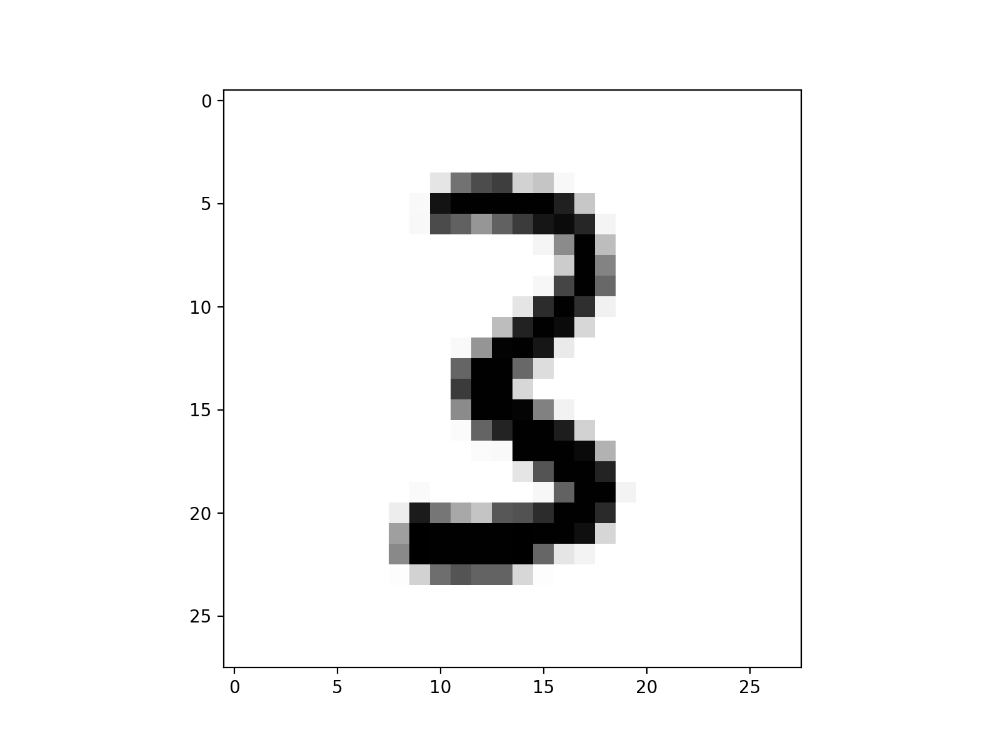

In [53]:
# original image
plt.imshow(images[0].cpu().numpy(), vmin=min_pix, vmax=max_pix, cmap='Greys')
plt.show()

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


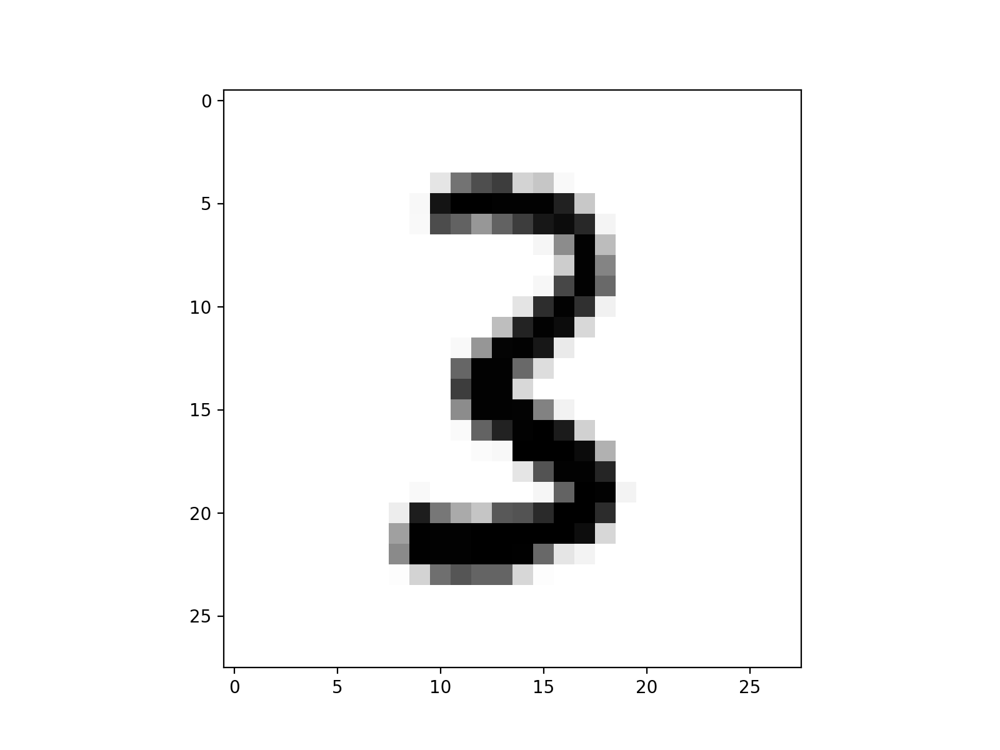

In [54]:
# adversarial image
plt.imshow(ret_fgn_raw[1][0].cpu().numpy(), vmin=min_pix, vmax=max_pix, cmap='Greys')
plt.show()

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


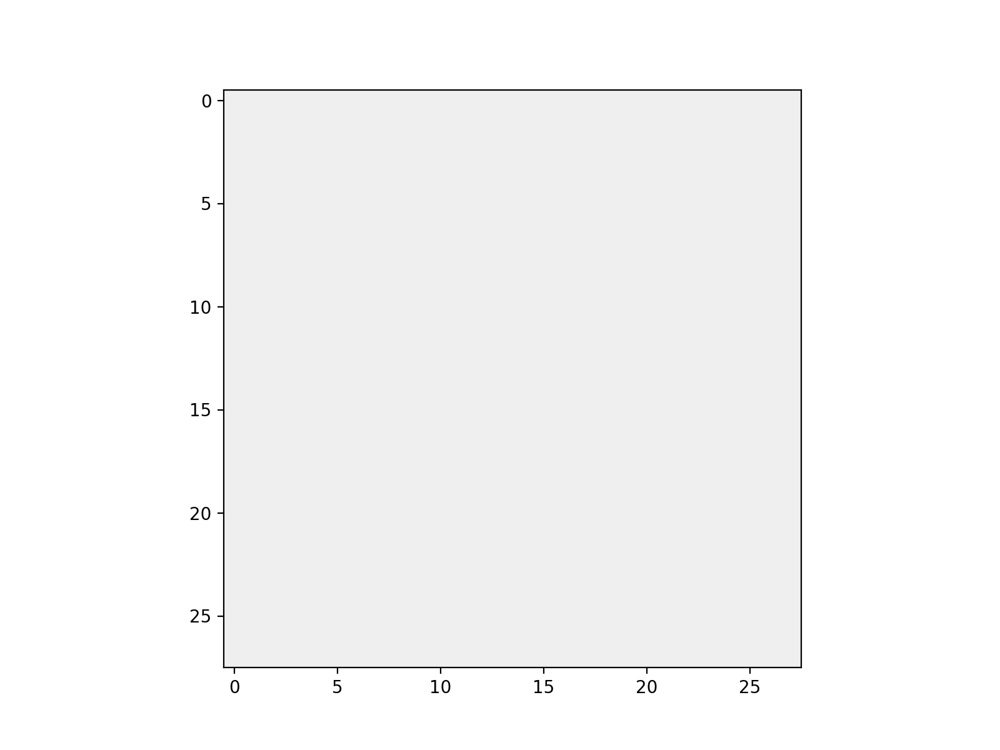

In [55]:
# noise
plt.imshow(images[0].cpu().numpy()-ret_fgn_raw[0][0].cpu().numpy(), vmin=min_pix, vmax=max_pix, cmap='Greys')
plt.show()

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


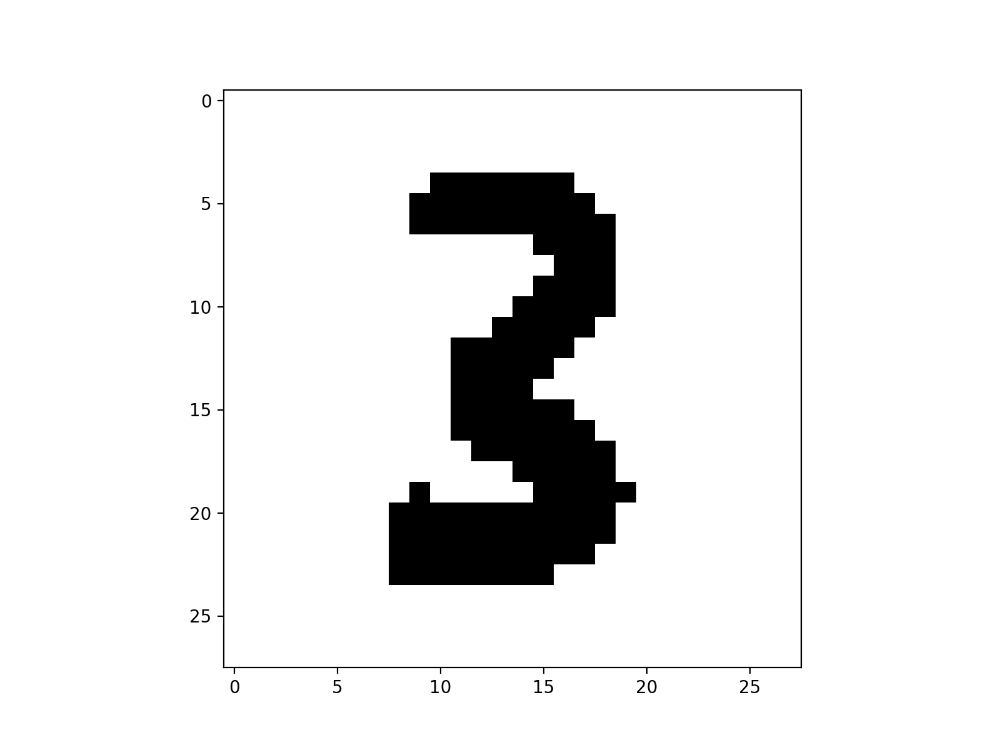

In [57]:
# noise with exagerated contrast
plt.imshow(images[0].cpu().numpy()-ret_fgn_raw[0][0].cpu().numpy(), cmap='Greys')
plt.show()

In [ ]:
# compare prediction confidences 

In [56]:
names = ['classic', 'fgn', 'retrained']
al = ['right', 'mid', 'left']

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


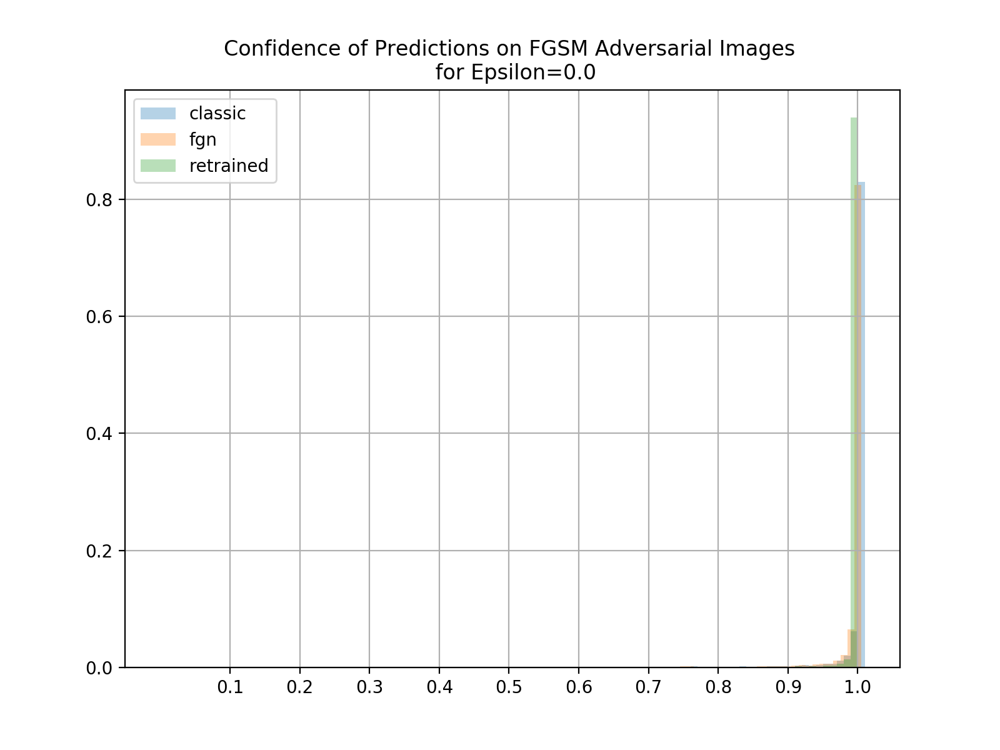

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


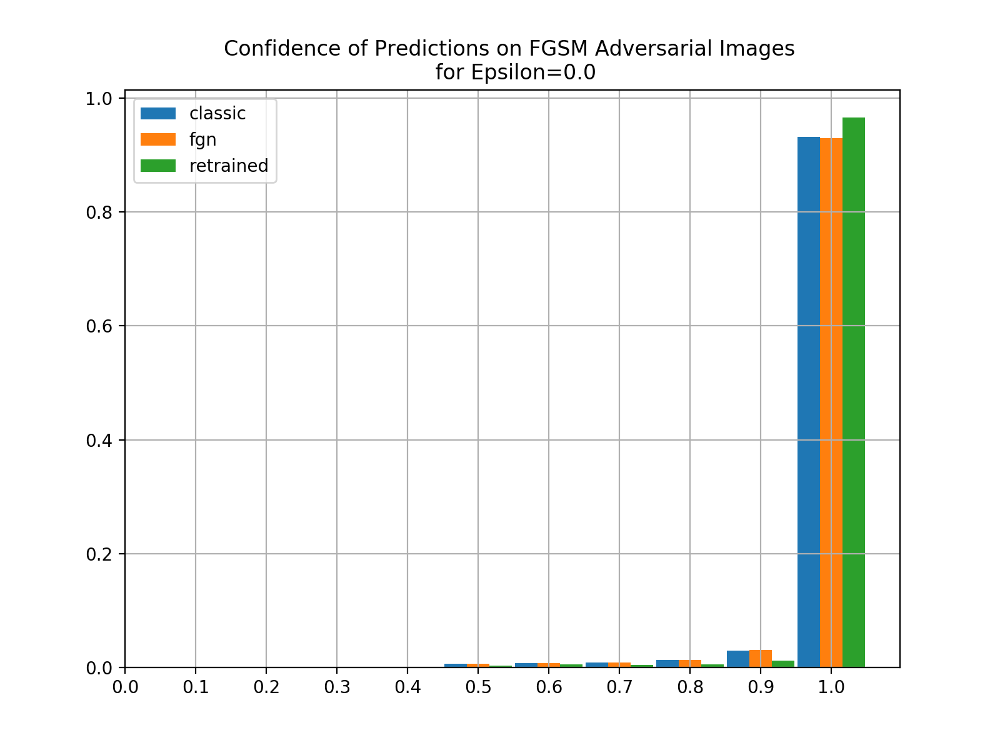

<IPython.core.display.Javascript object>


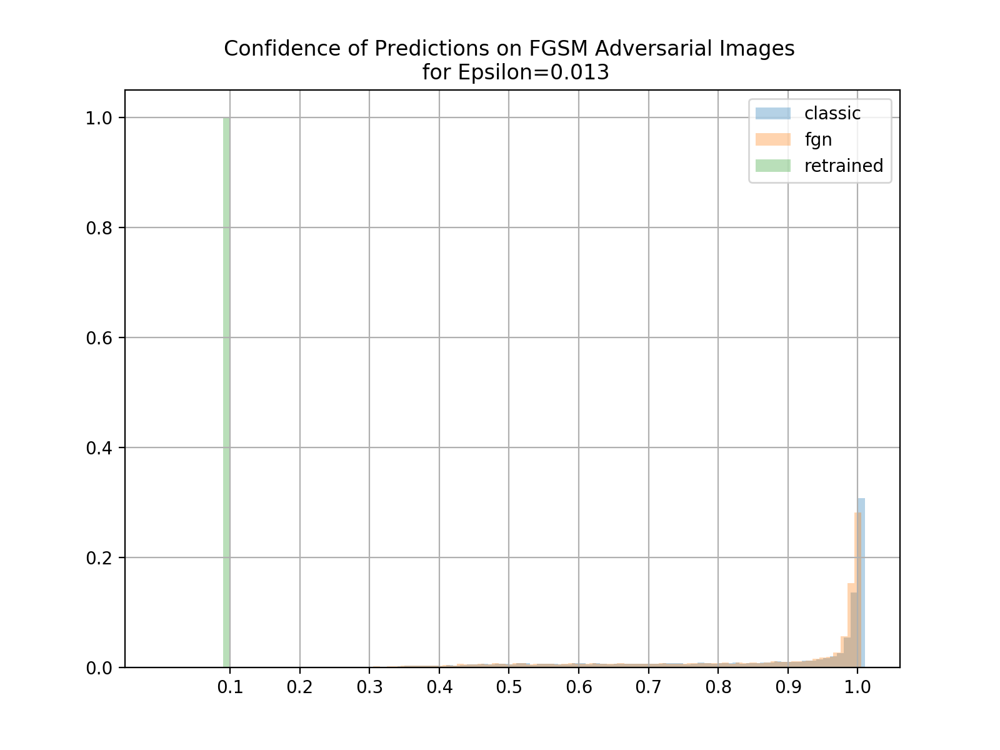

<IPython.core.display.Javascript object>


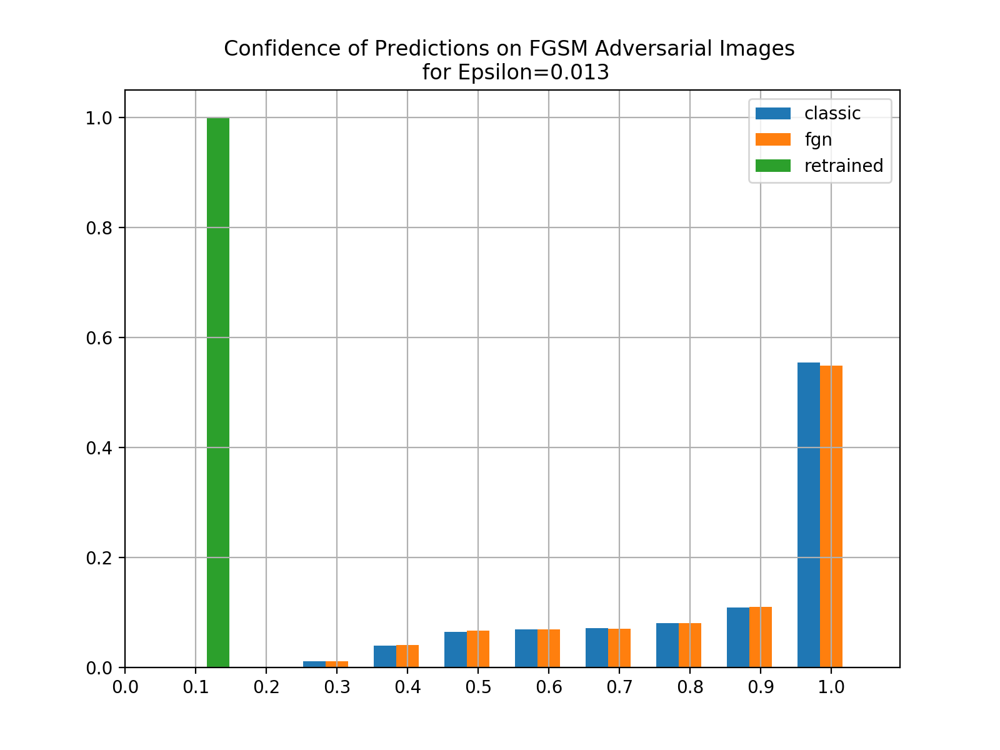

<IPython.core.display.Javascript object>


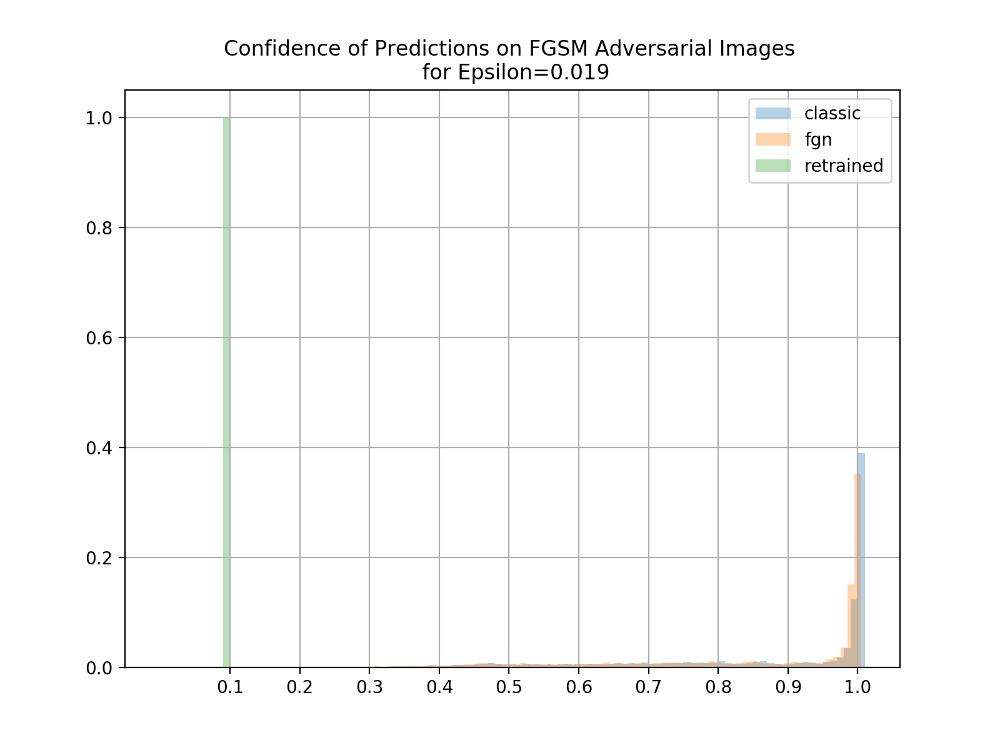

<IPython.core.display.Javascript object>


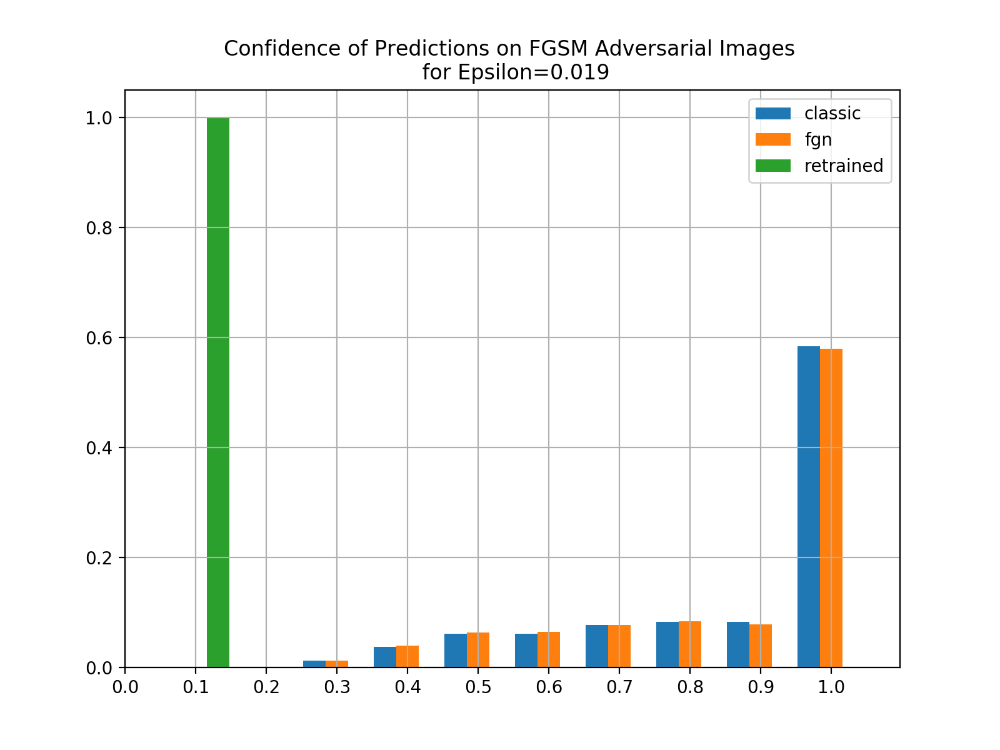

<IPython.core.display.Javascript object>


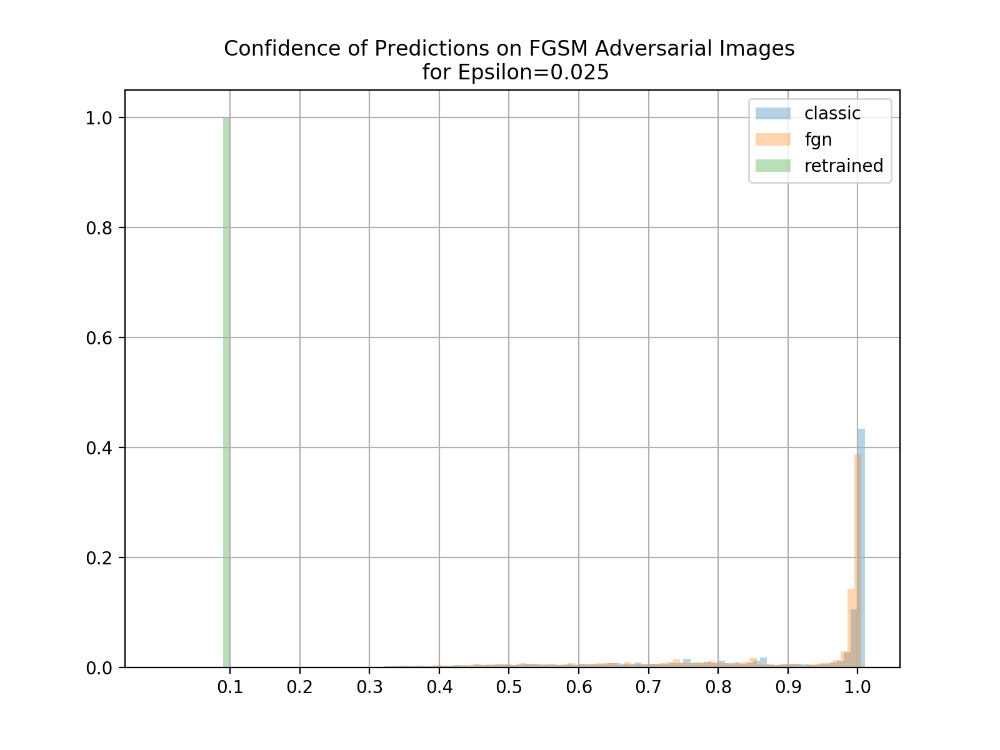

<IPython.core.display.Javascript object>


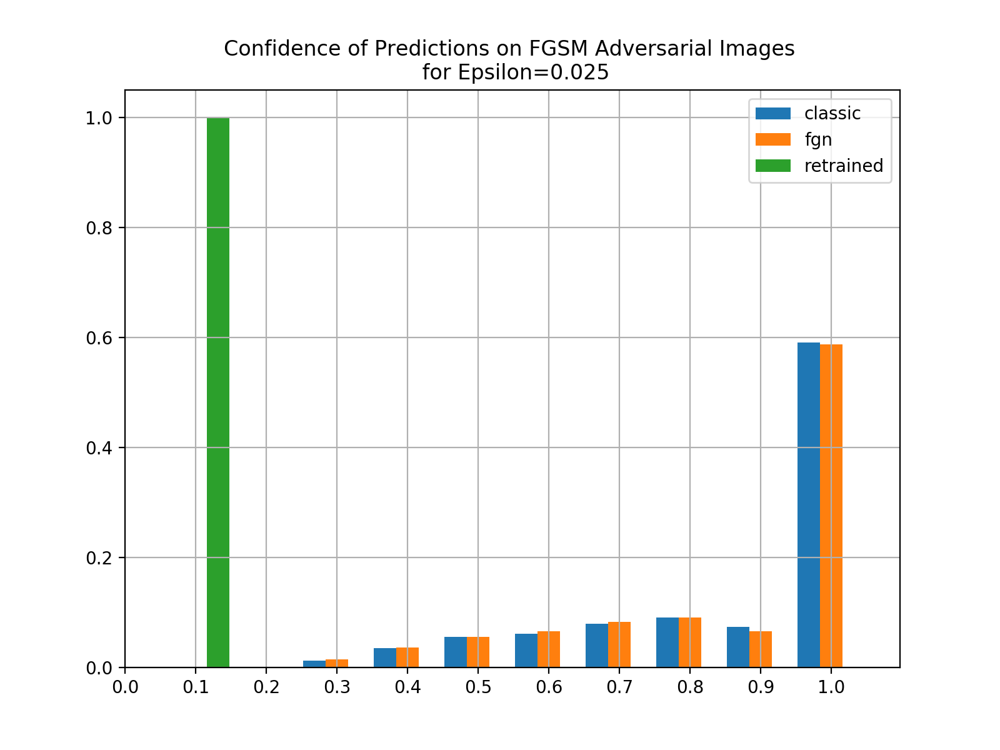

<IPython.core.display.Javascript object>


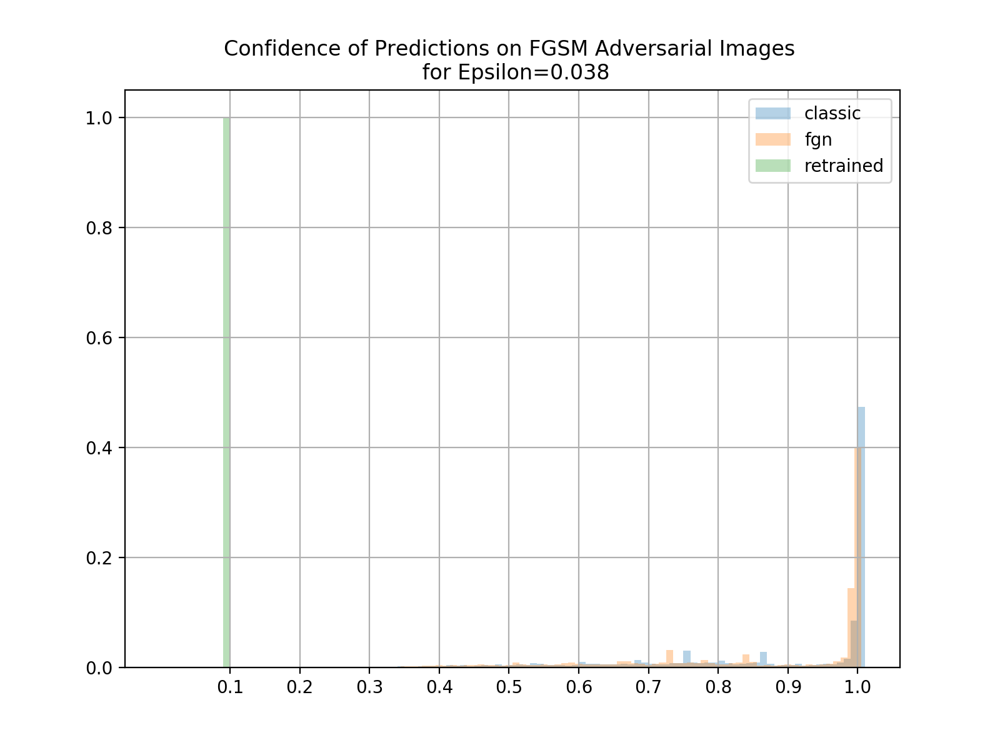

<IPython.core.display.Javascript object>


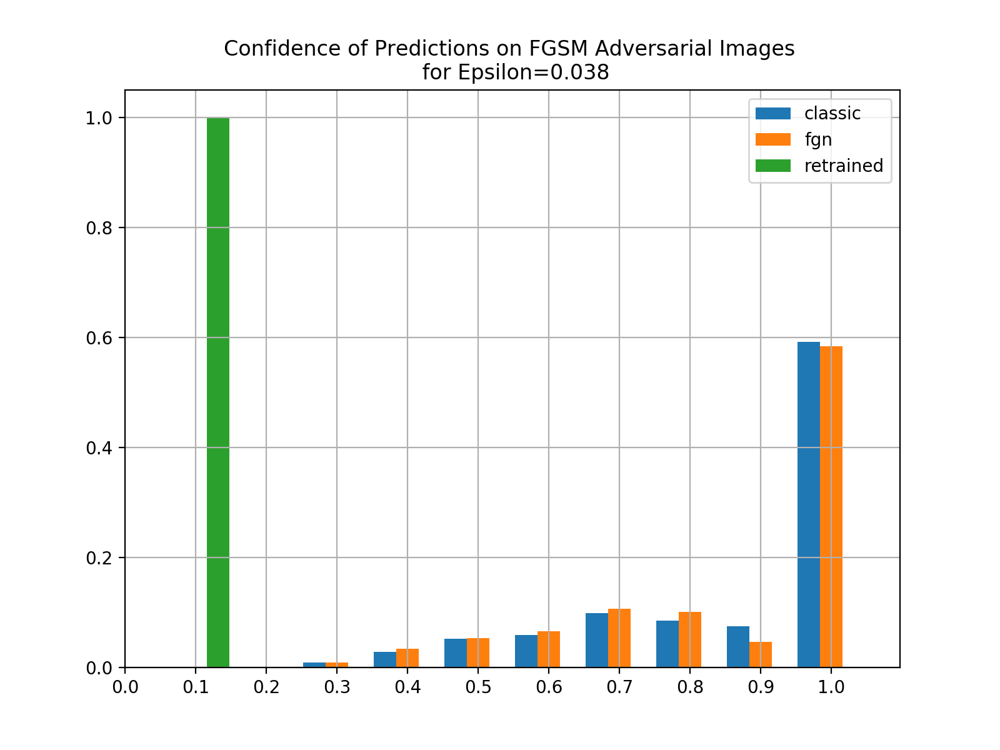

<IPython.core.display.Javascript object>


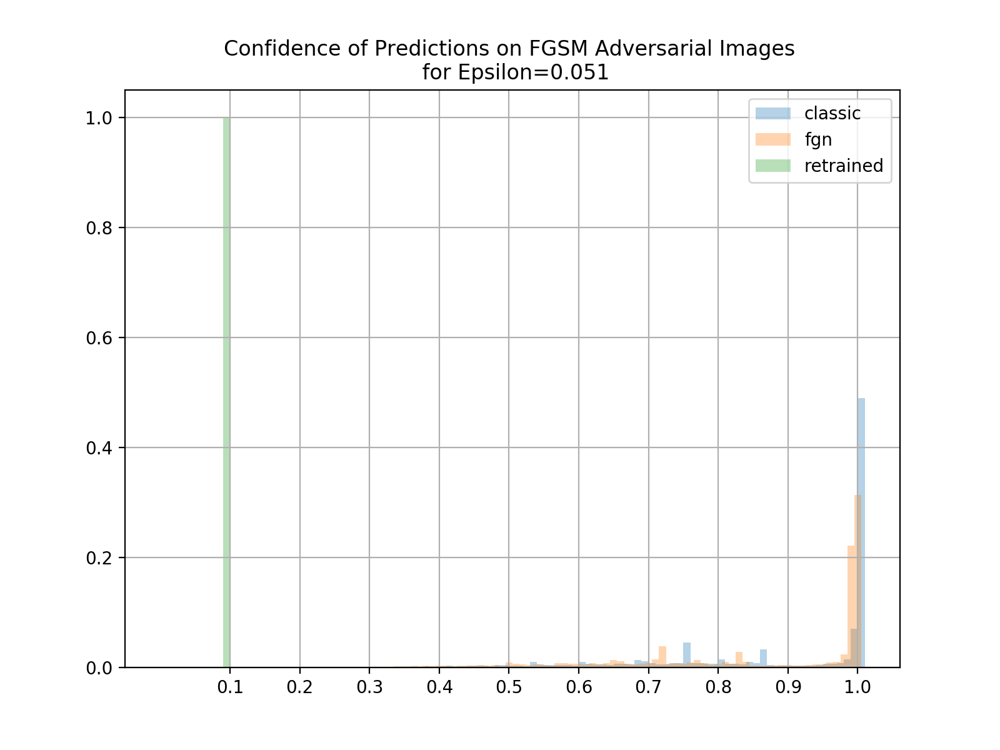

<IPython.core.display.Javascript object>


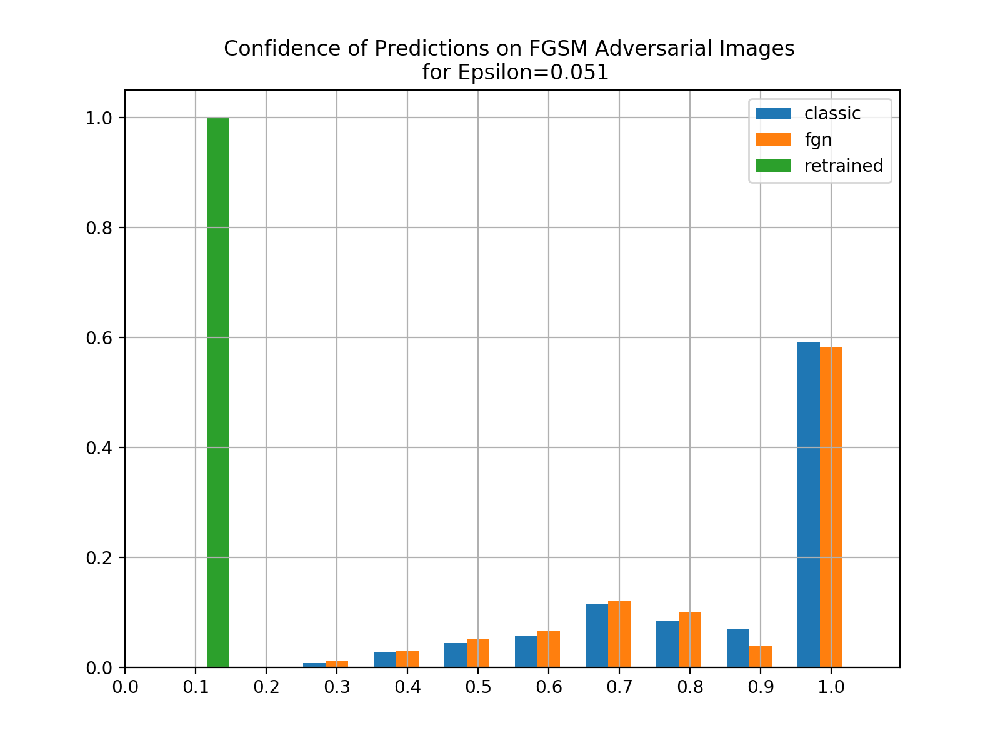

<IPython.core.display.Javascript object>


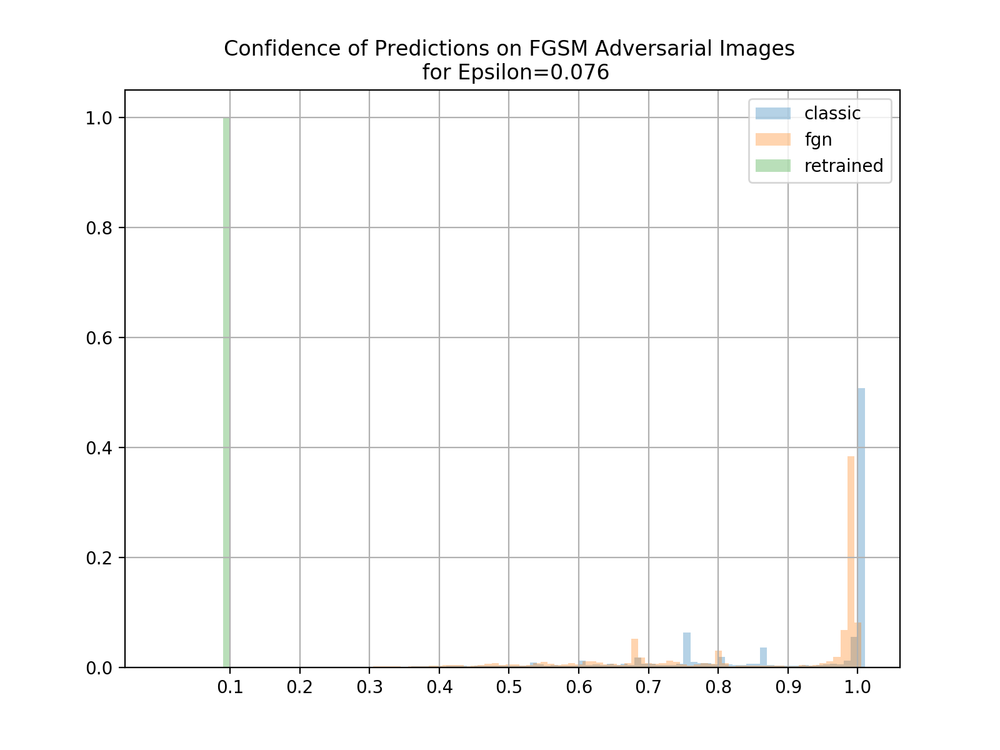

<IPython.core.display.Javascript object>


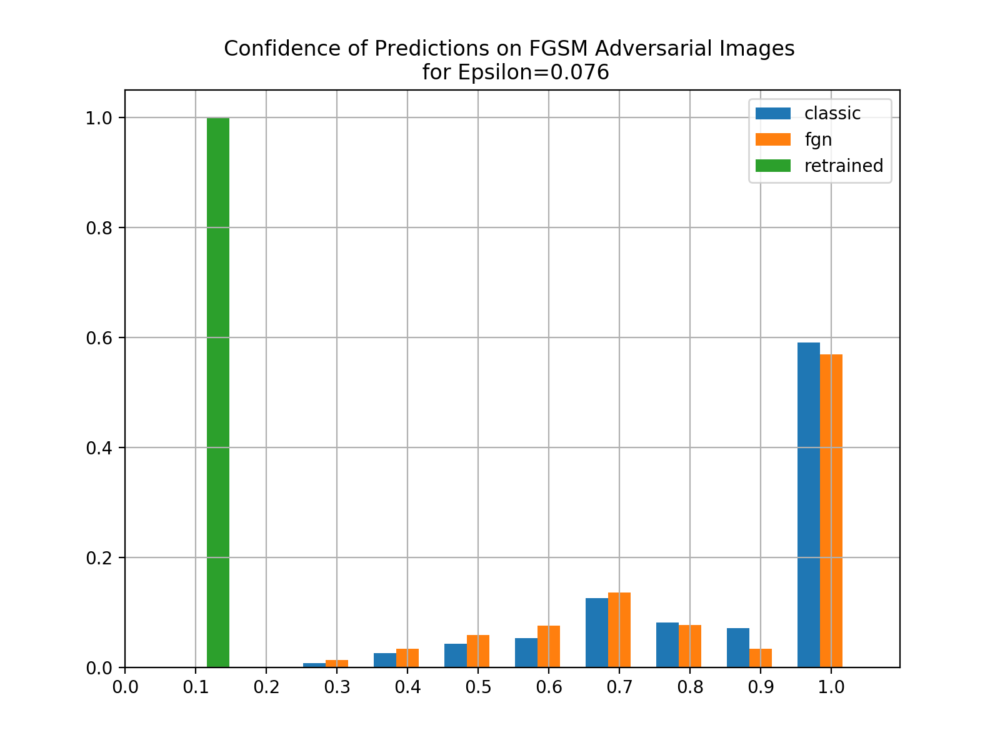

<IPython.core.display.Javascript object>


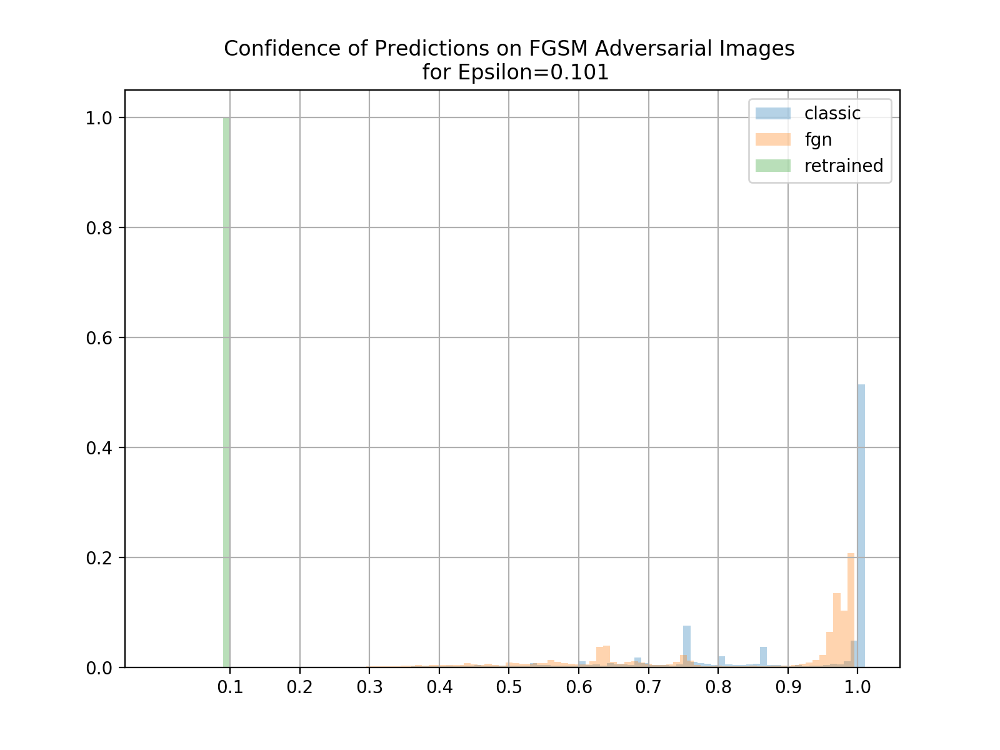

<IPython.core.display.Javascript object>


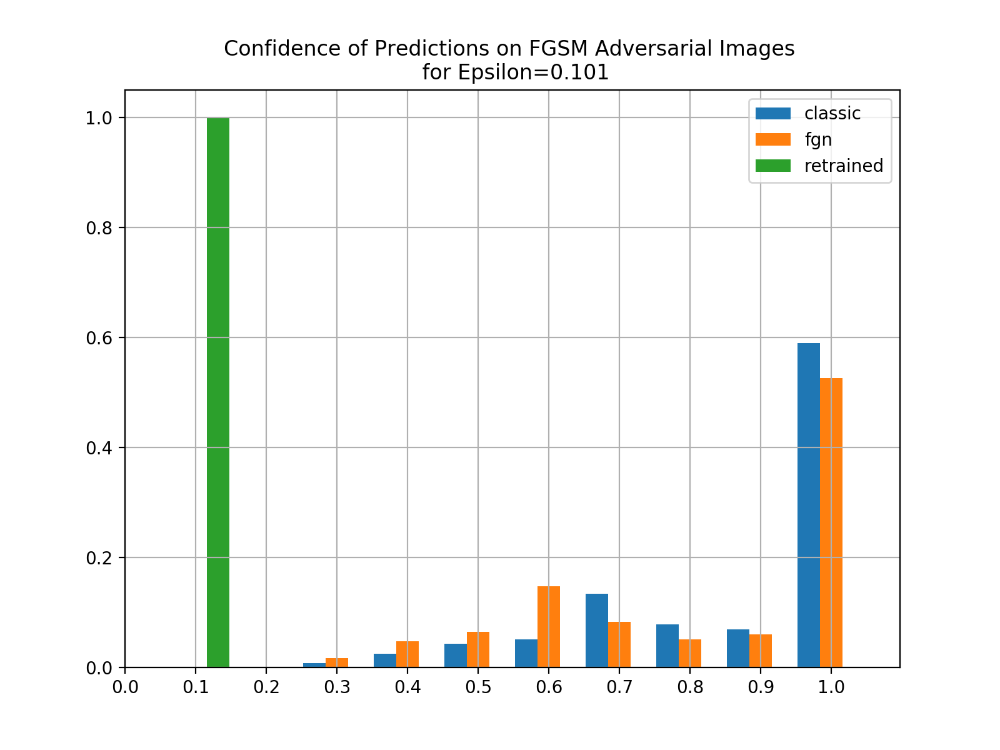

<IPython.core.display.Javascript object>


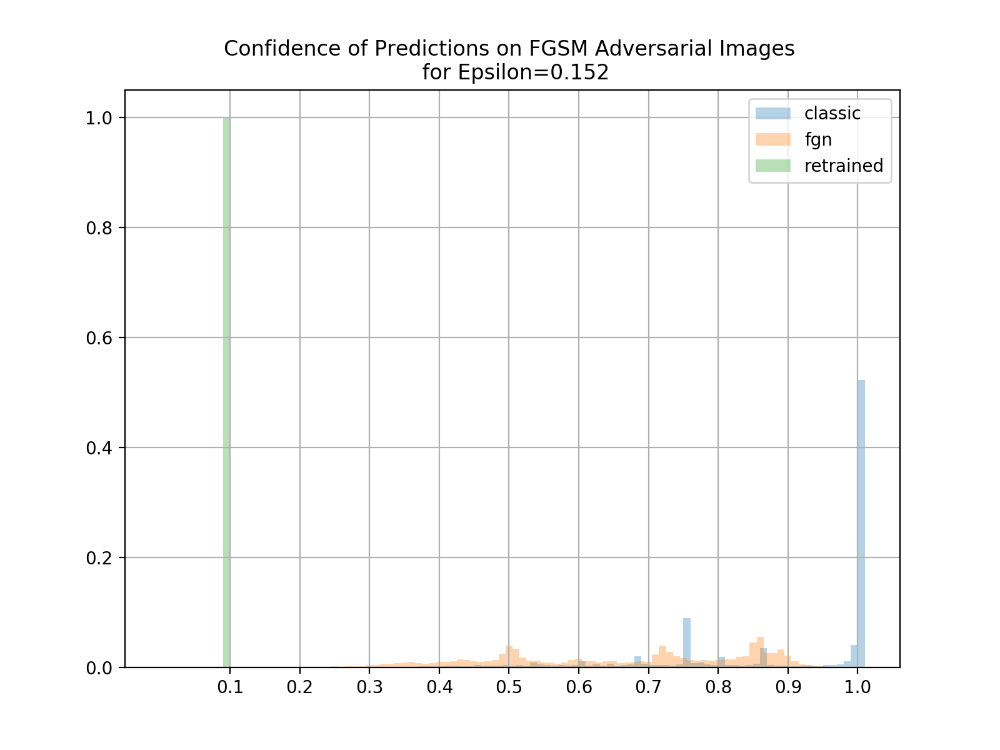

<IPython.core.display.Javascript object>


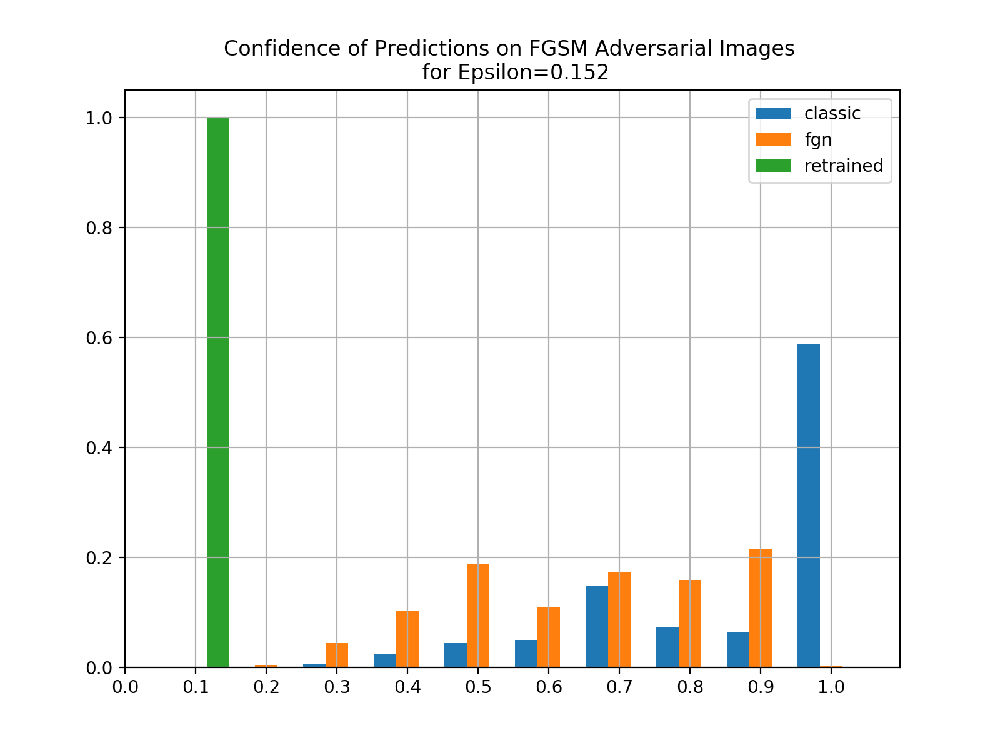

<IPython.core.display.Javascript object>


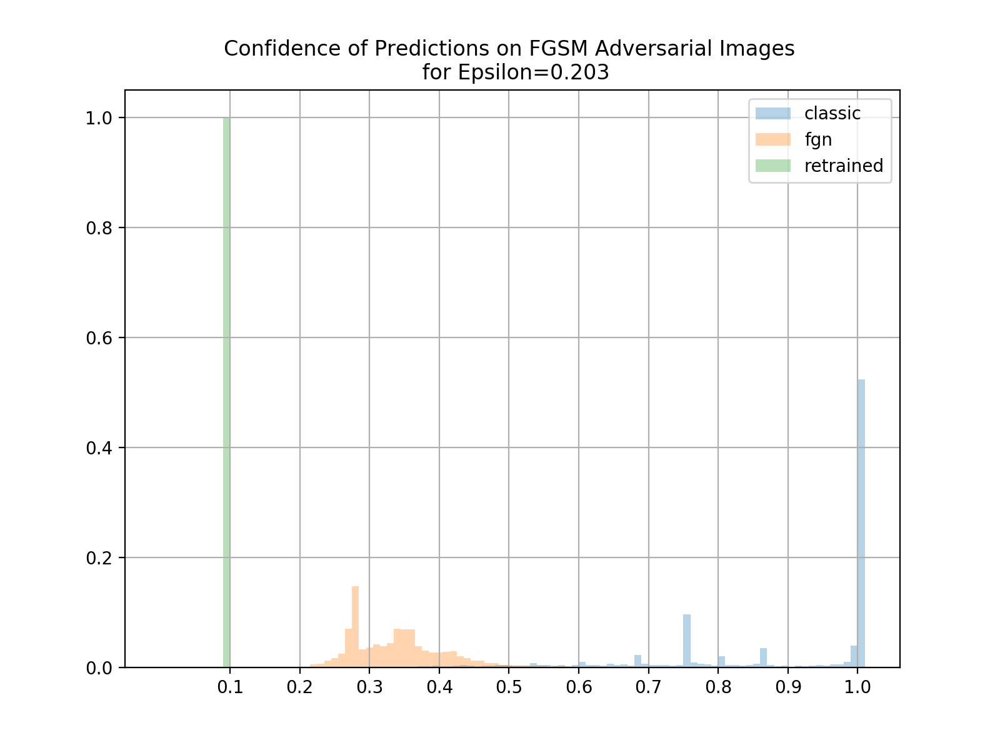

<IPython.core.display.Javascript object>


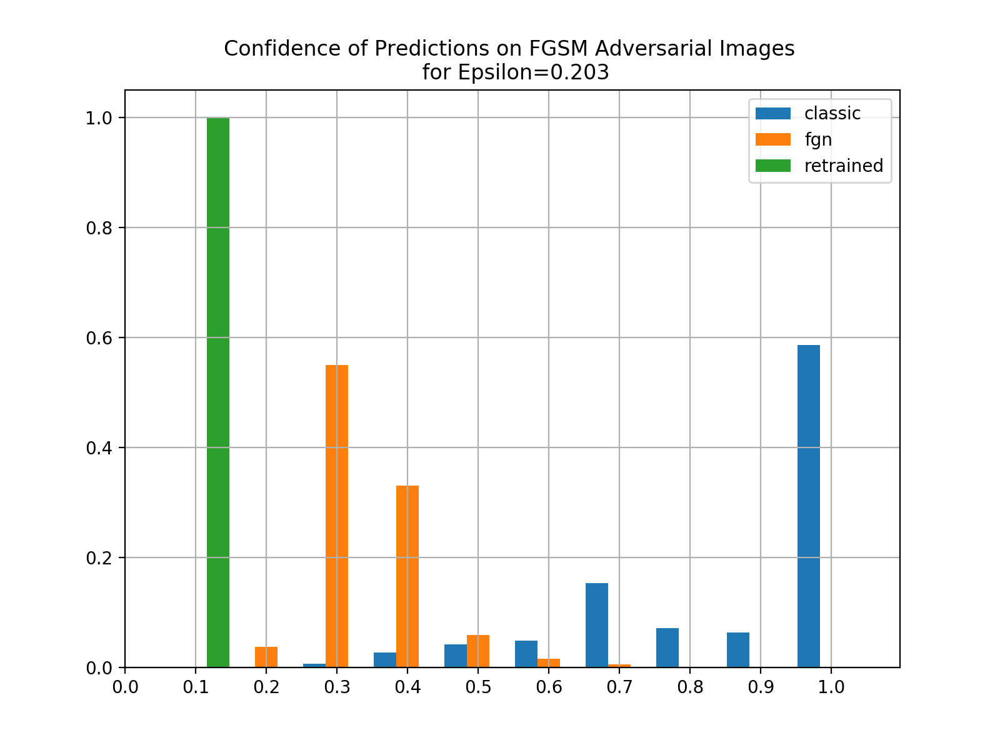

<IPython.core.display.Javascript object>


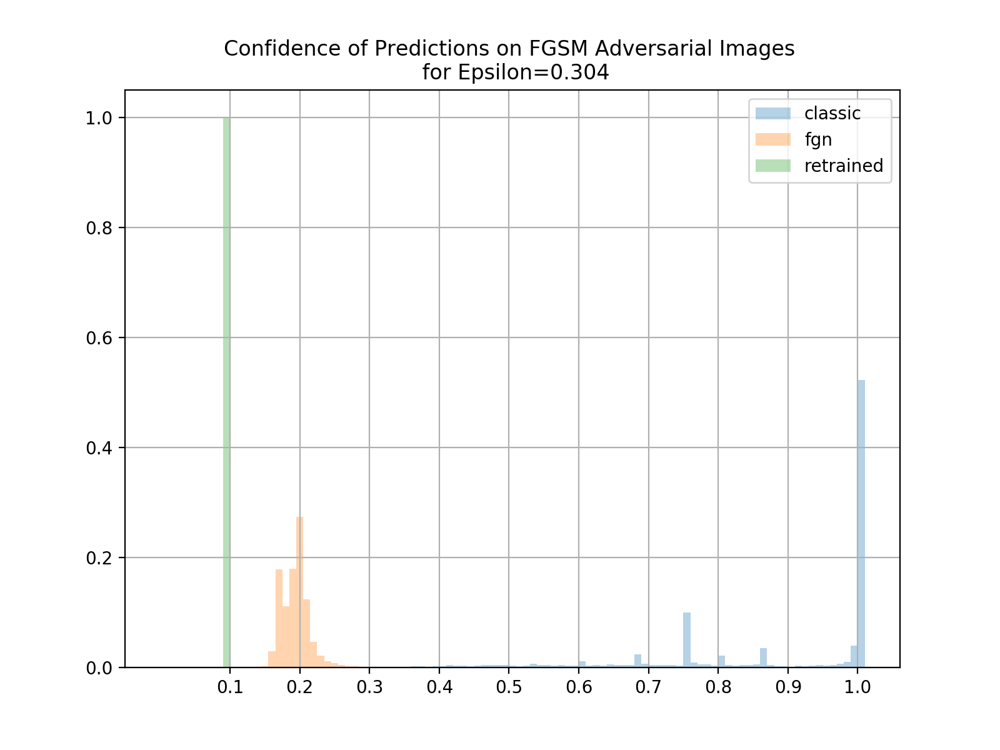

<IPython.core.display.Javascript object>


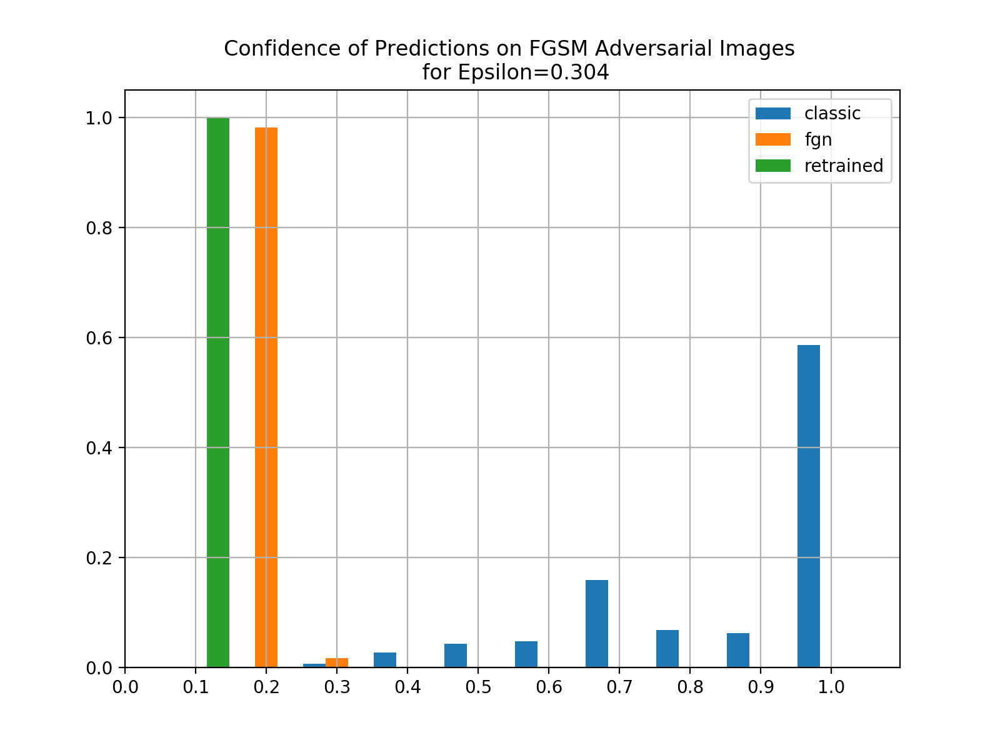

<IPython.core.display.Javascript object>


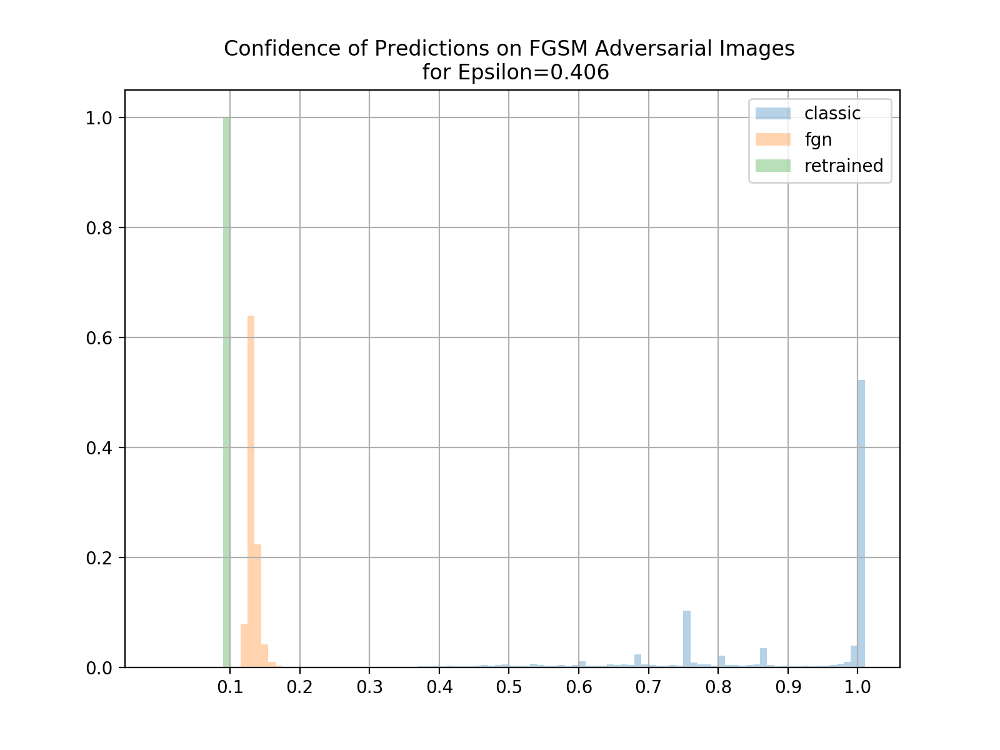

<IPython.core.display.Javascript object>


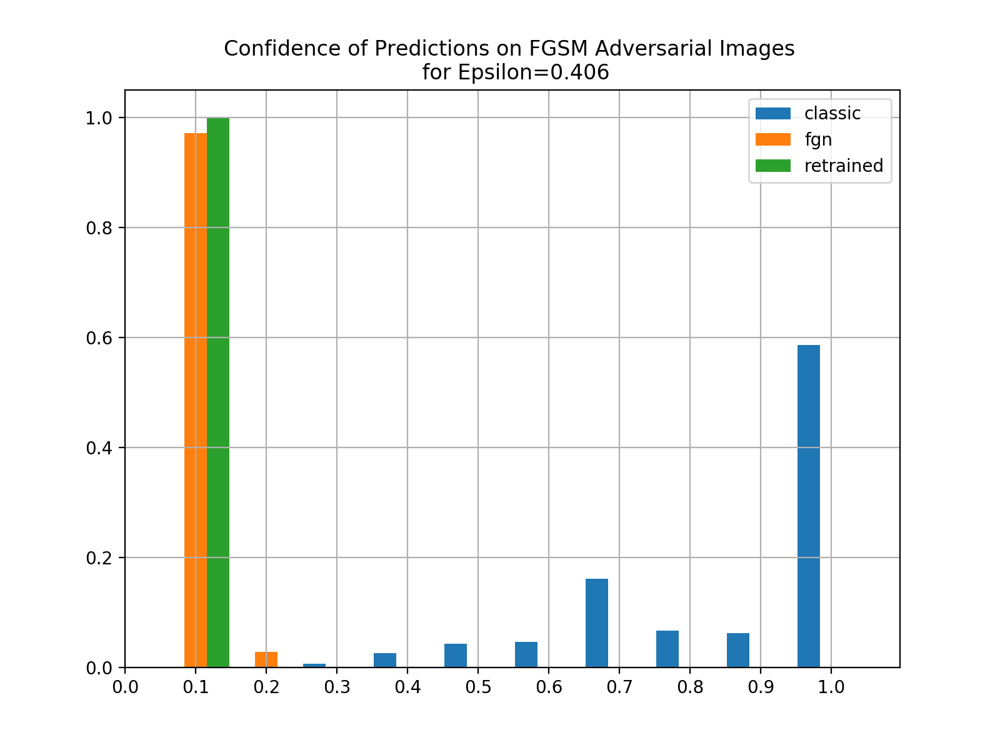

<IPython.core.display.Javascript object>


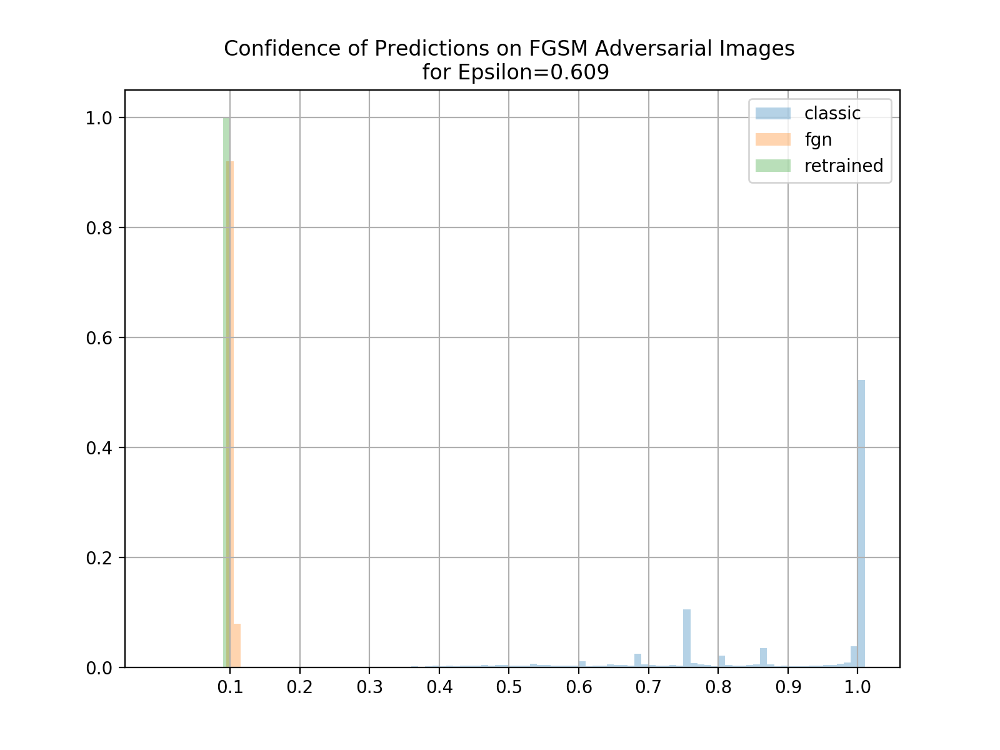

<IPython.core.display.Javascript object>


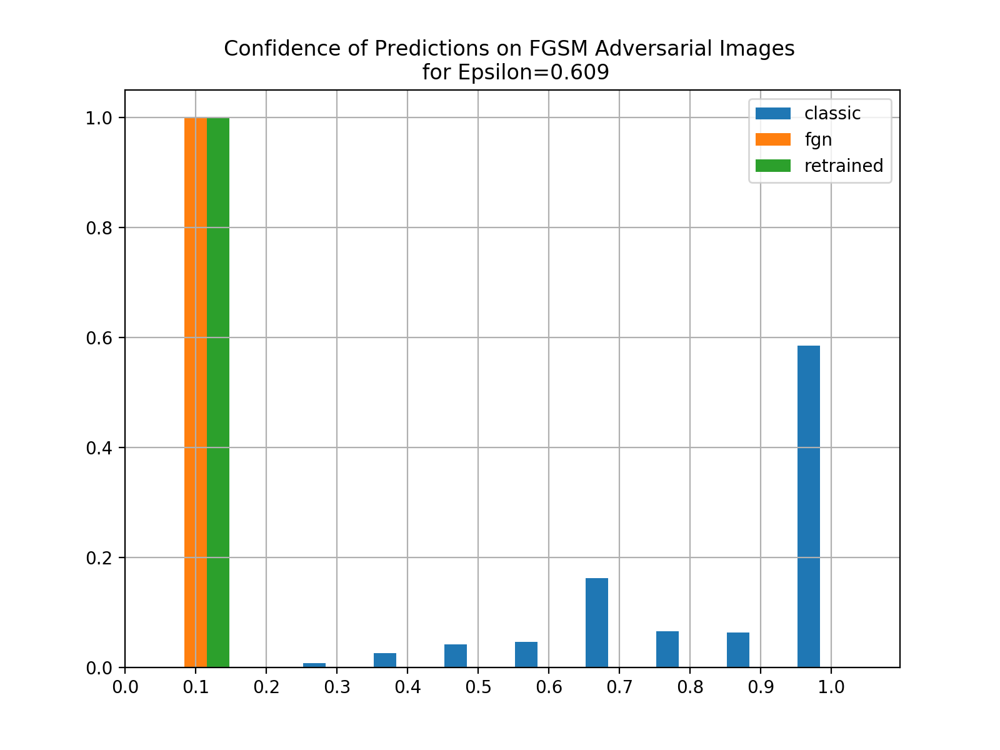

<IPython.core.display.Javascript object>


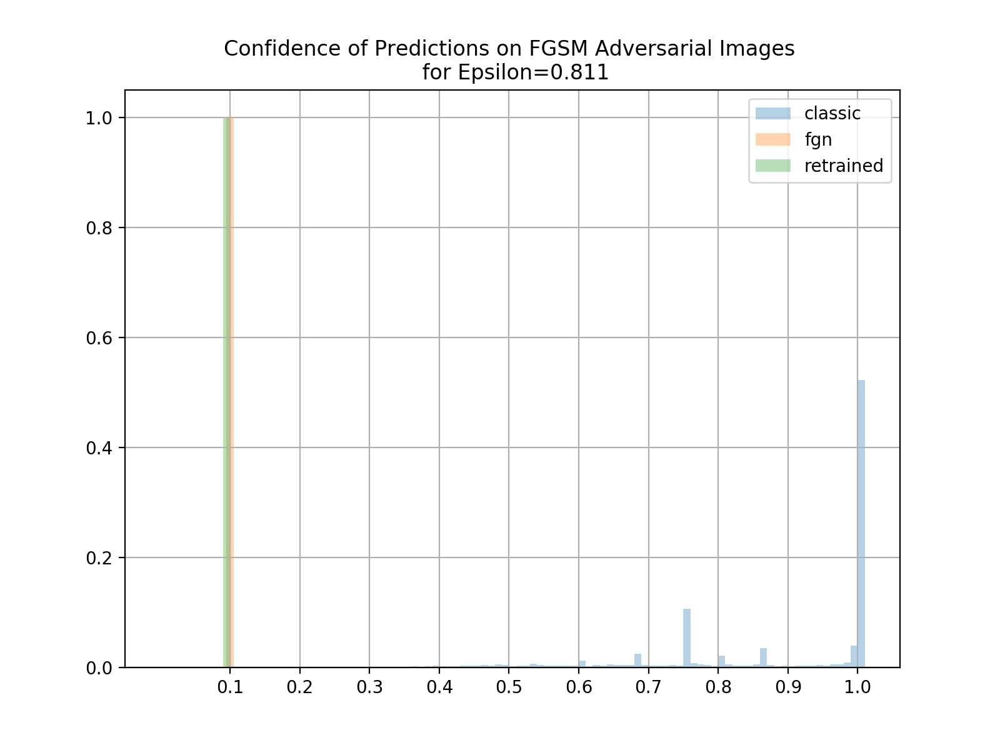

<IPython.core.display.Javascript object>


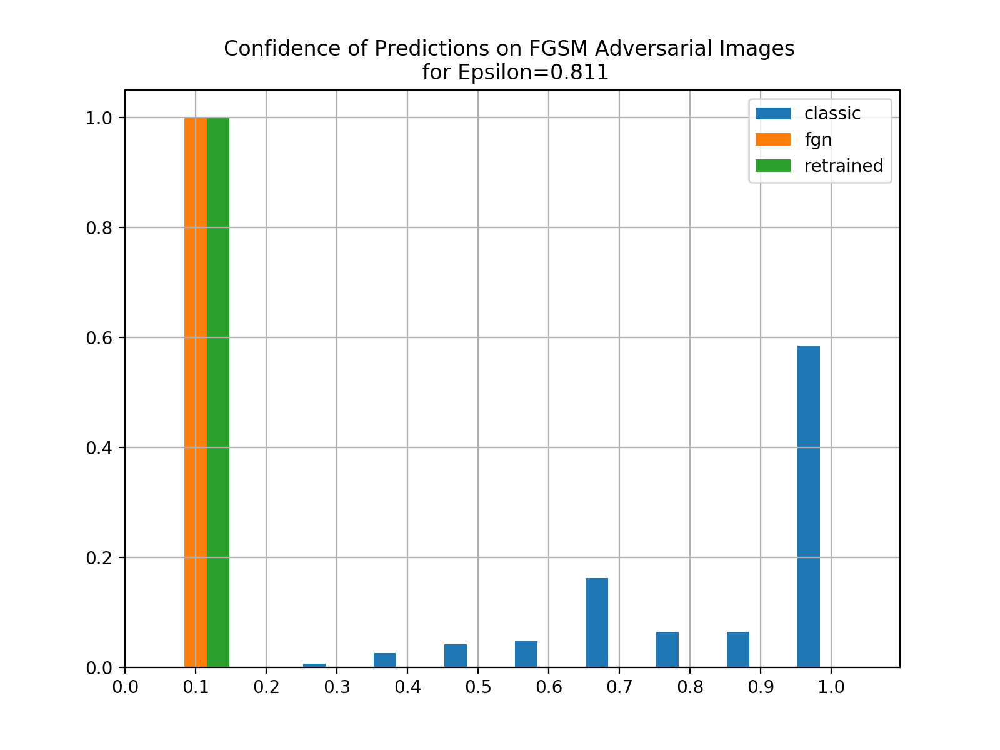

<IPython.core.display.Javascript object>


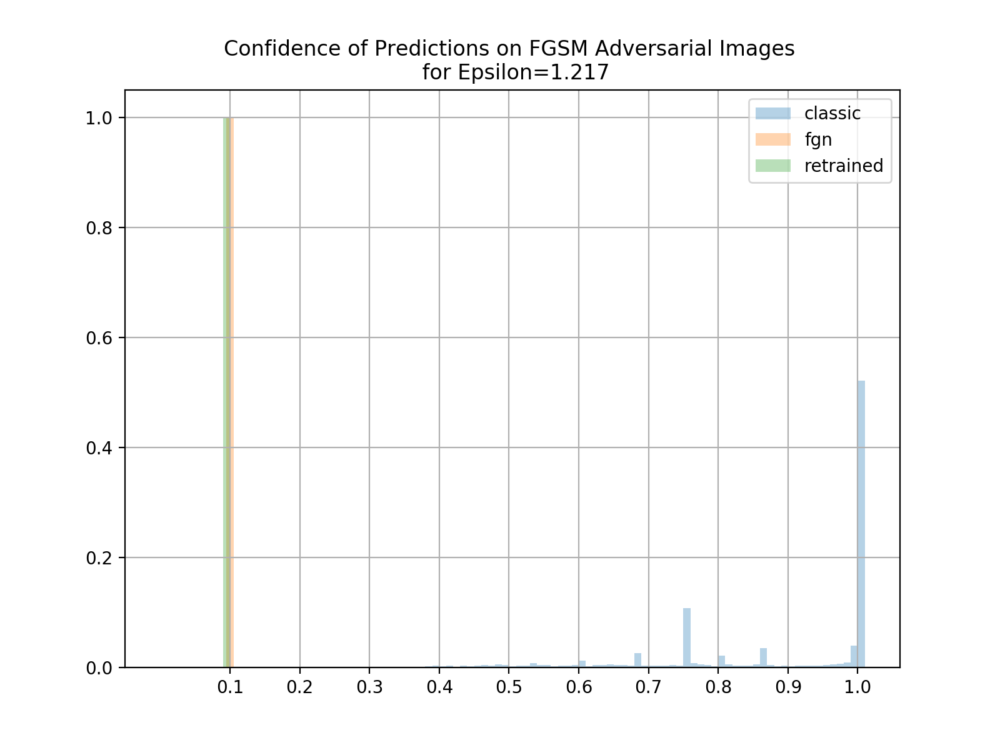

<IPython.core.display.Javascript object>


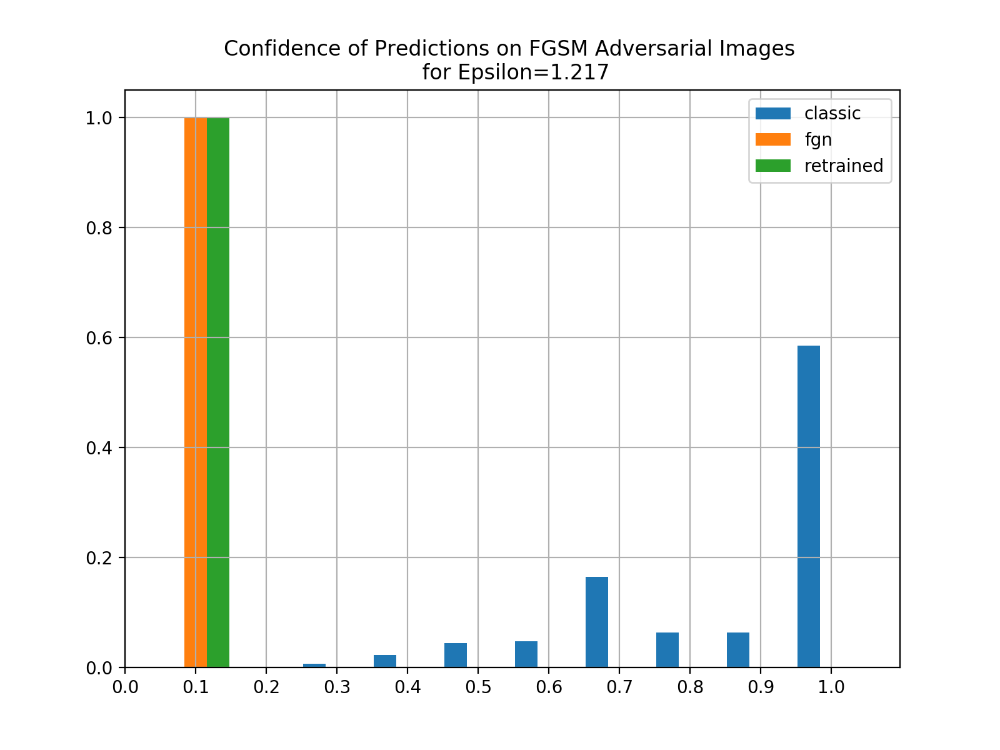

<IPython.core.display.Javascript object>


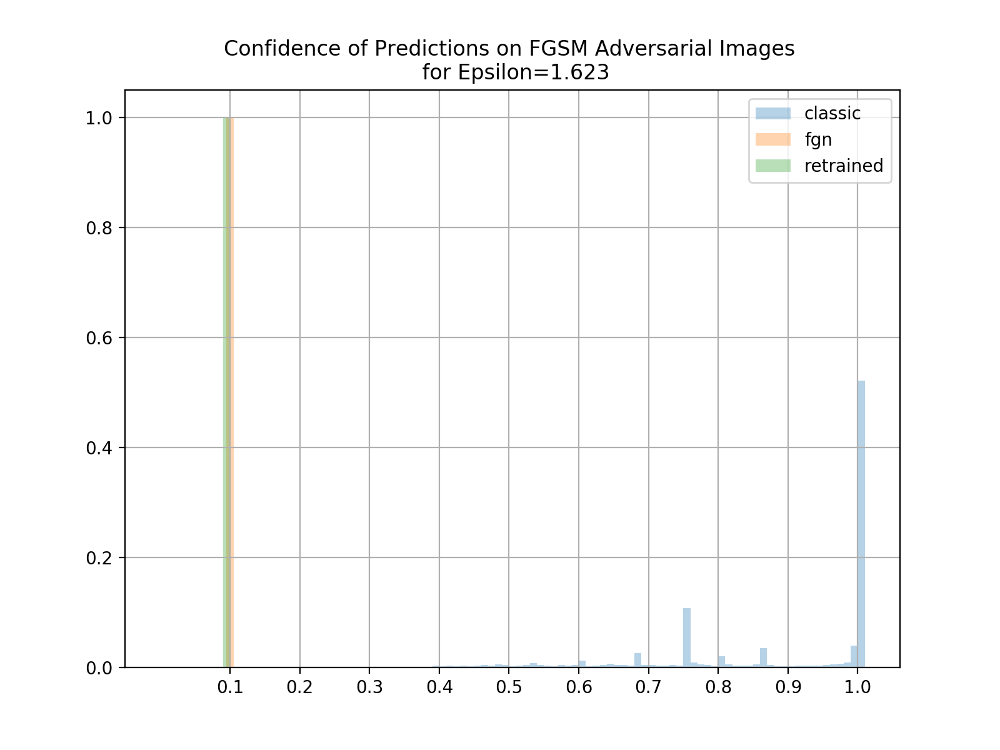

<IPython.core.display.Javascript object>


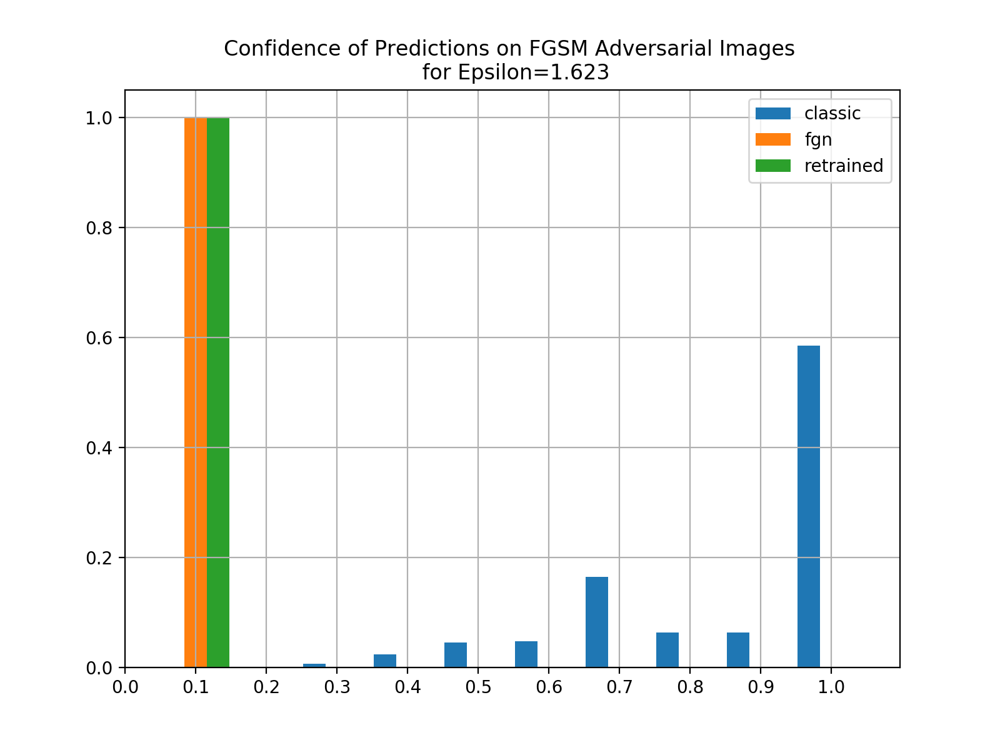

<IPython.core.display.Javascript object>


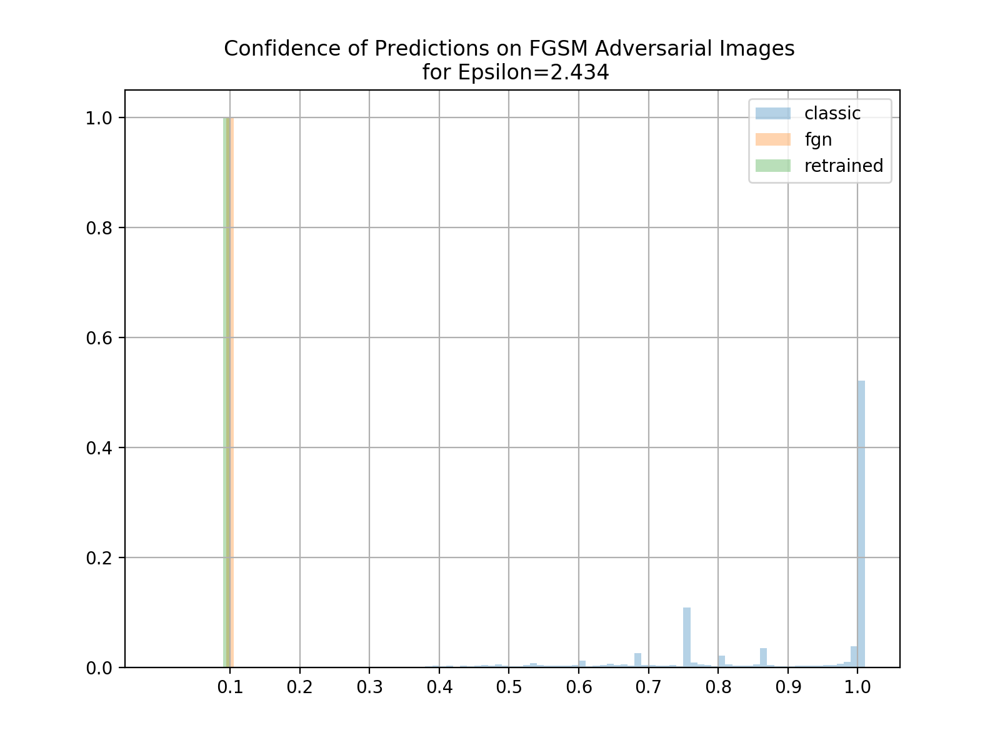

<IPython.core.display.Javascript object>


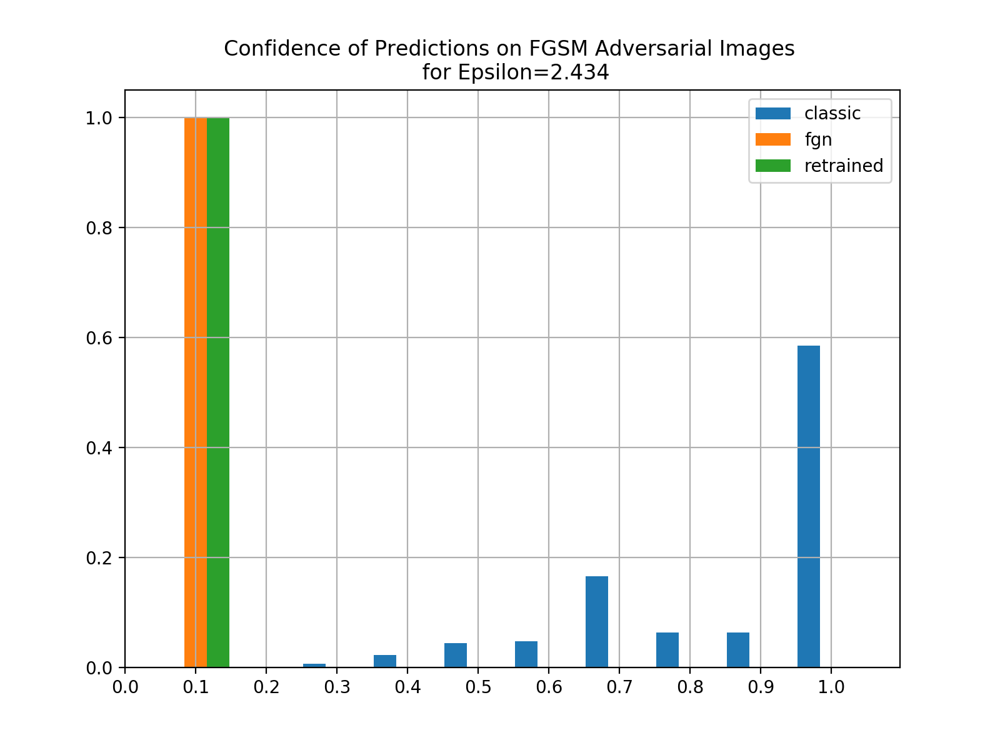

<IPython.core.display.Javascript object>


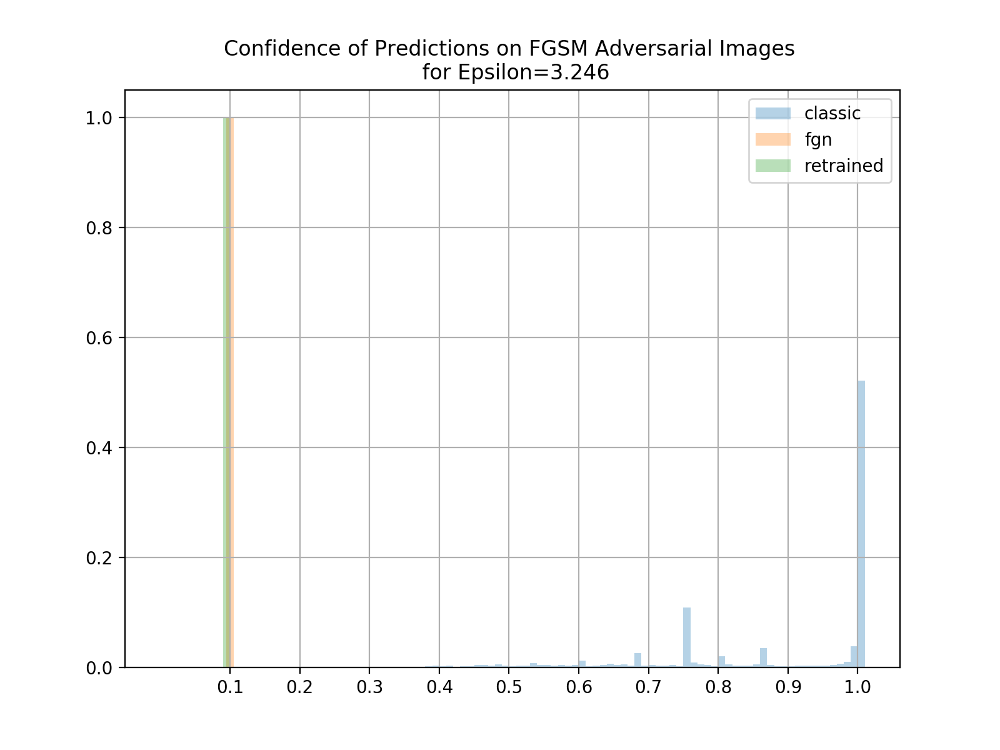

<IPython.core.display.Javascript object>


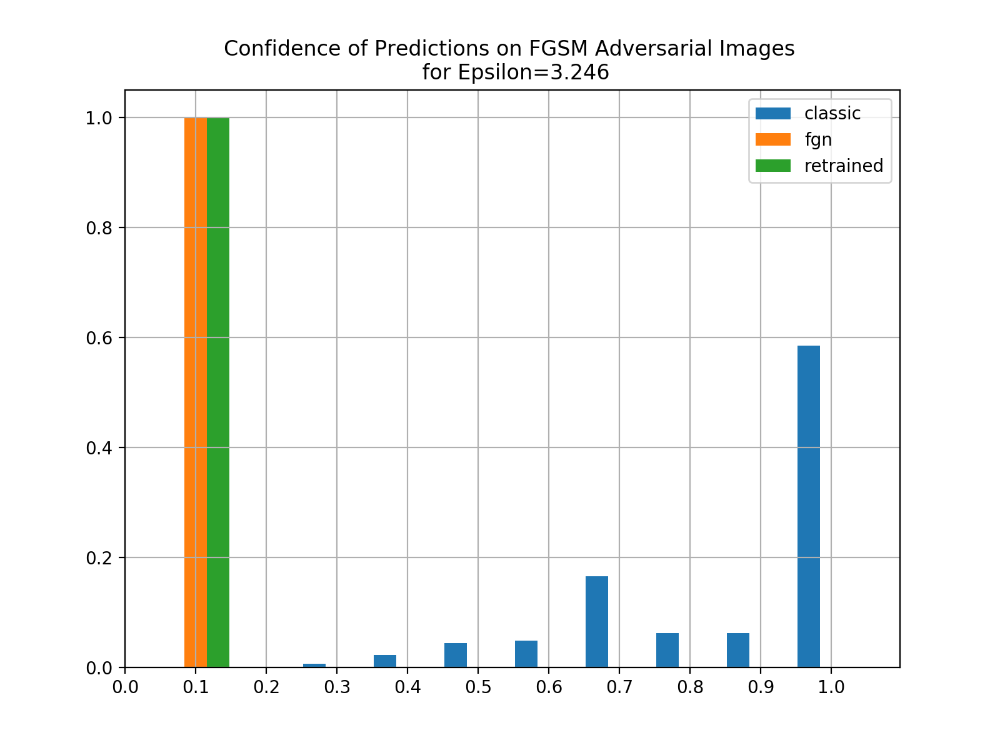

In [58]:
for i, clipped_images in enumerate(zip(classic_clipped, fgn_clipped, ret_fgn_clipped)):
    
    p = [] 
    for n, model in enumerate([classic_model, fgn_model, ret_fgn_model]):
        
        # compute predictions
        model.eval()
        with torch.no_grad(): preds = model(clipped_images[n].to(device))
        preds = preds.cpu().detach().numpy()
        
        # apply softmax for probabilities
        preds_softmax = np.array([np.exp(x)/sum(np.exp(x)) for x in preds.astype('float128')])
        # get the maximums
        preds_maxes = np.max(preds_softmax, axis=1)
        
        p.append(preds_maxes)
        
        # histogram
        plt.hist(preds_maxes,
                 bins=0.005+ np.arange(101)/100,
                 weights=[1/len(preds_maxes) for _ in preds_maxes], 
                 rwidth=1.2,
                 label=names[n],
                 align=al[n], 
                 alpha=0.33)
    plt.xticks((np.arange(10)+1)/10.0)
    plt.legend()
    plt.title('Confidence of Predictions on FGSM Adversarial Images \n for Epsilon={}'.format(np.round(epsilons[i],3)) )
    plt.grid(True)
    plt.show()
        
        
    # histogram
    # weights = np.ones_like(preds_maxes)/len(preds_maxes)
    plt.hist(p, bins= 0.05+ np.arange(11)/10,
             rwidth=0.95, weights=[[1/len(p[0]) for _ in p[0]] for _ in p],
             align='mid',
             label=names )
    plt.xticks(np.arange(11)/10.0)
    plt.legend()
    plt.title('Confidence of Predictions on FGSM Adversarial Images \n for Epsilon={}'.format(np.round(epsilons[i],3)) )
    plt.grid(True)
    plt.show()